In [52]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tnrange, tqdm_notebook
import time
import datetime
from sklearn.metrics import confusion_matrix
from scipy.stats import vonmises
from category_encoders.target_encoder import TargetEncoder
from sklearn.model_selection import KFold
from sklearn.preprocessing import LabelEncoder
import featexp
from featexp import get_univariate_plots
tqdm_notebook().pandas()

C:\Users\champ\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  from ipykernel import kernelapp as app


C:\Users\champ\Anaconda3\lib\site-packages\tqdm\std.py:658: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  from pandas import Panel


In [53]:
def cal_null_number(data):
    total_data_number  = len(data)
    df_null_number = data.isnull().sum()
    df_null_number = df_null_number.loc[df_null_number>0]
    df_null_number = pd.DataFrame(df_null_number.sort_values(ascending=False).reset_index())
    df_null_number.columns = ['feature_name','null_total_number']
    df_null_number['null_ratio'] = round(df_null_number['null_total_number'] / total_data_number,5)
    return df_null_number
def visualize_class_distribution(df_column):
    column_value_count = df_column.value_counts()
    class_label = column_value_count.index
    total_number = column_value_count.values.sum()
    percentage_list = []
    for value in column_value_count:
        percentage = (value / total_number) * 100
        percentage_list.append(percentage)
    g = sns.barplot(class_label,percentage_list)
    for x, y in zip(class_label,percentage_list):
        plt.text(x,y+0.5,round(y,2),ha='center')
    plt.xlabel('class')
    plt.ylabel('percentage')
    plt.title('Class Distribution')
    
def impute_time_zero(x):
    x = str(int(x))
    if len(x) == 1:
        x = '00000' + x
        x = datetime.datetime.strptime(x,"%H%M%S")
        return x
    if len(x) == 2:
        x = '0000' + x
        x = datetime.datetime.strptime(x,"%H%M%S")
        return x 
    if len(x) == 3:
        x = '000' + x
        x = datetime.datetime.strptime(x,"%H%M%S")
        return x 
    if len(x) == 4:
        x = '00' + x
        x = datetime.datetime.strptime(x,"%H%M%S")
        return x 
    if len(x) == 5:
        x = '0' + x
        x = datetime.datetime.strptime(x,"%H%M%S")
        return x 
    if len(x) == 6:
        x = datetime.datetime.strptime(x,"%H%M%S")
        return x
def time_to_second(x):
    x = x.time()
    hour = x.hour
    minute = x.minute
    second = x.second
    total_second = 3600*hour + 60*minute + second
    return total_second

def time_to_hour(x):
    x = x.time()
    hour = x.hour
    return hour

In [54]:
train_data = pd.read_csv('train.csv')
test_data = pd.read_csv('test.csv')
test_data_id = test_data['txkey']
total_data = pd.concat([train_data,test_data],sort=False)

#loctm
train_data['loctm'] = train_data['loctm'].apply(impute_time_zero)
train_data['hour'] = train_data['loctm'].apply(time_to_hour)
train_data['loctm'] = train_data['loctm'].apply(time_to_second)

pd.set_option('display.max_columns',500)
pd.set_option('display.max_rows',500)

# 各欄位特徵不在測試資料集的比例

In [5]:
def cal_feature_in_test_data_ratio(train_data,test_data,target):
    column_list = []
    in_test_data_ratio_list = []
    for column in train_data.columns:
        if column != target:
            column_unique = train_data[column].unique()
            test_data_number = len(test_data)
            in_test_data_number = len(test_data.loc[test_data[column].isin(column_unique)])
            in_test_data_ratio = in_test_data_number / test_data_number
            column_list.append(column)
            in_test_data_ratio_list.append(in_test_data_ratio)
    in_test_data_df = pd.DataFrame({'column':column_list,'in_test_data_ratio':in_test_data_ratio_list})
    return in_test_data_df

In [7]:
in_test_data_df = cal_feature_in_test_data_ratio(train_data,test_data,'fraud_ind').sort_values(by='in_test_data_ratio')

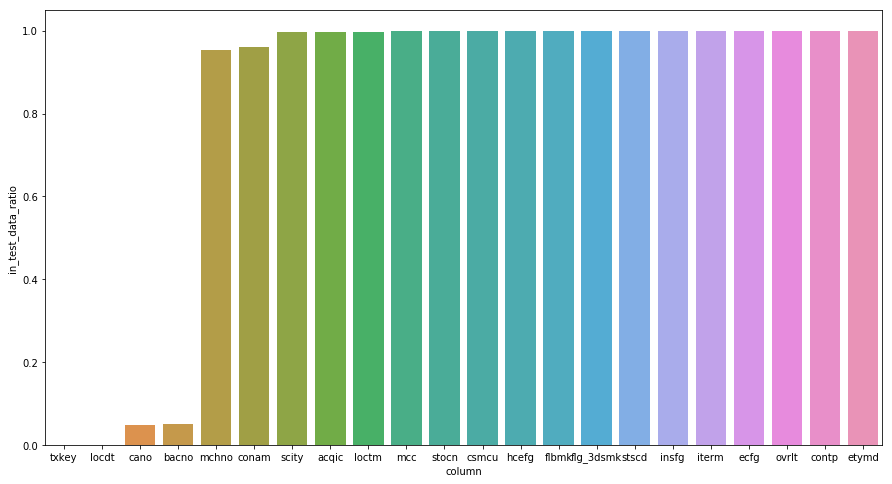

In [11]:
plt.figure(figsize=(15, 8))
sns.barplot(x='column', y='in_test_data_ratio', data=in_test_data_df)

# Null number

In [4]:
cal_null_number(train_data)

,feature_name,null_total_number,null_ratio
0,flg_3dsmk,12581,0.00827
1,flbmk,12581,0.00827


In [5]:
cal_null_number(test_data)

,feature_name,null_total_number,null_ratio
0,flg_3dsmk,3715,0.00881
1,flbmk,3715,0.00881


# Outlier分析-conam

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


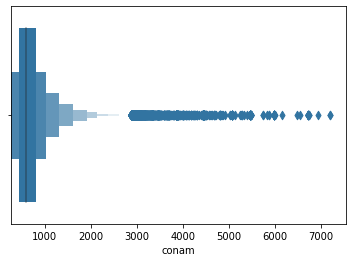

In [6]:
sns.boxenplot(x='conam',data=train_data)

# Class Distribution

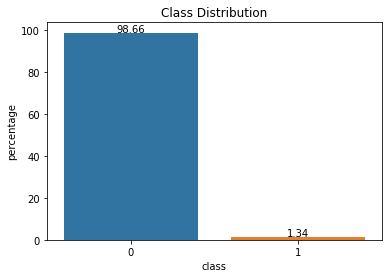

In [7]:
visualize_class_distribution(train_data['fraud_ind'])

# acqic(收行單代碼) 銀行的代碼 (使用中)

In [8]:
acquic_10 = train_data['acqic'].value_counts().sort_values(ascending=False)[:10]

In [9]:
afis = train_data.groupby(by='acqic')['fraud_ind'].value_counts().rename('acqic_fraud_ind_summary').reset_index()
afis.loc[afis['fraud_ind']==1].sort_values(by='acqic_fraud_ind_summary',ascending=False)

,acqic,fraud_ind,acqic_fraud_ind_summary
2993,3348,1,4031
2856,3221,1,2455
5783,6215,1,2080
6168,6540,1,1669
5218,5720,1,1194
6429,6760,1,943
2839,3207,1,686
5927,6331,1,337
6440,6769,1,261
2931,3288,1,246


                                           Plots for acqic                                            
                                           Train data plots                                           


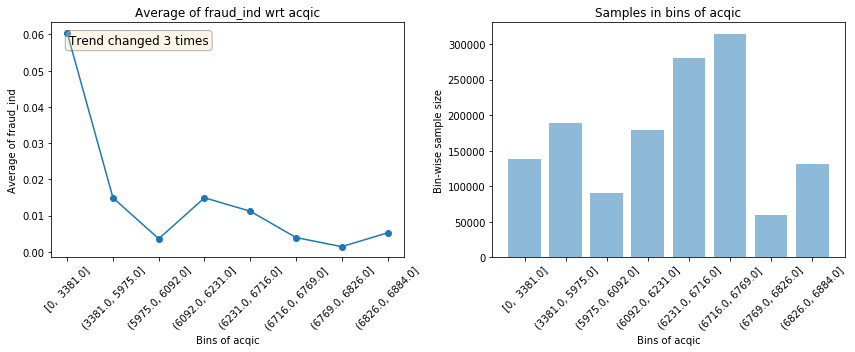

                                           Test data plots                                            


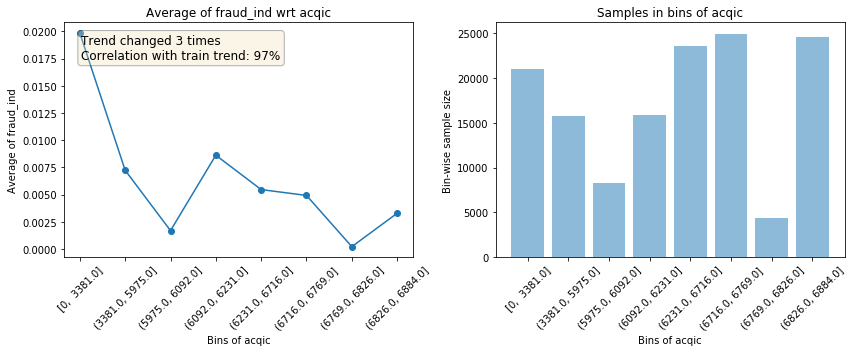

--------------------------------------------------------------------------------------------------------------


                                           Plots for acqic                                            
                                           Train data plots                                           


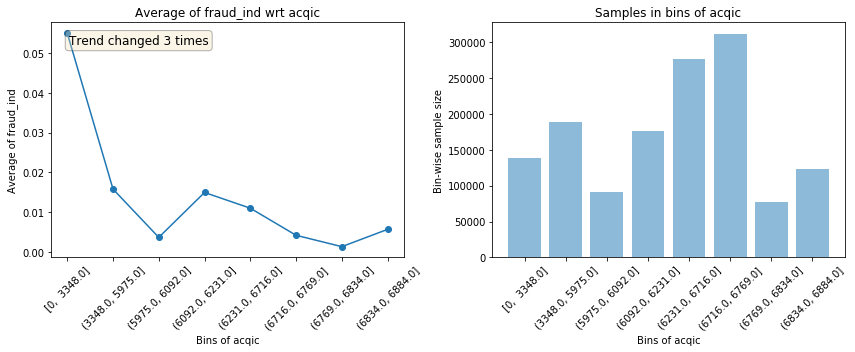

                                           Test data plots                                            


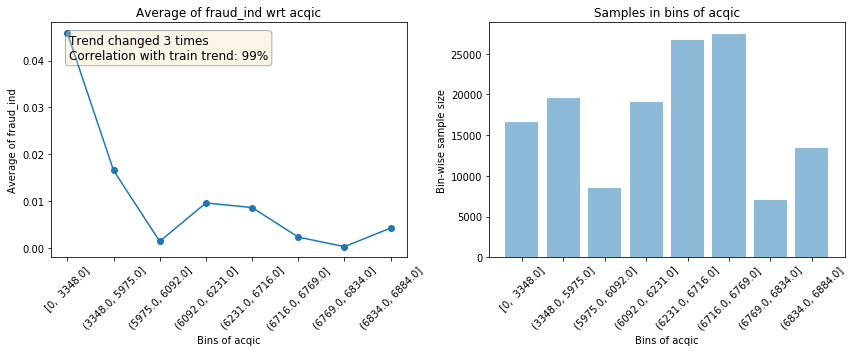

--------------------------------------------------------------------------------------------------------------


                                           Plots for acqic                                            
                                           Train data plots                                           


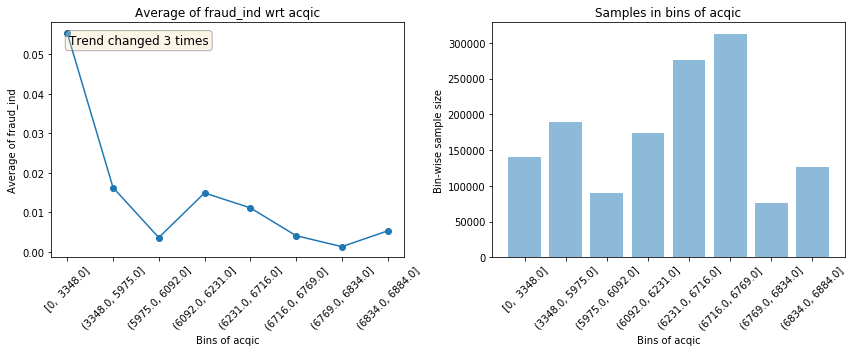

                                           Test data plots                                            


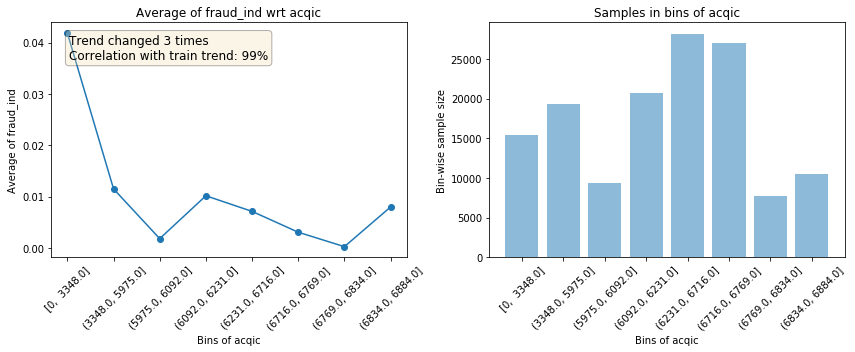

--------------------------------------------------------------------------------------------------------------


                                           Plots for acqic                                            
                                           Train data plots                                           


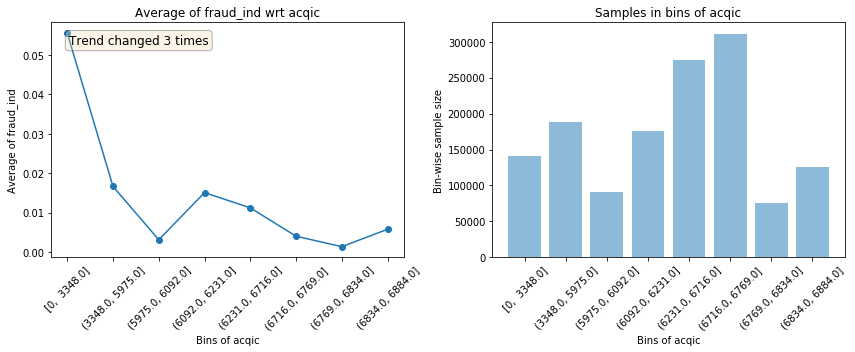

                                           Test data plots                                            


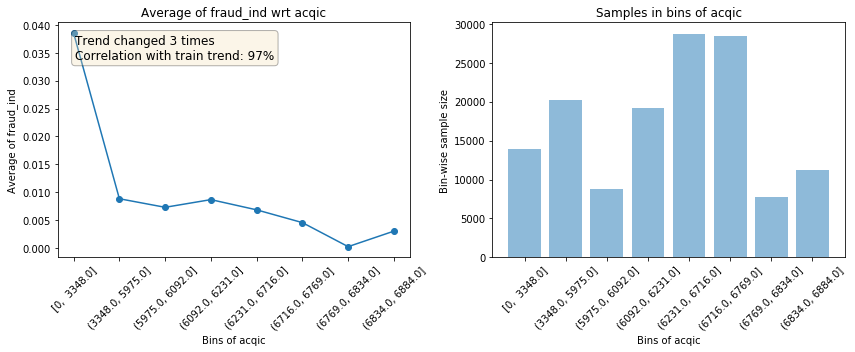

--------------------------------------------------------------------------------------------------------------


                                           Plots for acqic                                            
                                           Train data plots                                           


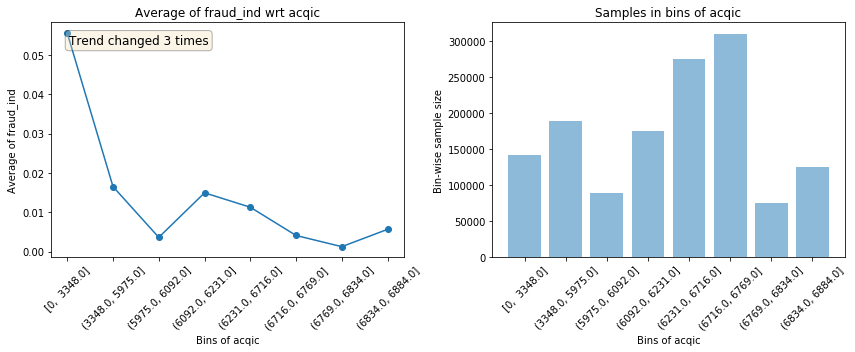

                                           Test data plots                                            


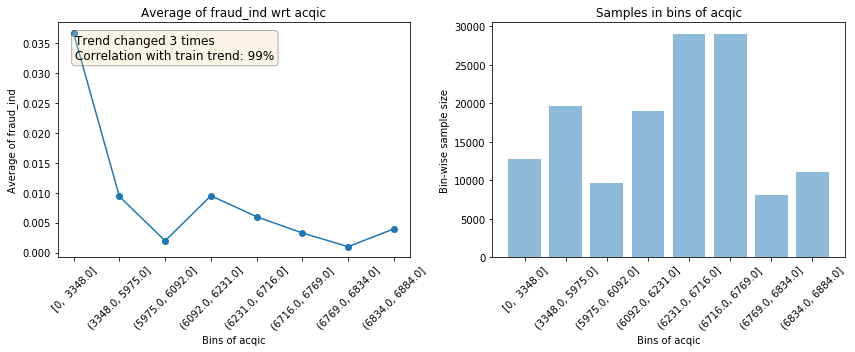

--------------------------------------------------------------------------------------------------------------


                                           Plots for acqic                                            
                                           Train data plots                                           


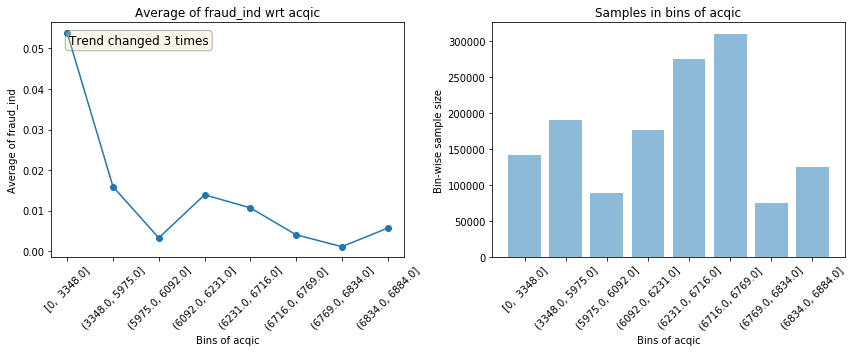

                                           Test data plots                                            


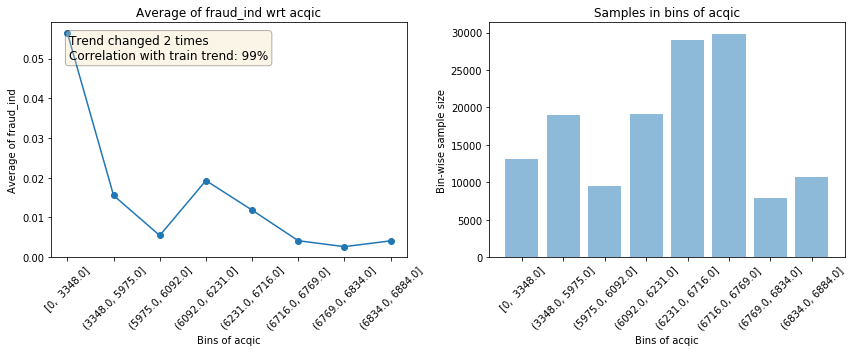

--------------------------------------------------------------------------------------------------------------


                                           Plots for acqic                                            
                                           Train data plots                                           


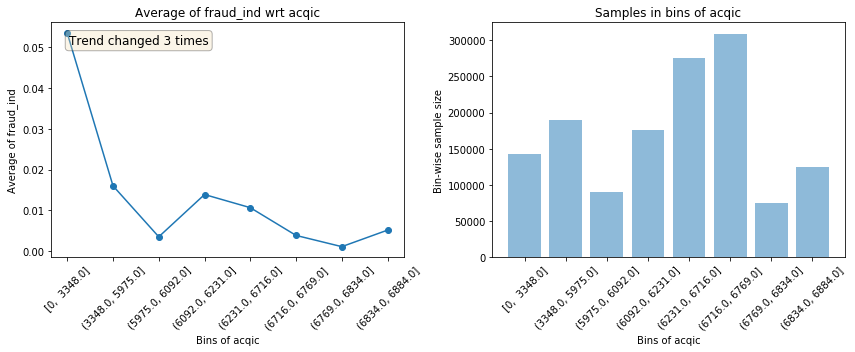

                                           Test data plots                                            


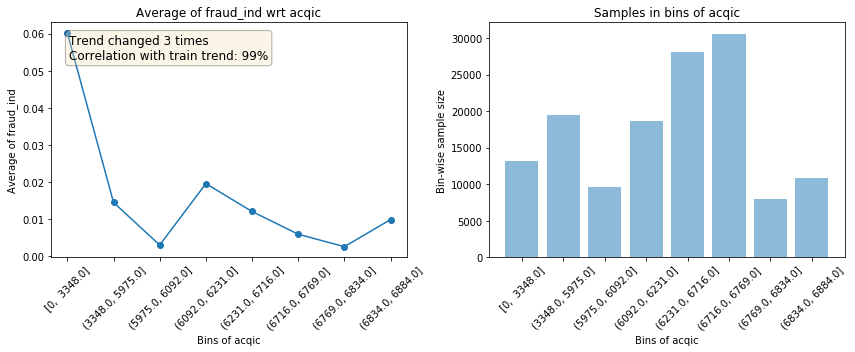

--------------------------------------------------------------------------------------------------------------


                                           Plots for acqic                                            
                                           Train data plots                                           


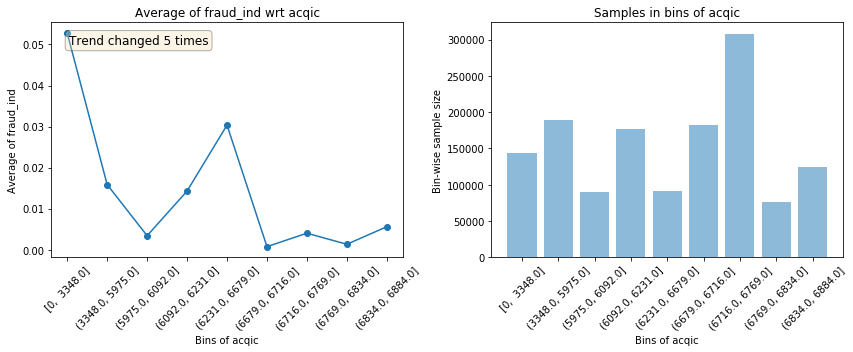

                                           Test data plots                                            


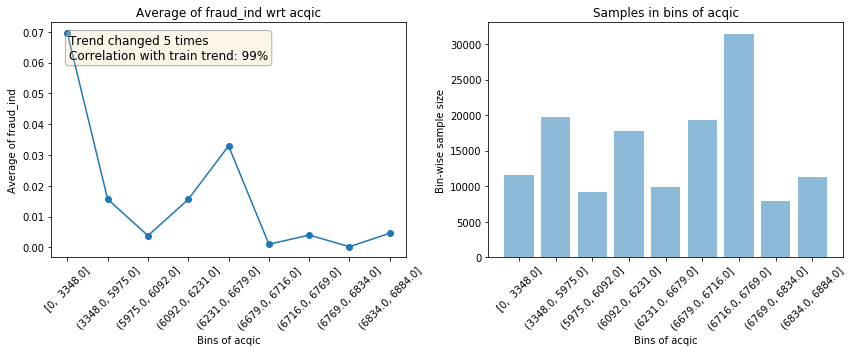

--------------------------------------------------------------------------------------------------------------


                                           Plots for acqic                                            
                                           Train data plots                                           


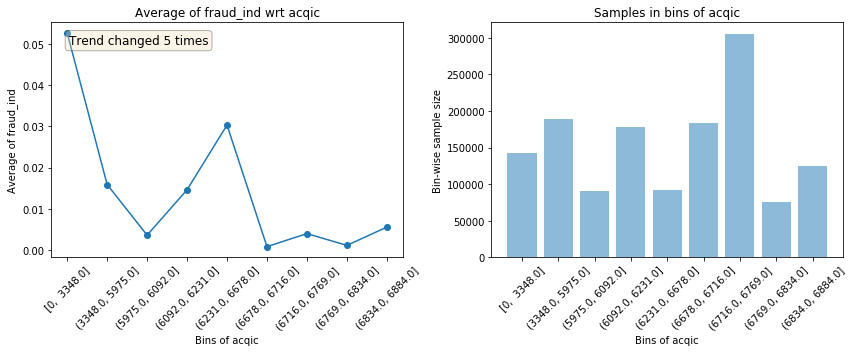

                                           Test data plots                                            


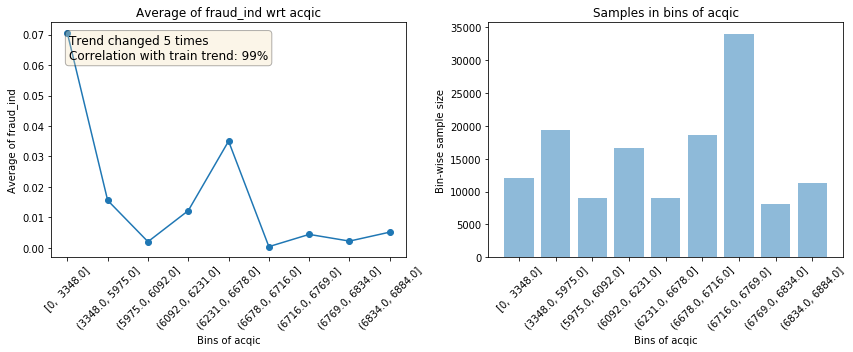

--------------------------------------------------------------------------------------------------------------


                                           Plots for acqic                                            
                                           Train data plots                                           


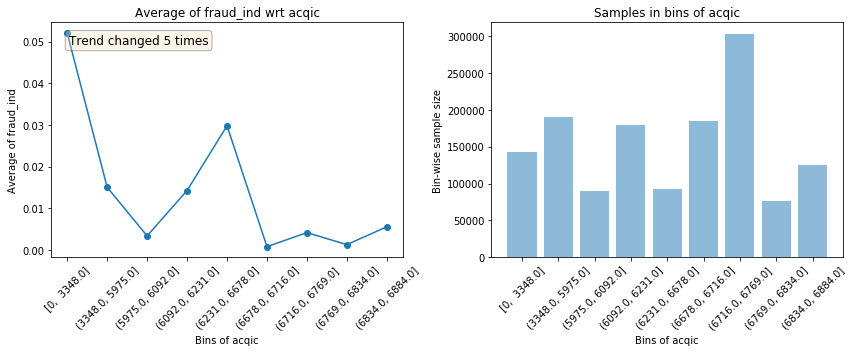

                                           Test data plots                                            


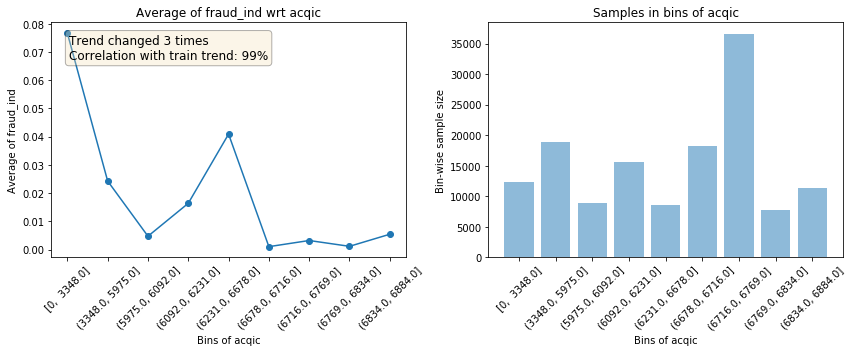

--------------------------------------------------------------------------------------------------------------




In [12]:
for epoch, (train_index, valid_index) in enumerate(zip(train_index_list,valid_index_list)):
    train_data, valid_data = new_train_data.iloc[train_index], new_train_data.iloc[valid_index]
    get_univariate_plots(data=train_data, target_col='fraud_ind', 
                         features_list=['acqic'], bins=10,data_test=valid_data)

# bacno(歸戶帳號) (使用中)

In [10]:
print('train data number:',len(train_data))
print('unique number:',len(train_data['bacno'].unique()))

print('test data number:',len(test_data))
print('unique number:',len(test_data['bacno'].unique()))

train data number: 1521787
unique number: 95214
test data number: 421665
unique number: 71099


In [183]:
a = set(train_data['bacno'])
b = set(test_data['bacno'])
len(a.intersection(b))

3128

# cano(交易卡號) (使用中)

In [11]:
print('total data number:',len(train_data))
print('unique number:',len(train_data['cano'].unique()))

total data number: 1521787
unique number: 129413


In [7]:
a = set(train_data['acqic'])
b = set(test_data['acqic'])
intersection = b.intersection(a)

In [8]:
test_data.loc[test_data['acqic'].isin(intersection)]

,acqic,bacno,cano,conam,contp,csmcu,ecfg,etymd,flbmk,flg_3dsmk,hcefg,insfg,iterm,locdt,loctm,mcc,mchno,ovrlt,scity,stocn,stscd,txkey
0,6881,163188,116799,513.80,5,0,N,0,N,N,5,N,0,102,215328.0,457,59360,N,0,102,0,592489
1,6881,163188,116799,513.80,5,0,N,0,N,N,5,N,0,102,222007.0,457,59360,N,0,102,0,592452
2,6881,163188,116799,513.80,5,0,N,0,N,N,5,N,0,100,170013.0,457,59360,N,0,102,0,590212
3,6881,163188,116799,513.80,5,0,N,0,N,N,5,N,0,100,165914.0,457,59360,N,0,102,0,590209
4,6881,163188,116799,513.80,5,0,N,0,N,N,5,N,0,102,215311.0,457,59360,N,0,102,0,592488
5,6881,163188,116799,513.80,5,0,N,0,N,N,5,N,0,102,222541.0,457,59360,N,0,102,2,592460
6,6881,163188,116799,513.80,5,0,N,0,N,N,5,N,0,100,162903.0,457,59360,N,0,102,0,590160
7,6881,163188,116799,513.80,5,0,N,0,N,N,5,N,0,102,222022.0,457,59360,N,0,102,0,592453
8,6881,163188,116799,513.80,5,0,N,0,N,N,5,N,0,95,182629.0,457,59360,N,0,102,0,585745
9,6881,163188,116799,513.80,5,0,N,0,N,N,5,N,0,102,221853.0,457,59360,N,0,102,0,592451


# conam (交易金額 台幣 經過轉換) (使用中)

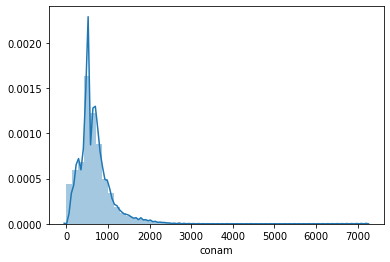

In [12]:
sns.distplot(train_data['conam'])

                                           Plots for conam                                            
                                           Train data plots                                           


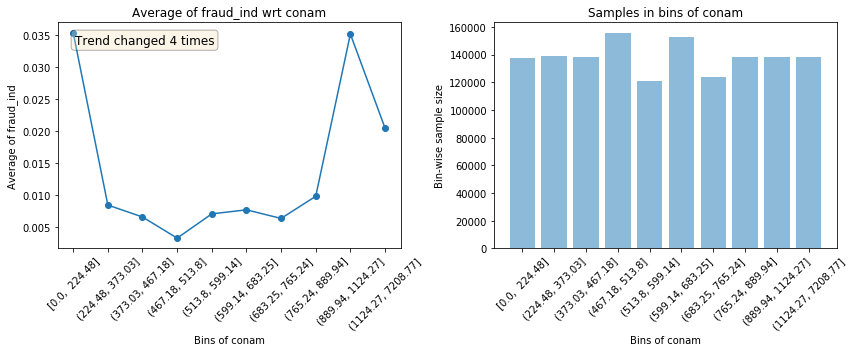

                                           Test data plots                                            


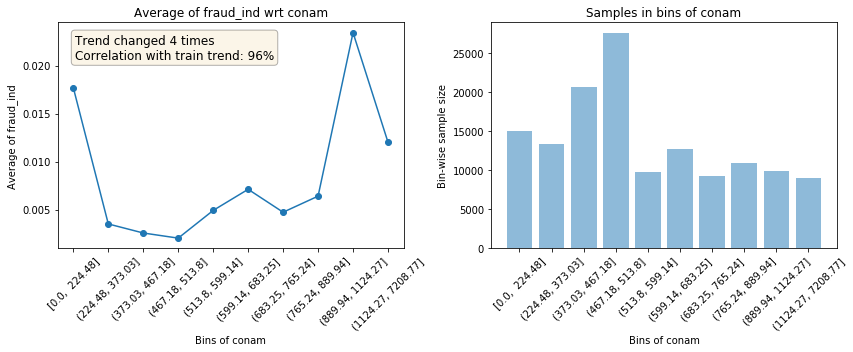

--------------------------------------------------------------------------------------------------------------


                                           Plots for conam                                            
                                           Train data plots                                           


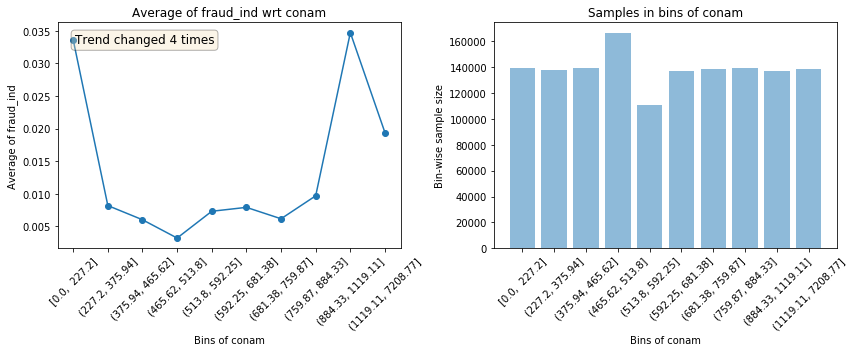

                                           Test data plots                                            


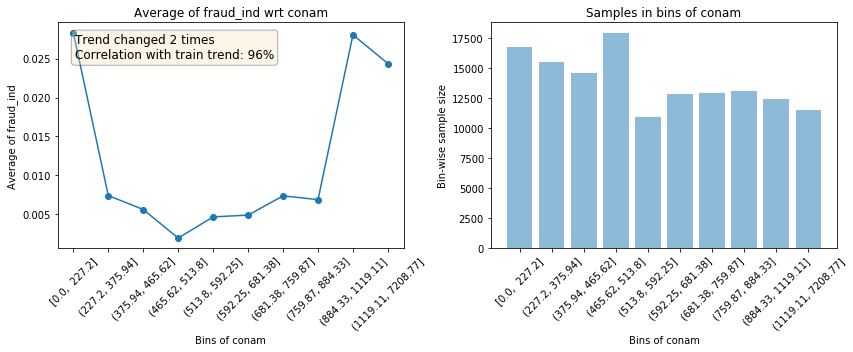

--------------------------------------------------------------------------------------------------------------


                                           Plots for conam                                            
                                           Train data plots                                           


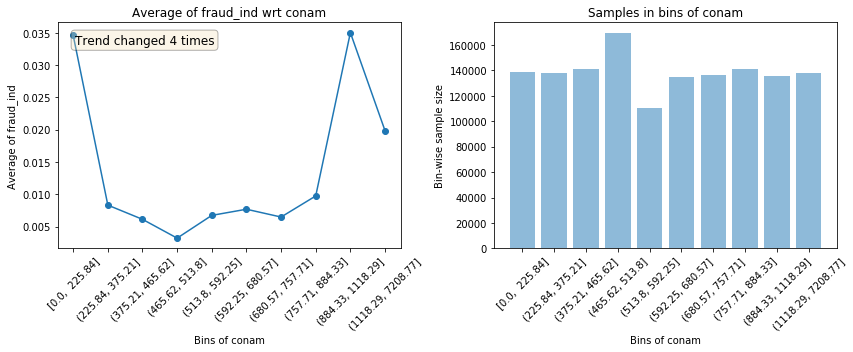

                                           Test data plots                                            


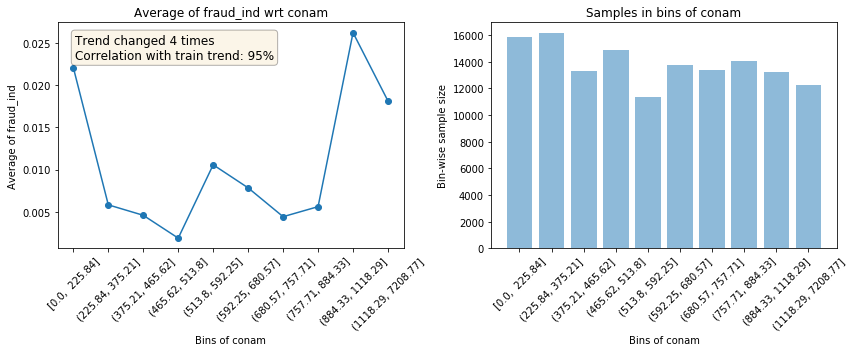

--------------------------------------------------------------------------------------------------------------


                                           Plots for conam                                            
                                           Train data plots                                           


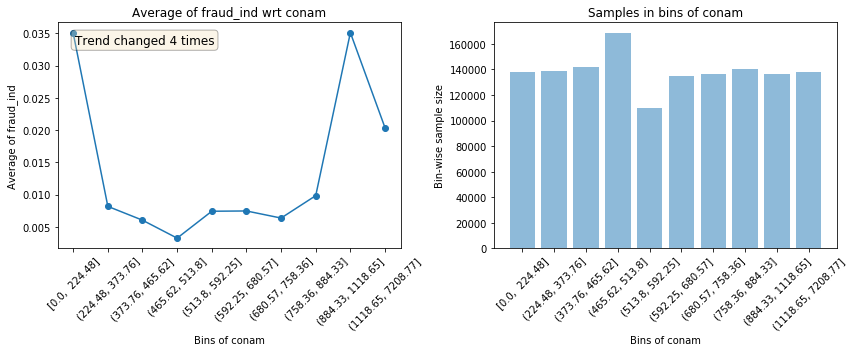

                                           Test data plots                                            


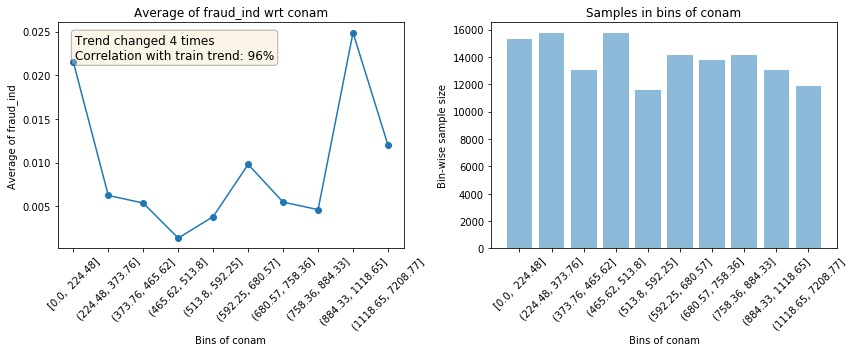

--------------------------------------------------------------------------------------------------------------


                                           Plots for conam                                            
                                           Train data plots                                           


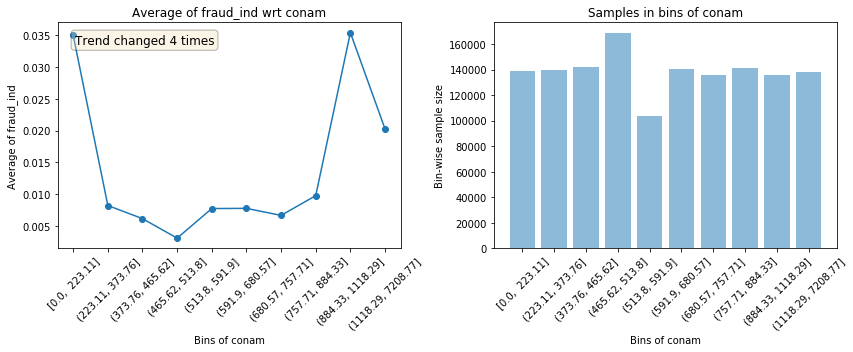

                                           Test data plots                                            


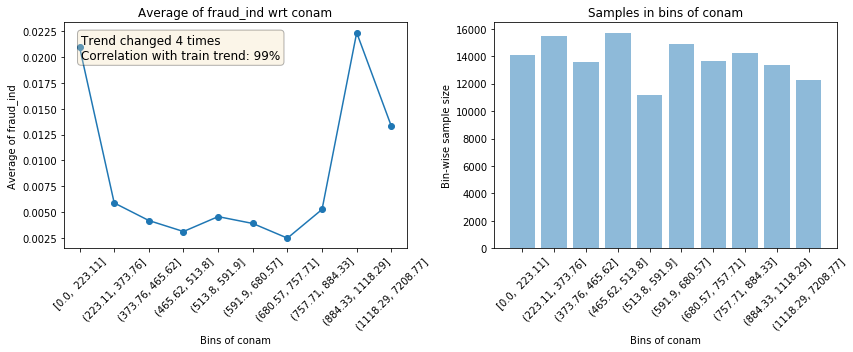

--------------------------------------------------------------------------------------------------------------


                                           Plots for conam                                            
                                           Train data plots                                           


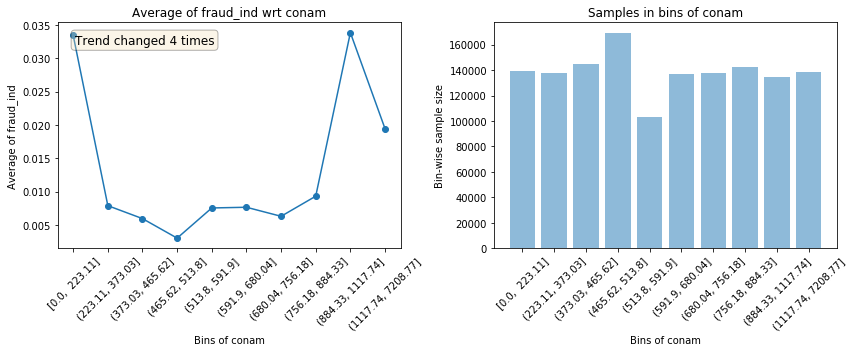

                                           Test data plots                                            


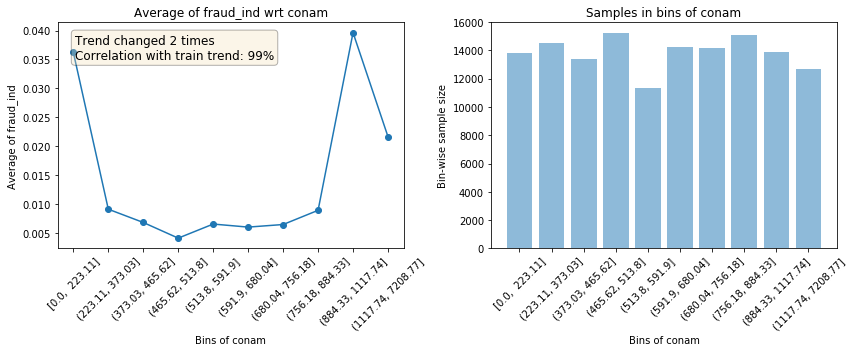

--------------------------------------------------------------------------------------------------------------


                                           Plots for conam                                            
                                           Train data plots                                           


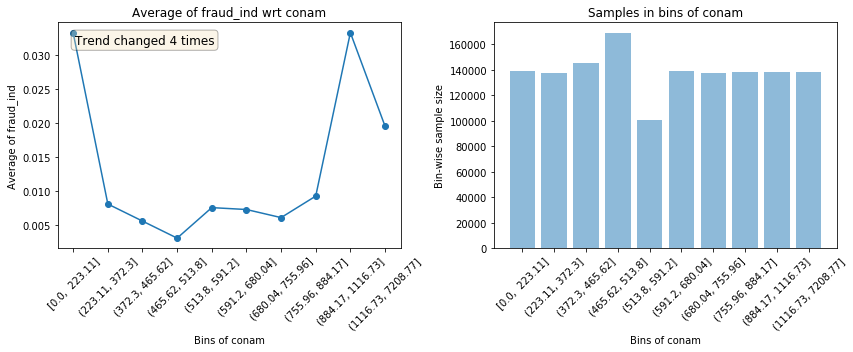

                                           Test data plots                                            


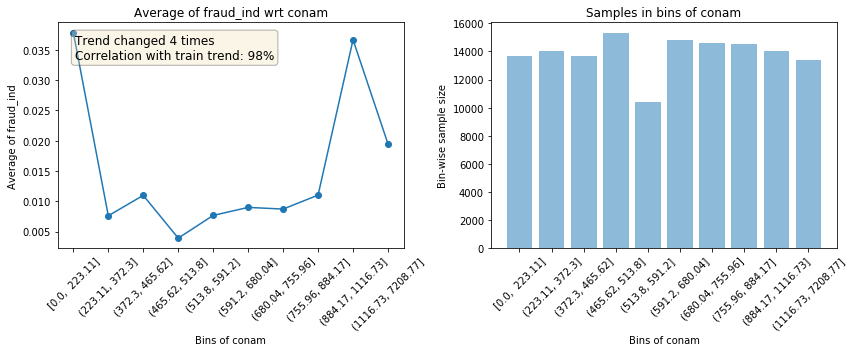

--------------------------------------------------------------------------------------------------------------


                                           Plots for conam                                            
                                           Train data plots                                           


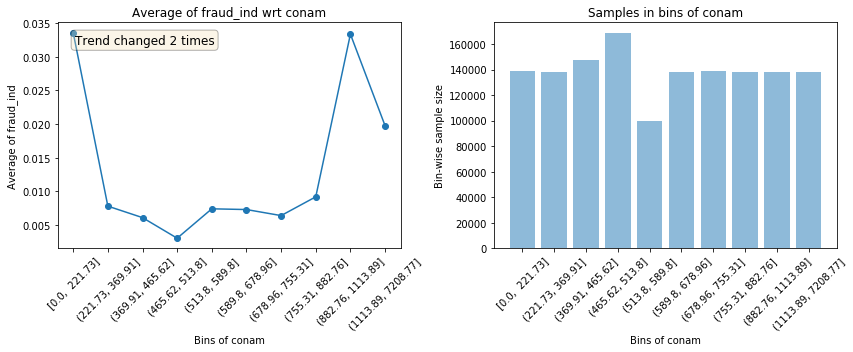

                                           Test data plots                                            


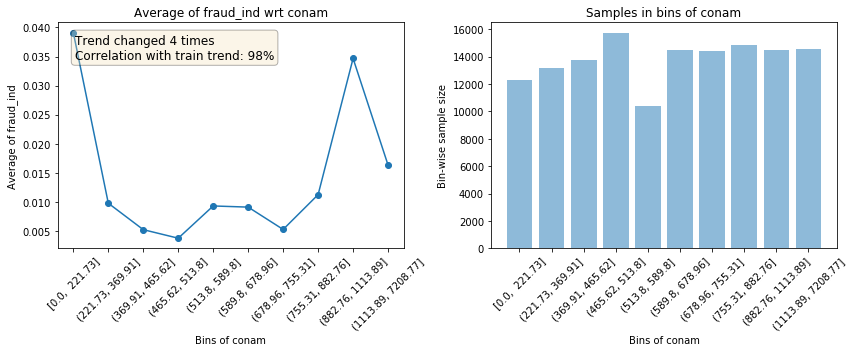

--------------------------------------------------------------------------------------------------------------


                                           Plots for conam                                            
                                           Train data plots                                           


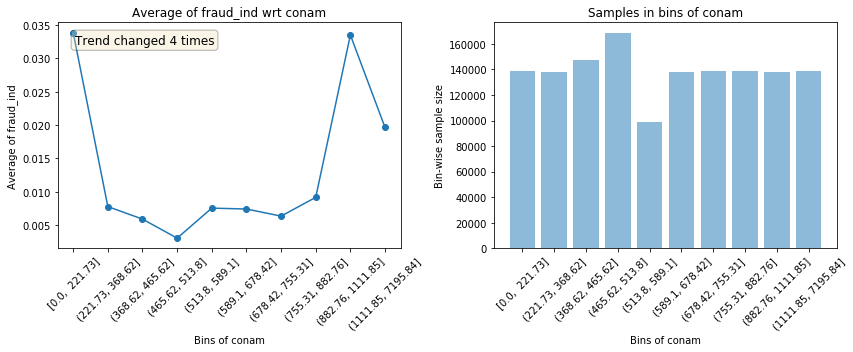

                                           Test data plots                                            


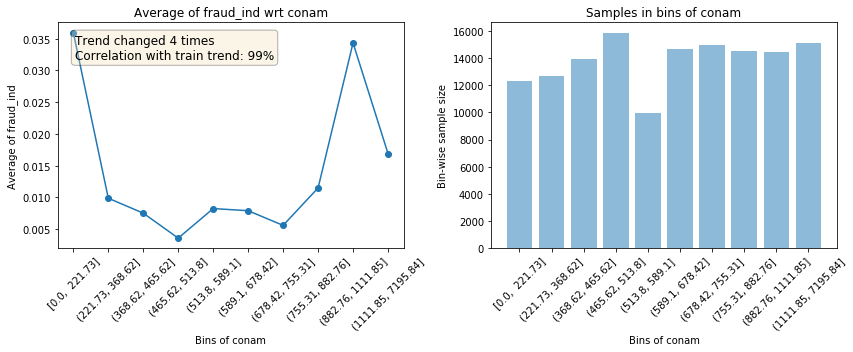

--------------------------------------------------------------------------------------------------------------


                                           Plots for conam                                            
                                           Train data plots                                           


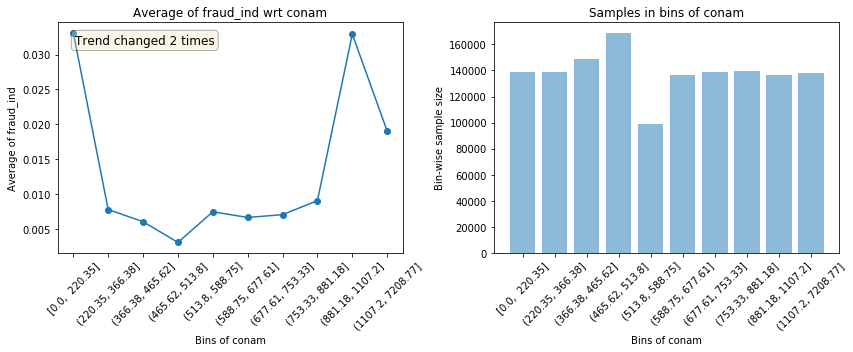

                                           Test data plots                                            


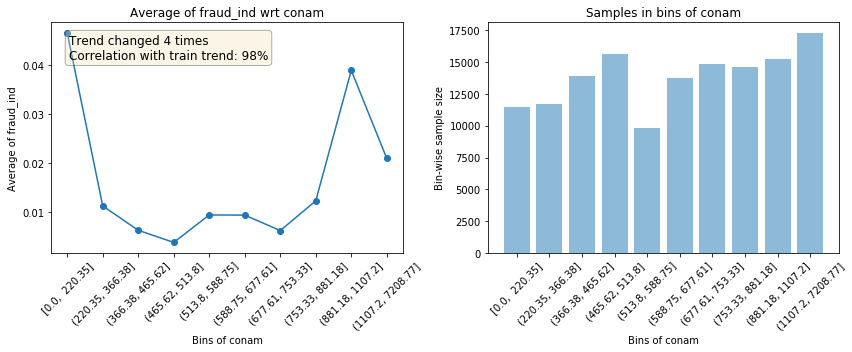

--------------------------------------------------------------------------------------------------------------




In [15]:
for epoch, (train_index, valid_index) in enumerate(zip(train_index_list,valid_index_list)):
    fold_train, fold_valid = train_data.iloc[train_index], train_data.iloc[valid_index]
    get_univariate_plots(data=fold_train, target_col='fraud_ind', 
                         features_list=['conam'], bins=10,data_test=fold_valid)

# 將conam離散化(使用中)

In [5]:
from sklearn.cluster import KMeans
import numpy as np

distortions = []
for i in range(1,100):
    km = KMeans(n_clusters=i,init="k-means++",n_init=10,max_iter=300,tol=1e-4,random_state=0,n_jobs=-1)
    km.fit(train_data[['conam']])
    #获取K-means算法的SSE
    distortions.append(km.inertia_)
#绘制曲线
plt.plot(range(1,11),distortions,marker="o")
plt.xlabel("簇数量")
plt.ylabel("簇内误方差(SSE)")
plt.show()

C:\Users\champ\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:793: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 1.0 (renaming of 0.25).
  " removed in 1.0 (renaming of 0.25).", FutureWarning)
C:\Users\champ\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:793: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 1.0 (renaming of 0.25).
  " removed in 1.0 (renaming of 0.25).", FutureWarning)
C:\Users\champ\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:793: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 1.0 (renaming of 0.25).
  " removed in 1.0 (renaming of 0.25).", FutureWarning)
C:\Users\champ\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:793: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 1.0 (renaming of 0.25).
  " removed in 1.0 (renaming of 0.25).", FutureWarning)
C:\Users\champ\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.p

KeyboardInterrupt: 

# contp(交易類別) (使用中)

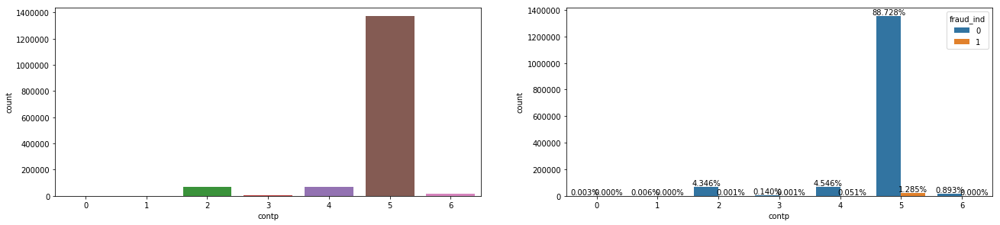

In [8]:
plt.figure(figsize=(22,10))
plt.subplot(221)
sns.countplot(x='contp',data=train_data)

plt.subplot(222)
ax = sns.countplot(x='contp',hue='fraud_ind',data=train_data)

ncount = len(train_data)
for p in ax.patches:
    x=p.get_bbox().get_points()[:,0]
    y=p.get_bbox().get_points()[1,1]
    if np.isnan(y) == True:
        y = 0
    ax.annotate('{:.3f}%'.format(100.*y/ncount), (x.mean(), y), 
            ha='center', va='bottom') # set the alignment of the text

# csmcu(消費地幣別) (使用中)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
        68, 69, 70, 71]), <a list of 72 Text xticklabel objects>)

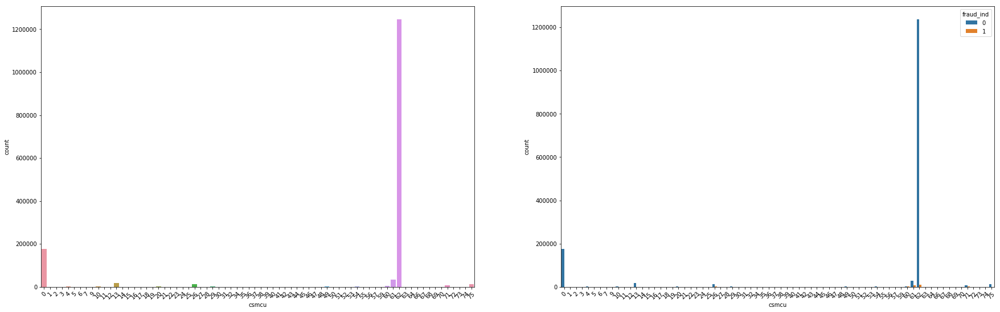

In [10]:
plt.figure(figsize=(30,20))
plt.subplot(221)
sns.countplot(x='csmcu',data=train_data)
plt.xticks(rotation=45)

plt.subplot(222)
sns.countplot(x='csmcu',hue='fraud_ind',data=train_data)
plt.xticks(rotation=45)


# ecfg(網路交易註記) (使用中)

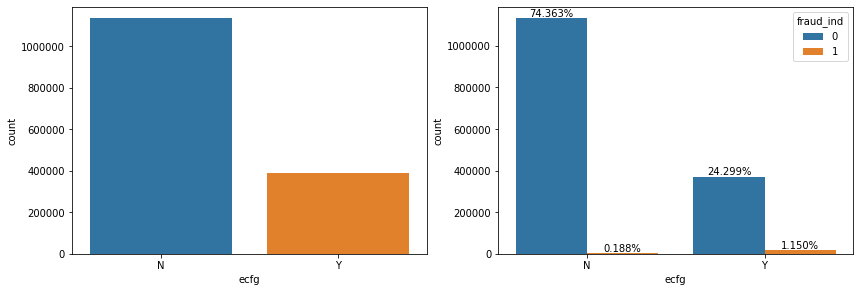

In [184]:
plt.figure(figsize=(14,10))
plt.subplot(221)
sns.countplot(x='ecfg',data=train_data)

plt.subplot(222)
ax = sns.countplot(x='ecfg',hue='fraud_ind',data=train_data)
ncount = len(train_data)
for p in ax.patches:
    x=p.get_bbox().get_points()[:,0]
    y=p.get_bbox().get_points()[1,1]
    if np.isnan(y) == True:
        y = 0
    ax.annotate('{:.3f}%'.format(100.*y/ncount), (x.mean(), y), 
            ha='center', va='bottom') # set the alignment of the text

# etymd(交易型態) (使用中)

Rectangle(xy=(-0.4, 0), width=0.8, height=130022, angle=0)
Rectangle(xy=(0.6, 0), width=0.8, height=10339, angle=0)
Rectangle(xy=(1.6, 0), width=0.8, height=377669, angle=0)
Rectangle(xy=(2.6, 0), width=0.8, height=2350, angle=0)
Rectangle(xy=(3.6, 0), width=0.8, height=320502, angle=0)
Rectangle(xy=(4.6, 0), width=0.8, height=404611, angle=0)
Rectangle(xy=(5.6, 0), width=0.8, height=1978, angle=0)
Rectangle(xy=(6.6, 0), width=0.8, height=228, angle=0)
Rectangle(xy=(7.6, 0), width=0.8, height=243995, angle=0)
Rectangle(xy=(8.6, 0), width=0.8, height=30076, angle=0)
Rectangle(xy=(9.6, 0), width=0.8, height=17, angle=0)


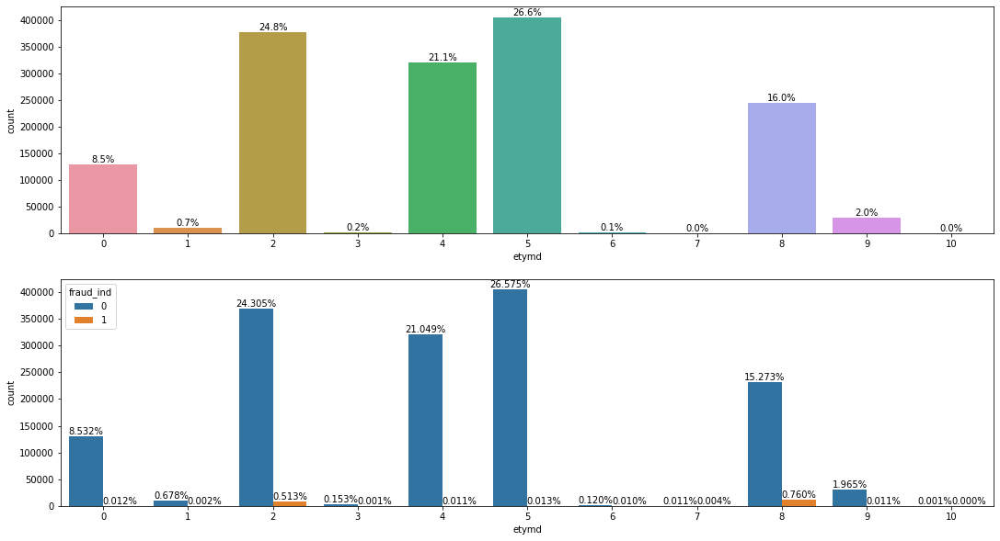

In [16]:
plt.figure(figsize=(40,10))
plt.subplot(221)
ax = sns.countplot(x='etymd',data=train_data)
ncount = len(train_data)
for p in ax.patches:
    print(p)
    x=p.get_bbox().get_points()[:,0]
    y=p.get_bbox().get_points()[1,1]
    ax.annotate('{:.1f}%'.format(100.*y/ncount), (x.mean(), y), 
            ha='center', va='bottom') # set the alignment of the text
    
plt.subplot(223)
ax = sns.countplot(x='etymd',hue='fraud_ind',data=train_data)
ncount = len(train_data)
for p in ax.patches:
    x=p.get_bbox().get_points()[:,0]
    y=p.get_bbox().get_points()[1,1]
    if np.isnan(y) == True:
        y = 0
    ax.annotate('{:.3f}%'.format(100.*y/ncount), (x.mean(), y), 
            ha='center', va='bottom') # set the alignment of the text

# flbmk (fallback交易註記) (使用中)

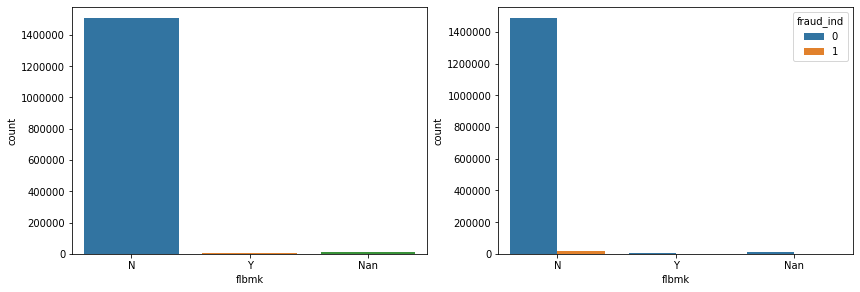

In [17]:
# nan的沒有詐騙案
train_data.loc[train_data['flbmk'].isnull(),'flbmk'] = 'Nan'

plt.figure(figsize=(14,10))
plt.subplot(221)
sns.countplot(x='flbmk',data=train_data)

plt.subplot(222)
sns.countplot(x='flbmk',hue='fraud_ind',data=train_data)

# flg_3dsmk (3DS交易註記) (使用中)

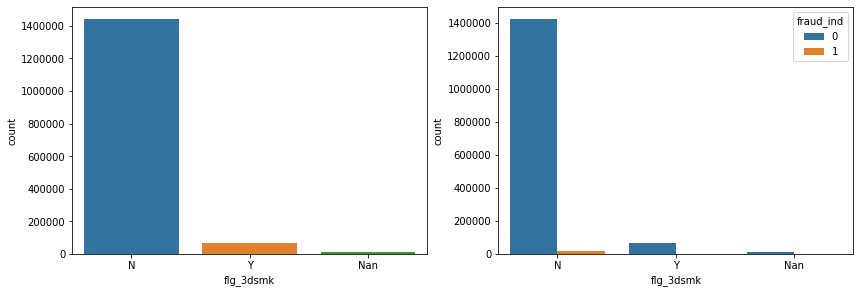

In [18]:
train_data.loc[train_data['flg_3dsmk'].isnull(),'flg_3dsmk'] = 'Nan'

plt.figure(figsize=(14,10))
plt.subplot(221)
sns.countplot(x='flg_3dsmk',data=train_data)

plt.subplot(222)
sns.countplot(x='flg_3dsmk',hue='fraud_ind',data=train_data)

# hcefg (支付型態) (使用中)

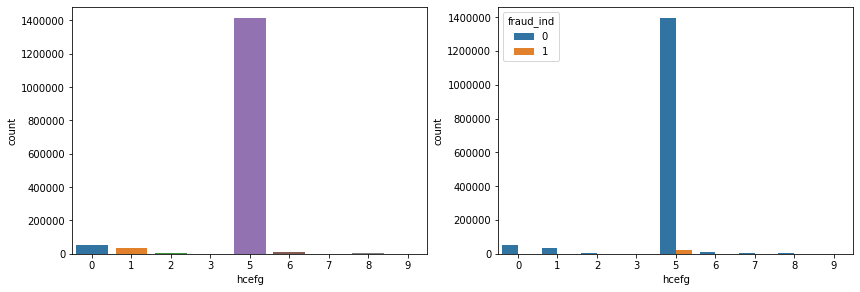

In [19]:
plt.figure(figsize=(14,10))
plt.subplot(221)
sns.countplot(x='hcefg',data=train_data)

plt.subplot(222)
sns.countplot(x='hcefg',hue='fraud_ind',data=train_data)

# insfg(分期交易註記) (使用中)

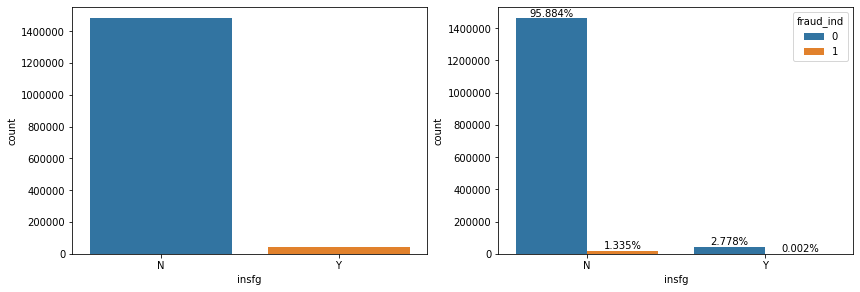

In [20]:
plt.figure(figsize=(14,10))
plt.subplot(221)
sns.countplot(x='insfg',data=train_data)

plt.subplot(222)
ax = sns.countplot(x='insfg',hue='fraud_ind',data=train_data)

ncount = len(train_data)
for p in ax.patches:
    x=p.get_bbox().get_points()[:,0]
    y=p.get_bbox().get_points()[1,1]
    if np.isnan(y) == True:
        y = 0
    ax.annotate('{:.3f}%'.format(100.*y/ncount), (x.mean(), y), 
            ha='center', va='bottom') # set the alignment of the text

# iterm(分期期數) (使用中)

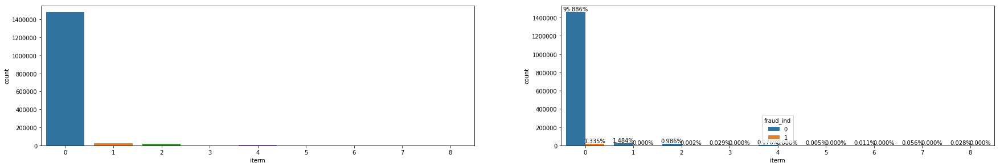

In [15]:
plt.figure(figsize=(30,10))
plt.subplot(221)
sns.countplot(x='iterm',data=train_data)

plt.subplot(222)
ax = sns.countplot(x='iterm',hue='fraud_ind',data=train_data)

ncount = len(train_data)
for p in ax.patches:
    x=p.get_bbox().get_points()[:,0]
    y=p.get_bbox().get_points()[1,1]
    if np.isnan(y) == True:
        y = 0
    ax.annotate('{:.3f}%'.format(100.*y/ncount), (x.mean(), y), 
            ha='center', va='bottom') # set the alignment of the text

# locdt(授權日期)

In [22]:
# 90天的授權日期
len(train_data['locdt'].value_counts())

90

# loctm(授權時間)

In [24]:
sorted(train_data['loctm'].unique())[-1]

235959.0

# mcc(商品類別編碼) (使用中)

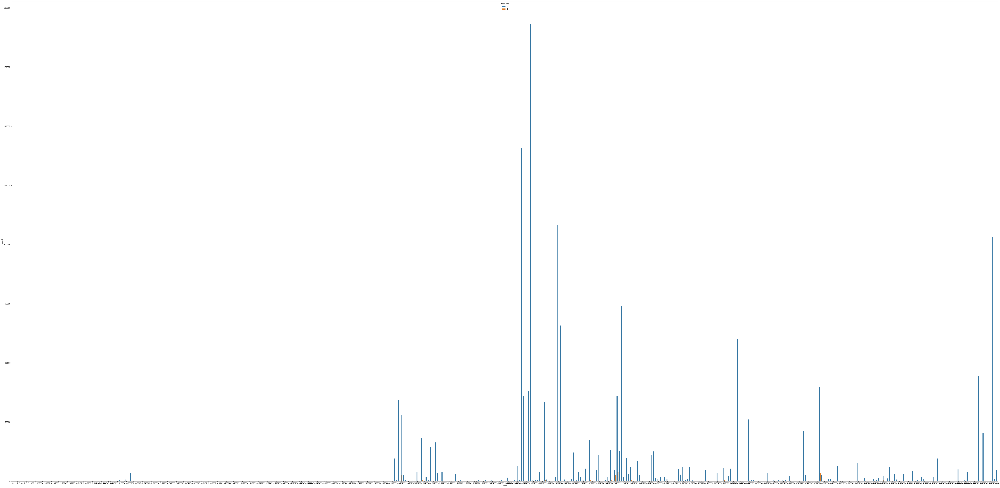

In [27]:
plt.figure(figsize=(100,50))
sns.countplot(x='mcc',hue='fraud_ind',data=train_data)

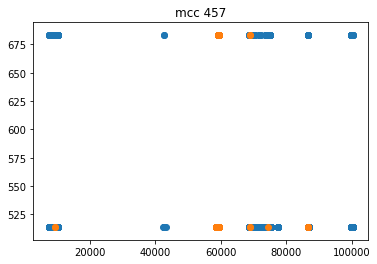

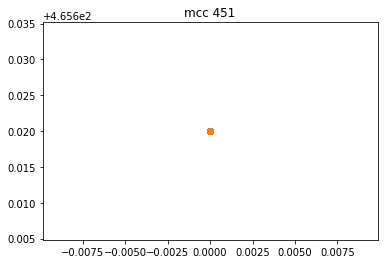

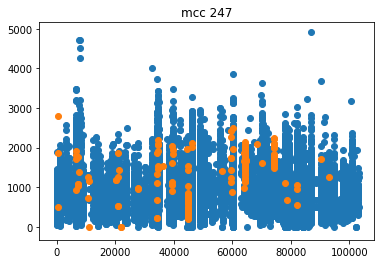

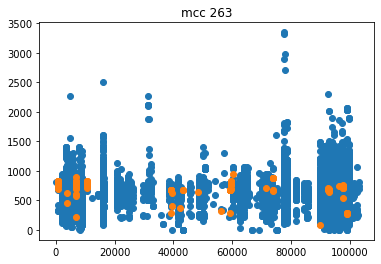

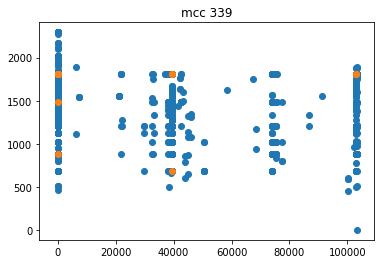

...

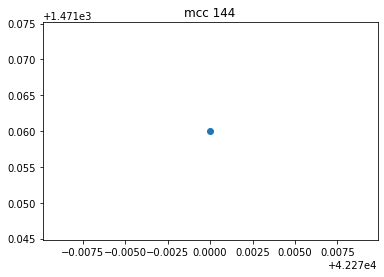

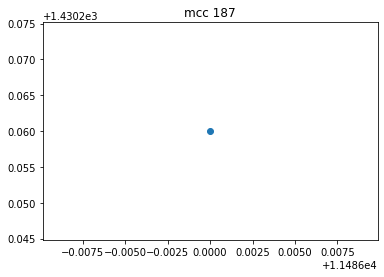

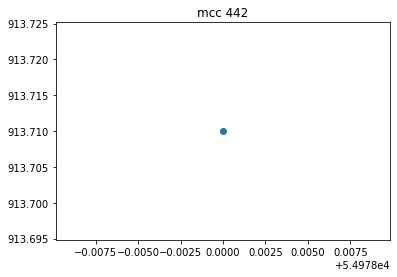

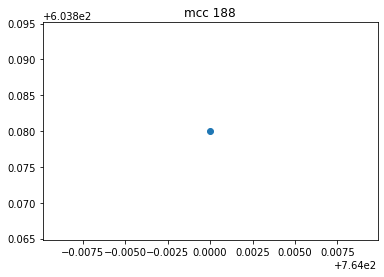

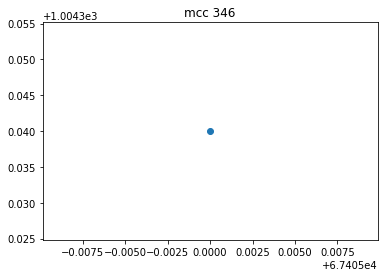

In [45]:
for mcc in train_data['mcc'].unique():
    a = train_data.loc[(train_data['mcc']==mcc)&(train_data['fraud_ind']==0)]
    b = train_data.loc[(train_data['mcc']==mcc)&(train_data['fraud_ind']==1)]
    plt.figure()
    plt.subplot()
    plt.scatter(a['mchno'],a['conam'])
    plt.scatter(b['mchno'],b['conam'])
    plt.title('mcc %s' %mcc)
    plt.show()

# mchno(特約商店代號) (使用中)

In [25]:
mfn = train_data.groupby(by='mchno')['fraud_ind'].sum().rename('mchno_fraud_number').reset_index()
smtn = train_data.groupby(by='mchno')['txkey'].count().rename('same_mchno_transaction_number').reset_index()
mfn = mfn.merge(smtn,on=['mchno'],how='left')
mfn['mchno_fraud_ratio'] = mfn['mchno_fraud_number'] / mfn['same_mchno_transaction_number']

In [39]:
mfn.sort_values('same_mchno_transaction_number')

,mchno,mchno_fraud_number,same_mchno_transaction_number,mchno_fraud_ratio
44657,51445,0,1,0.000000
39400,45371,0,1,0.000000
39401,45372,0,1,0.000000
73358,85257,0,1,0.000000
39407,45378,0,1,0.000000
39408,45379,0,1,0.000000
39409,45380,0,1,0.000000
39410,45381,0,1,0.000000
39411,45382,0,1,0.000000
39413,45384,0,1,0.000000


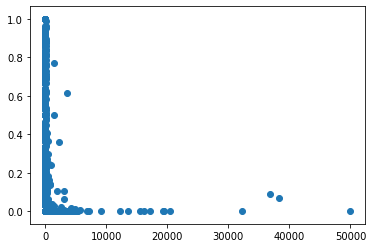

In [37]:
plt.scatter(mfn['same_mchno_transaction_number'],mfn['mchno_fraud_ratio'])

In [40]:
train_data.loc[train_data['mchno']==51445]

,acqic,bacno,cano,conam,contp,csmcu,ecfg,etymd,flbmk,flg_3dsmk,fraud_ind,hcefg,insfg,iterm,locdt,loctm,mcc,mchno,ovrlt,scity,stocn,stscd,txkey,same_cano_mcc_separate_trade_number,same_cano_transaction_number,same_cano_mcc_trade_ratio
1432243,6787,138557,172208,417.33,5,62,N,4,N,N,0,5,N,0,69,132723.0,272,51445,N,5817,102,0,1446386,4,25,0.16


In [42]:
train_data.loc[train_data['cano']==172208]

,acqic,bacno,cano,conam,contp,csmcu,ecfg,etymd,flbmk,flg_3dsmk,fraud_ind,hcefg,insfg,iterm,locdt,loctm,mcc,mchno,ovrlt,scity,stocn,stscd,txkey,same_cano_mcc_separate_trade_number,same_cano_transaction_number,same_cano_mcc_trade_ratio
24216,6716,138557,172208,849.76,5,62,N,4,N,N,0,5,N,0,40,143231.0,247,34399,N,5820,102,0,1428578,4,25,0.16
115882,6812,138557,172208,855.54,5,62,N,4,N,N,0,5,N,0,36,172105.0,275,45219,N,3760,102,0,1569563,1,25,0.04
119852,6716,138557,172208,683.25,5,62,N,5,N,N,0,5,N,0,17,130652.0,247,34399,N,5820,102,0,1343637,4,25,0.16
222469,6826,138557,172208,513.36,5,62,N,5,N,N,0,5,N,0,61,174115.0,277,12692,N,5817,102,0,1655944,6,25,0.24
272304,6716,138557,172208,889.48,5,62,N,5,N,N,0,5,N,0,64,180822.0,251,45340,N,3619,102,0,1586463,5,25,0.20
300561,6787,138557,172208,1202.35,5,62,N,4,N,N,0,5,N,0,69,133414.0,272,51439,N,5817,102,0,1660867,4,25,0.16
374646,6716,138557,172208,699.16,5,62,N,5,N,N,0,5,N,0,49,195103.0,251,45340,N,3619,102,0,1148938,5,25,0.20
447205,6826,138557,172208,878.00,5,62,N,5,N,N,0,5,N,0,7,132726.0,277,16848,N,5817,102,0,1551330,6,25,0.24
596537,6716,138557,172208,468.74,5,62,N,5,N,N,0,5,N,0,81,194615.0,251,45340,N,3619,102,0,1025681,5,25,0.20
605405,6787,138557,172208,792.16,5,62,N,4,N,N,0,5,N,0,69,133530.0,272,51439,N,5817,102,0,1589454,4,25,0.16


In [13]:
train_data.loc[(train_data['mchno']==20984)&(train_data['fraud_ind']==1)].sort_values(by='mcc')

,acqic,bacno,cano,conam,contp,csmcu,ecfg,etymd,flbmk,flg_3dsmk,fraud_ind,hcefg,insfg,iterm,locdt,loctm,mcc,mchno,ovrlt,scity,stocn,stscd,txkey
1335877,3288,71959,15906,1269.53,5,62,Y,8,N,N,1,5,N,0,28,172815.0,203,20984,N,621,93,0,685956
600465,3288,60066,194763,1357.76,5,62,Y,8,N,N,1,5,N,0,43,161950.0,203,20984,N,621,93,0,712208
867411,6288,50956,167488,1264.93,5,62,Y,2,N,N,1,5,N,0,29,110826.0,210,20984,N,621,93,0,1862999
489702,6288,50956,167488,1264.93,5,62,Y,2,N,N,1,5,N,0,29,110808.0,210,20984,N,621,93,0,1863002
492680,3288,65190,8097,1555.64,5,62,Y,8,N,N,1,5,N,0,31,142054.0,210,20984,N,621,93,0,690611
866135,6288,66757,116480,1657.38,5,62,Y,2,N,N,1,5,N,0,32,103306.0,210,20984,N,621,93,0,1866253
858847,3288,65190,8097,1555.64,5,62,Y,8,N,N,1,5,N,0,31,142126.0,210,20984,N,621,93,0,690614
10579,6288,158912,100250,1657.38,5,62,Y,2,N,N,1,5,N,0,33,123555.0,210,20984,N,621,93,0,1867597
844564,6288,66757,116480,1657.38,5,62,Y,2,N,N,1,5,N,0,32,103335.0,210,20984,N,621,93,0,1866256
330631,6288,66757,116480,1657.38,5,62,Y,2,N,N,1,5,N,0,32,103259.0,210,20984,N,621,93,0,1866252


# ovrlt (超額註記碼) (使用中)

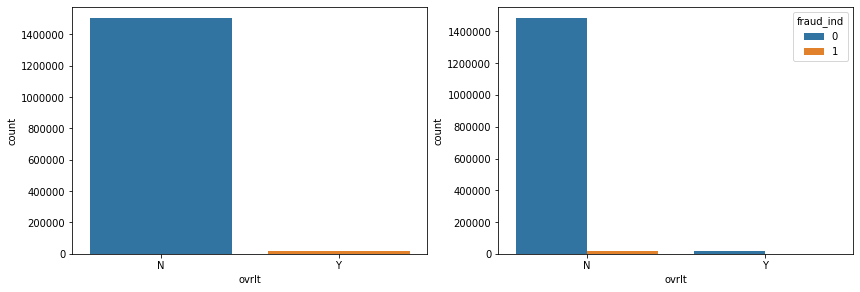

In [29]:
plt.figure(figsize=(14,10))
plt.subplot(221)
sns.countplot(x='ovrlt',data=train_data)

plt.subplot(222)
sns.countplot(x='ovrlt',hue='fraud_ind',data=train_data)

# scity (消費城市) (使用中)

# new scity

In [ ]:
ns = total_data.groupby(by=['stocn','scity'])['txkey'].count().rename('new_scity').reset_index()
ns['new_scity'] = np.arange(0,len(ns))
total_data = total_data.merge(ns,on=['stocn','scity'],how='left')
total_data['new_scity'] = total_data['new_scity'].astype('category')

# stocn (消費地國別) (使用中)

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102]),
 <a list of 103 Text xticklabel objects>)

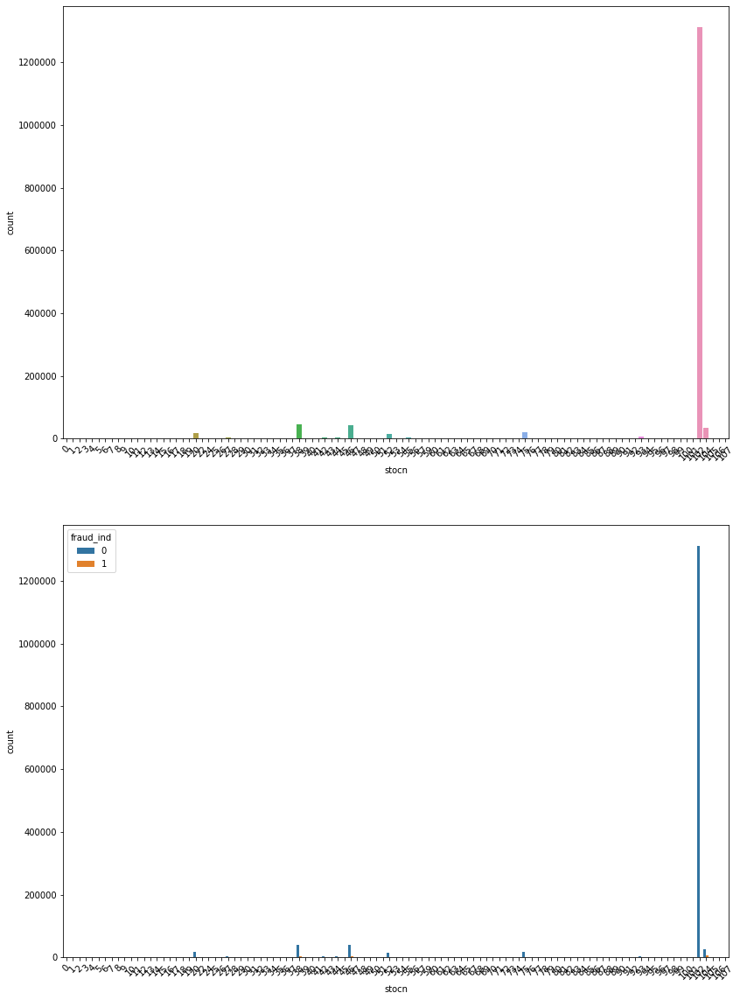

In [30]:
plt.figure(figsize=(30,20))
plt.subplot(221)
sns.countplot(x='stocn',data=train_data)
plt.xticks(rotation=45)

plt.subplot(223)
sns.countplot(x='stocn',hue='fraud_ind',data=train_data)
plt.xticks(rotation=45)

# stscd (狀態碼) (使用中)

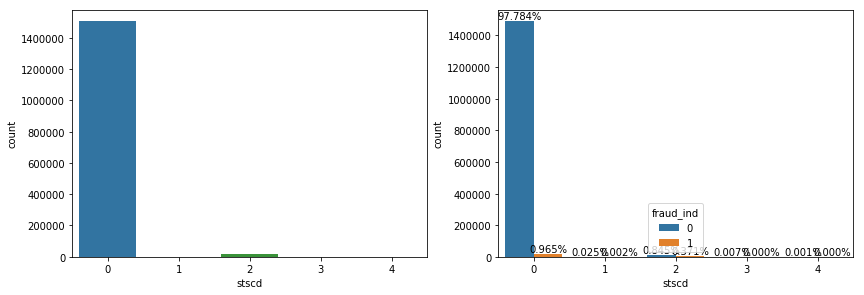

In [25]:
plt.figure(figsize=(14,10))
plt.subplot(221)
sns.countplot(x='stscd',data=train_data)

plt.subplot(222)
ax = sns.countplot(x='stscd',hue='fraud_ind',data=train_data)

ncount = len(train_data)
for p in ax.patches:
    x=p.get_bbox().get_points()[:,0]
    y=p.get_bbox().get_points()[1,1]
    if np.isnan(y) == True:
        y = 0
    ax.annotate('{:.3f}%'.format(100.*y/ncount), (x.mean(), y), 
            ha='center', va='bottom') # set the alignment of the text
    
    

# hour (使用中)

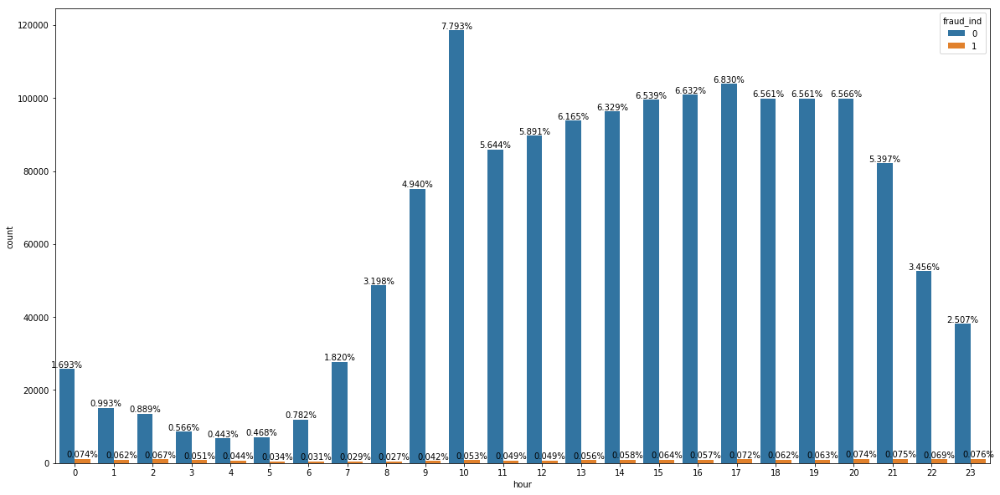

In [14]:
plt.figure(figsize=(20,10))
ax = sns.countplot(x='hour',hue='fraud_ind',data=train_data)
ncount = len(train_data)
for p in ax.patches:
    x=p.get_bbox().get_points()[:,0]
    y=p.get_bbox().get_points()[1,1]
    if np.isnan(y) == True:
        y = 0
    ax.annotate('{:.3f}%'.format(100.*y/ncount), (x.mean(), y), 
            ha='center', va='bottom') # set the alignment of the text

# 每張卡商品對時間視覺化 

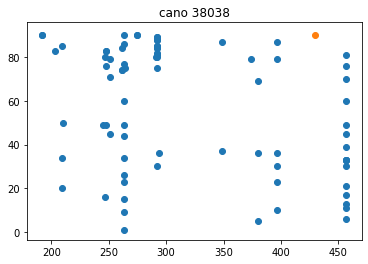

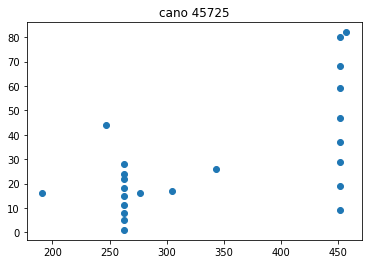

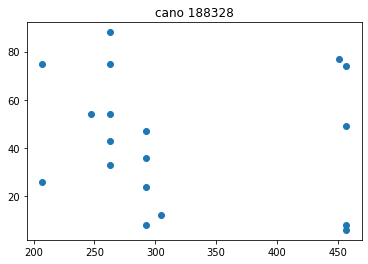

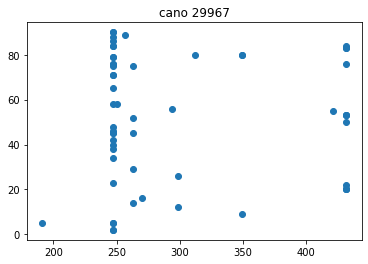

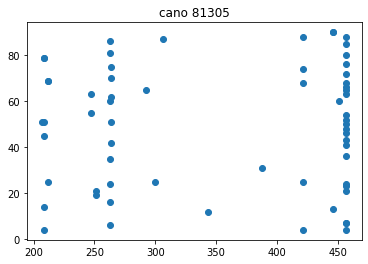

...

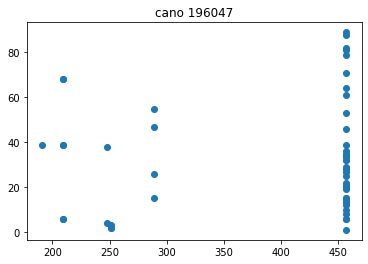

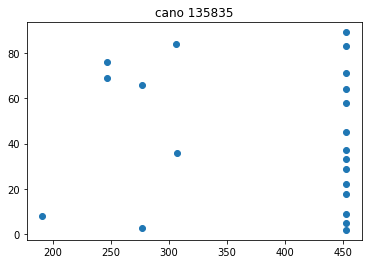

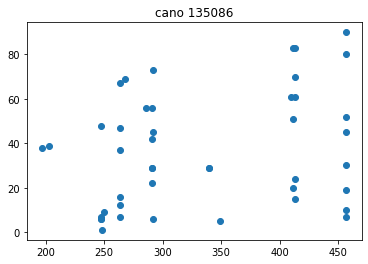

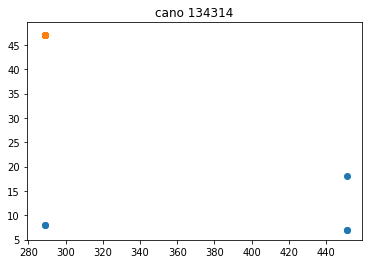

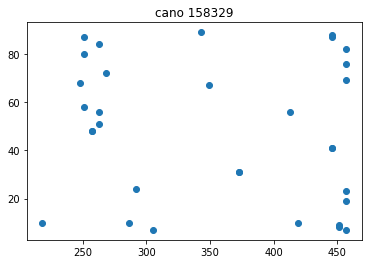

KeyboardInterrupt: 

In [43]:
for cano in train_data['cano'].unique():
    a = train_data.loc[(train_data['cano']==cano)&(train_data['fraud_ind']==0)]
    b = train_data.loc[(train_data['cano']==cano)&(train_data['fraud_ind']==1)]
    plt.figure()
    plt.subplot()
    plt.scatter(a['mcc'],a['locdt'])
    plt.scatter(b['mcc'],b['locdt'])
    plt.title('cano %s' %cano)
    plt.show()

# 同一個歸戶帳號交易次數 (使用中)

In [50]:
transaction_number = train_data.groupby('bacno')['txkey'].count().rename('same_bacno_transaction_number').reset_index()
train_data = train_data.merge(transaction_number,on='bacno',how='left')

In [5]:
fn = train_data.groupby(['bacno','same_bacno_transaction_number'])['fraud_ind'].sum().rename('fraud_number').reset_index()
mean_fn = fn.groupby('same_bacno_transaction_number')['fraud_number'].mean().reset_index()

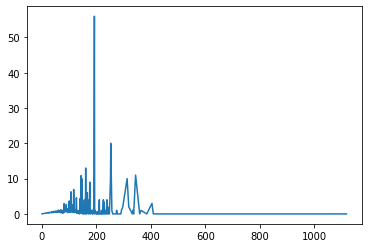

In [6]:
plt.plot(mean_fn['same_bacno_transaction_number'],mean_fn['fraud_number'])

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
        104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
        117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
        130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
        143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
        156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
        169, 170, 171, 172, 173, 174, 175, 176, 177

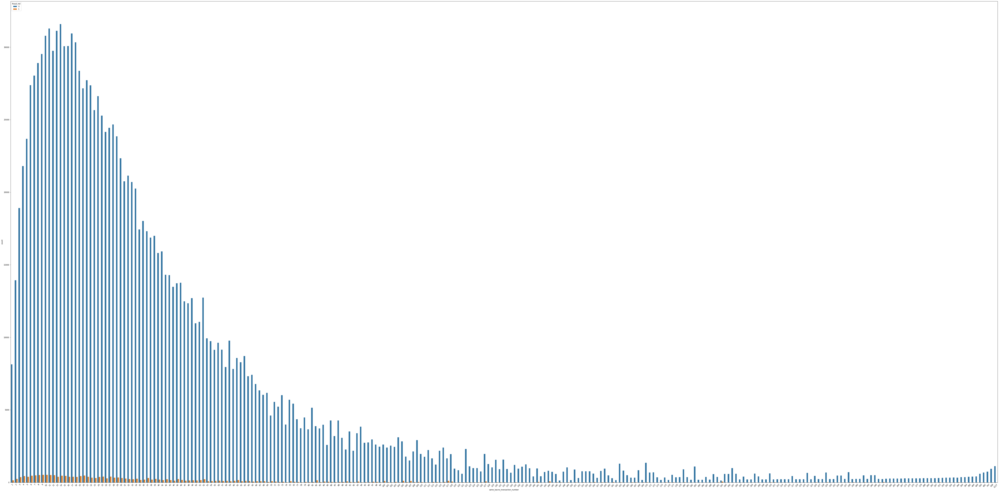

In [7]:
plt.figure(figsize=(100,50))
sns.countplot(x='same_bacno_transaction_number',hue='fraud_ind',data=train_data)
plt.xticks(rotation=45)

# 同一個歸戶帳號下擁有的信用卡數 (使用中)

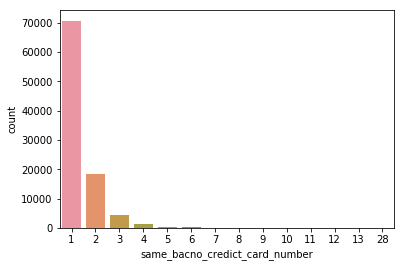

In [16]:
same_bacno_credict_card_number = train_data.groupby('bacno')['cano'].unique().rename('same_bacno_credict_card_number').reset_index()
same_bacno_credict_card_number['same_bacno_credict_card_number'] = same_bacno_credict_card_number['same_bacno_credict_card_number'].apply(lambda x : len(x))
sns.countplot(x='same_bacno_credict_card_number',data=same_bacno_credict_card_number)

In [17]:
train_data = train_data.merge(same_bacno_credict_card_number,on='bacno',how='left')

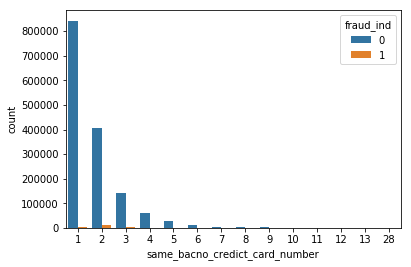

In [18]:
sns.countplot(x='same_bacno_credict_card_number',hue='fraud_ind',data=train_data)

In [19]:
train_data.groupby('same_bacno_credict_card_number')['fraud_ind'].sum()

same_bacno_credict_card_number
1     4987
2     9881
3     3378
4     1226
5      426
6      209
7      110
8       43
9       22
10      13
11       0
12       1
13       3
28      56
Name: fraud_ind, dtype: int64

                               Plots for same_bacno_credict_card_number                               
                                           Train data plots                                           


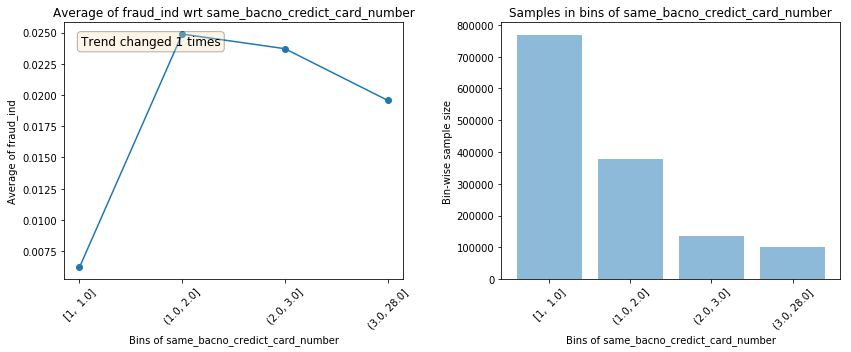

                                           Test data plots                                            


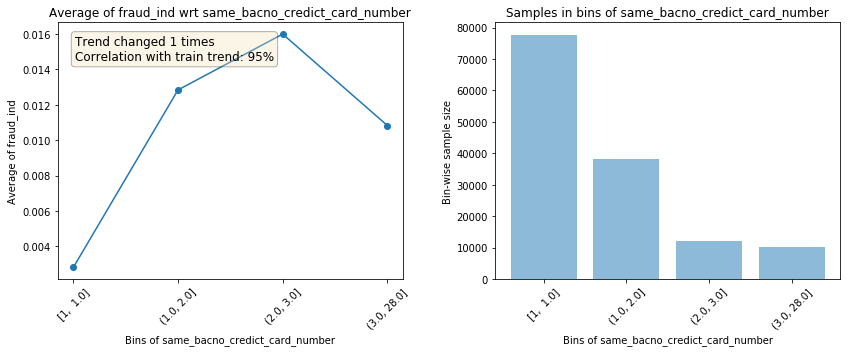

--------------------------------------------------------------------------------------------------------------


                               Plots for same_bacno_credict_card_number                               
                                           Train data plots                                           


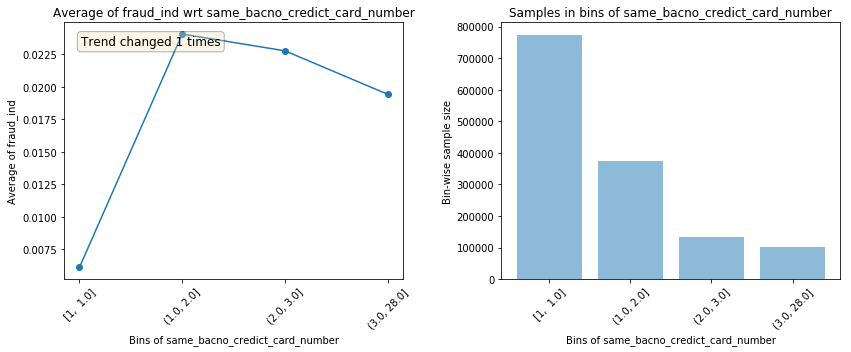

                                           Test data plots                                            


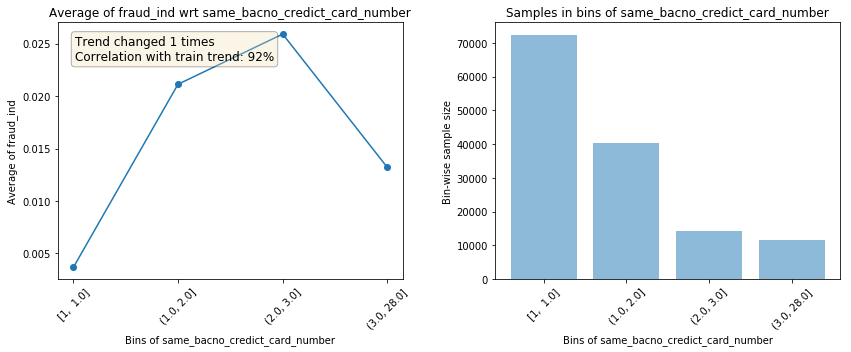

--------------------------------------------------------------------------------------------------------------


                               Plots for same_bacno_credict_card_number                               
                                           Train data plots                                           


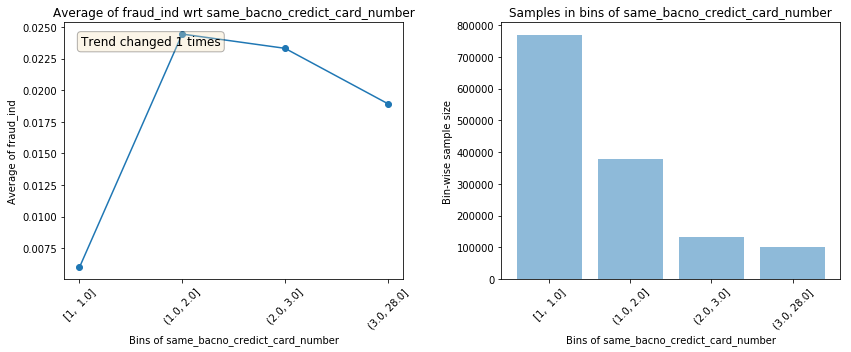

                                           Test data plots                                            


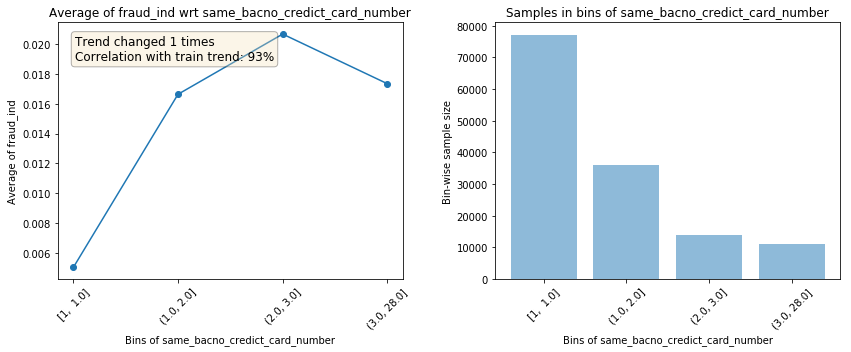

--------------------------------------------------------------------------------------------------------------


                               Plots for same_bacno_credict_card_number                               
                                           Train data plots                                           


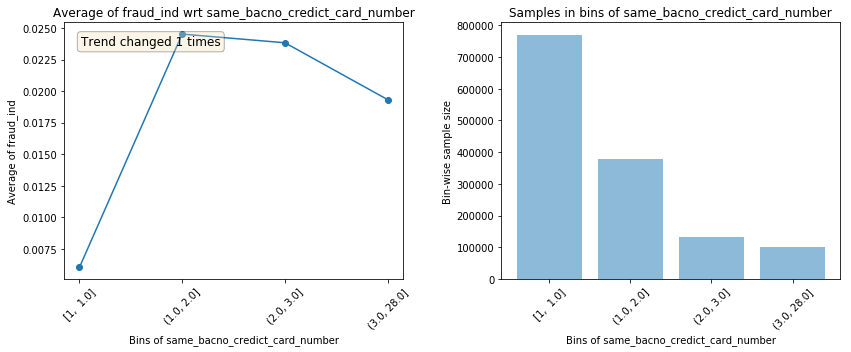

                                           Test data plots                                            


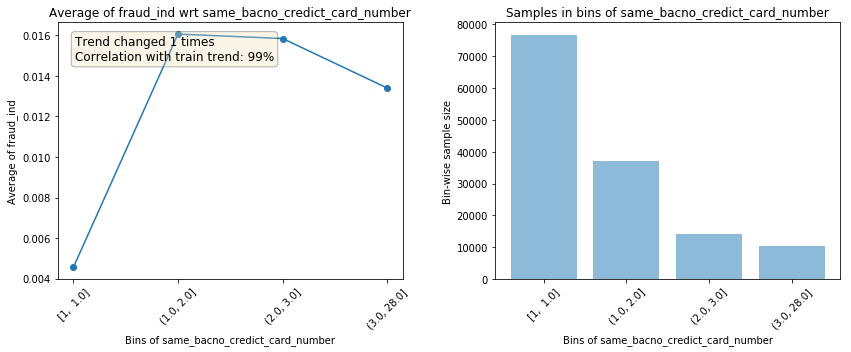

--------------------------------------------------------------------------------------------------------------


                               Plots for same_bacno_credict_card_number                               
                                           Train data plots                                           


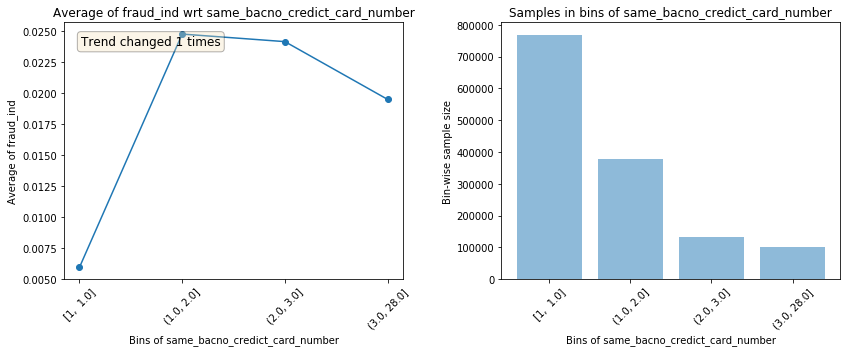

                                           Test data plots                                            


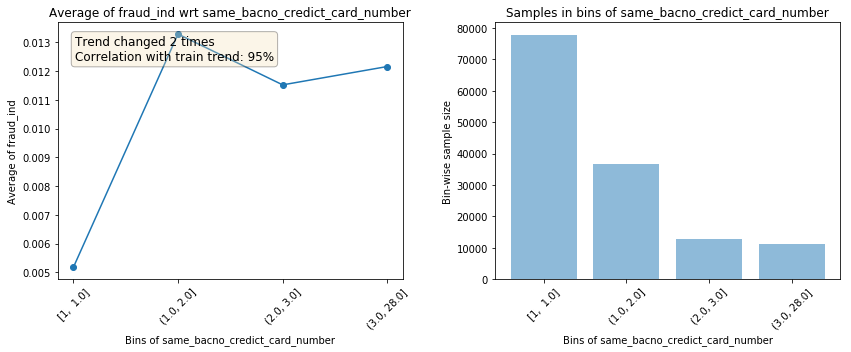

--------------------------------------------------------------------------------------------------------------


                               Plots for same_bacno_credict_card_number                               
                                           Train data plots                                           


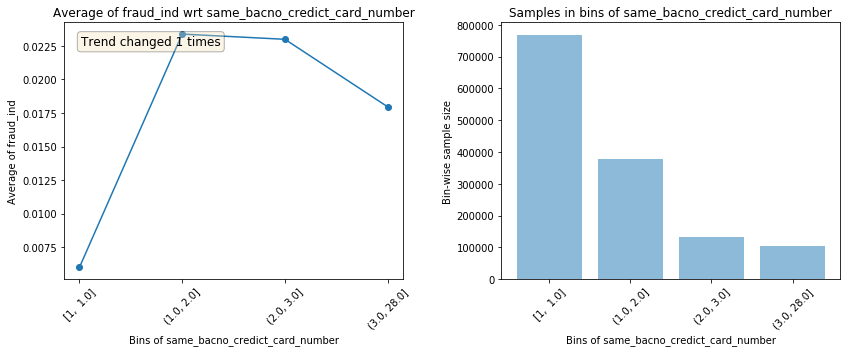

                                           Test data plots                                            


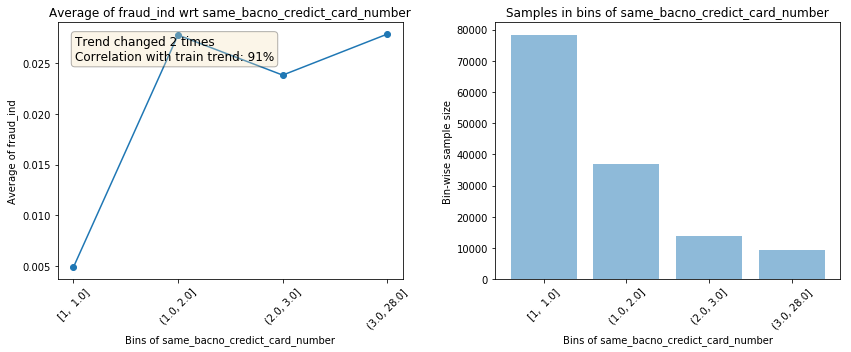

--------------------------------------------------------------------------------------------------------------


                               Plots for same_bacno_credict_card_number                               
                                           Train data plots                                           


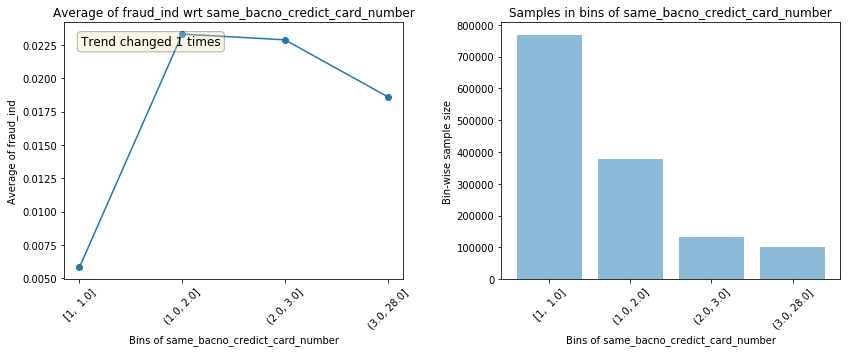

                                           Test data plots                                            


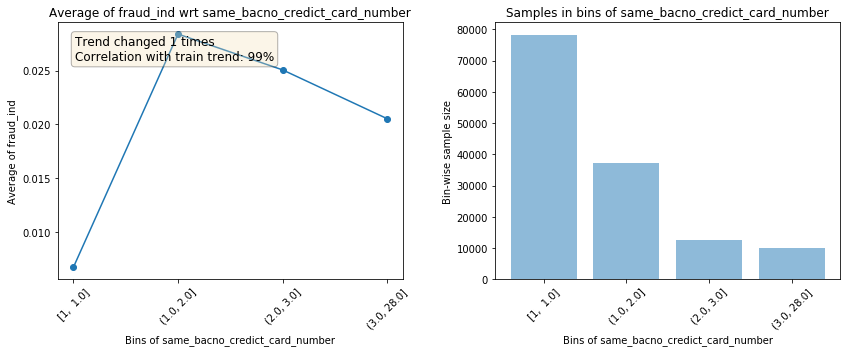

--------------------------------------------------------------------------------------------------------------


                               Plots for same_bacno_credict_card_number                               
                                           Train data plots                                           


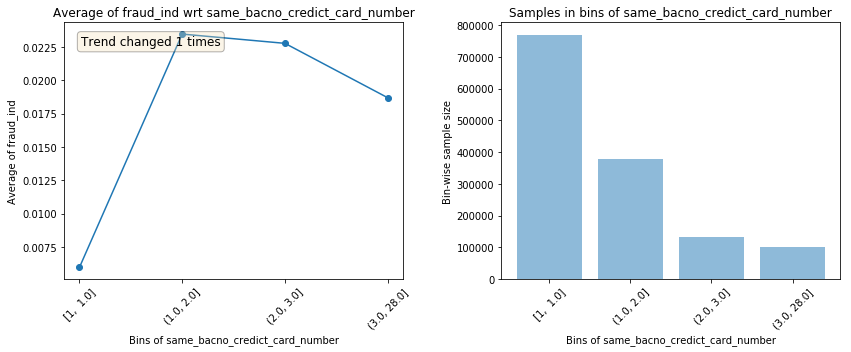

                                           Test data plots                                            


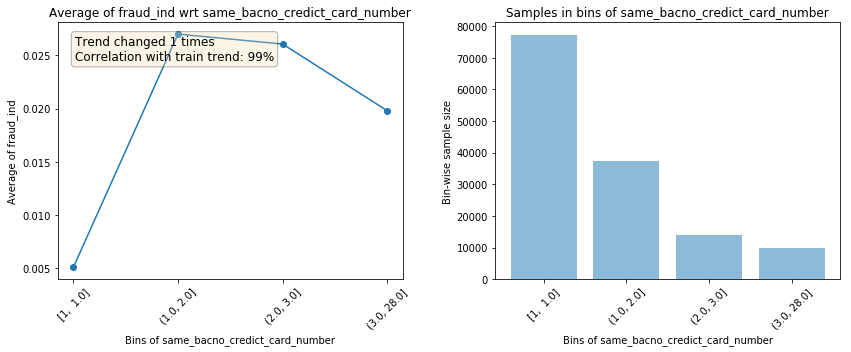

--------------------------------------------------------------------------------------------------------------


                               Plots for same_bacno_credict_card_number                               
                                           Train data plots                                           


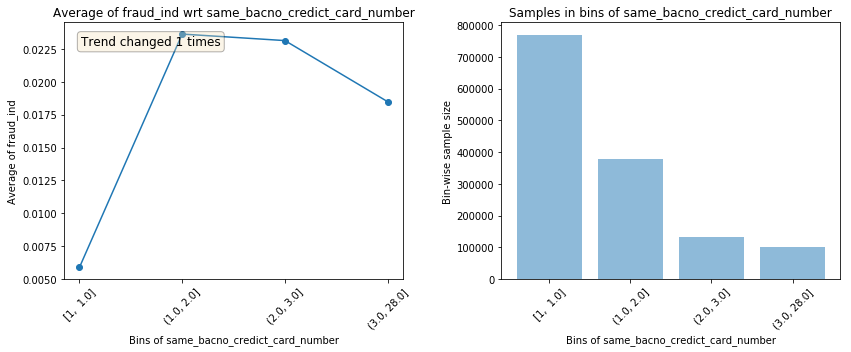

                                           Test data plots                                            


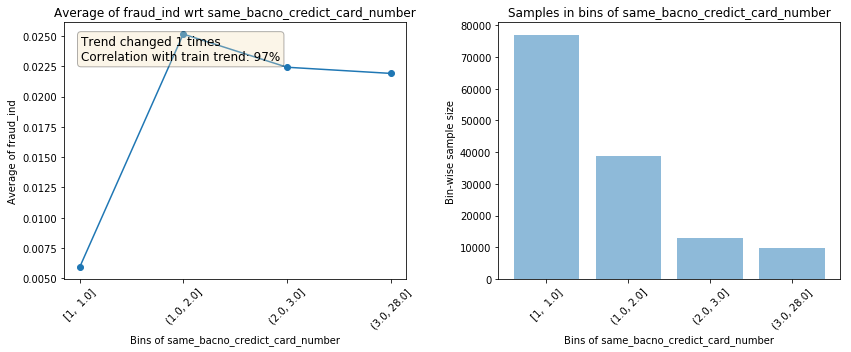

--------------------------------------------------------------------------------------------------------------


                               Plots for same_bacno_credict_card_number                               
                                           Train data plots                                           


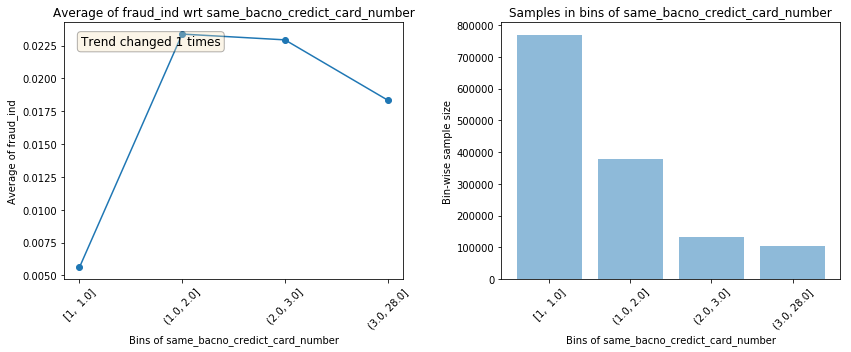

                                           Test data plots                                            


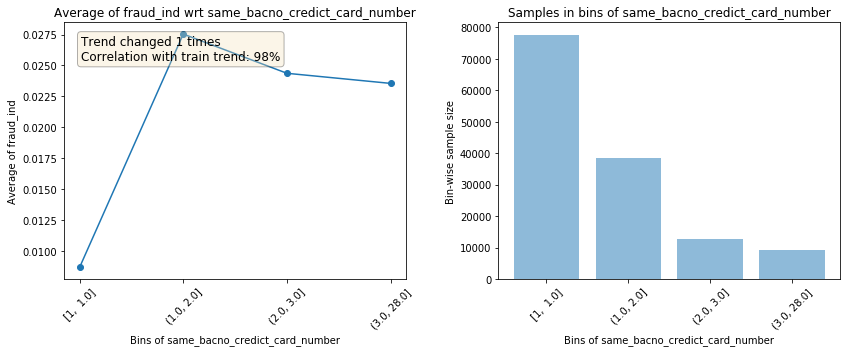

--------------------------------------------------------------------------------------------------------------




In [20]:
for epoch, (train_index, valid_index) in enumerate(zip(train_index_list,valid_index_list)):
    fold_train, fold_valid = train_data.iloc[train_index], train_data.iloc[valid_index]
    get_univariate_plots(data=fold_train, target_col='fraud_ind', 
                         features_list=['same_bacno_credict_card_number'], bins=10,data_test=fold_valid)

# 同一個歸戶帳戶下各信用卡使用率 (使用中)

In [4]:
sbctn = train_data.groupby(by=['bacno','cano'])['txkey'].count().rename('same_bacno_different_cano_trade_number').reset_index()
train_data = train_data.merge(sbctn,on=['bacno','cano'],how='left')
train_data['same_bacno_different_cano_trade_number'] = train_data['same_bacno_different_cano_trade_number'] / 60

In [52]:
train_data['same_bacno_cano_trade_number_ratio'] = train_data['same_bacno_different_cano_trade_number'] / train_data['same_bacno_transaction_number']

KeyError: 'same_bacno_different_cano_trade_number'

Text(0, 0.5, 'fraud number')

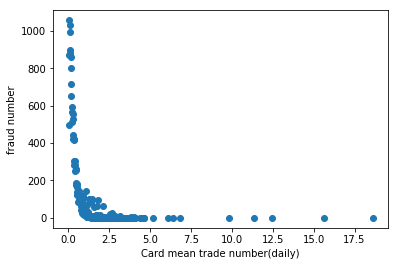

In [6]:
a = train_data.groupby(by='same_bacno_different_cano_trade_number')['fraud_ind'].sum()
plt.scatter(a.index, a.values)
plt.xlabel('Card mean trade number(daily)')
plt.ylabel('fraud number')

In [44]:
gg = train_data.groupby('same_bacno_cano_trade_number_ratio')['fraud_ind'].mean()
gg = gg.reset_index()

# 同一個歸戶帳號同一天使用信用卡數

In [60]:
sbsducn = train_data.groupby(by=['bacno','locdt'])['cano'].unique().rename('same_bacon_same_day_use_card_number').reset_index()

In [61]:
sbsducn['same_bacon_same_day_use_card_number'] = sbsducn['same_bacon_same_day_use_card_number'].apply(lambda x : len(x))

In [62]:
train_data = train_data.merge(sbsducn,on=['bacno','locdt'],how='left')

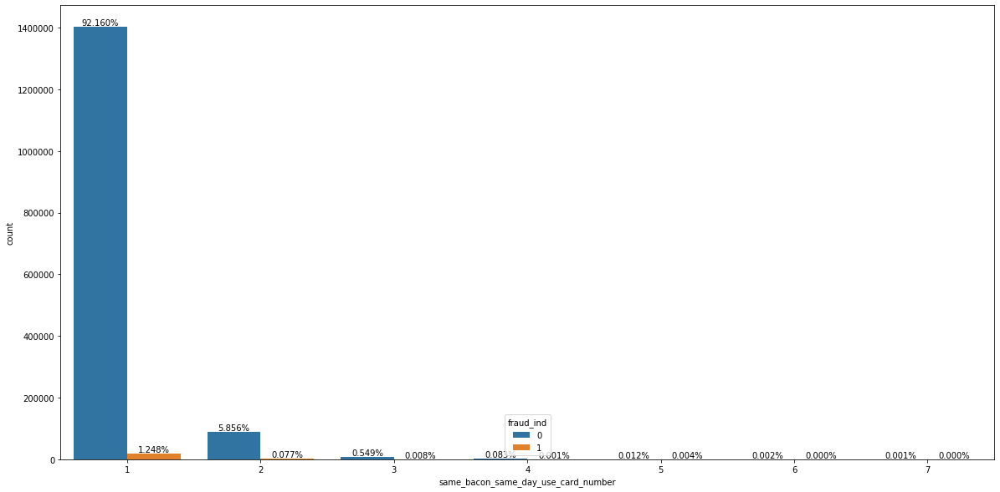

In [63]:
plt.figure(figsize=(20,10))
ax = sns.countplot(x='same_bacon_same_day_use_card_number',hue='fraud_ind',data=train_data)

ncount = len(train_data)
for p in ax.patches:
    x=p.get_bbox().get_points()[:,0]
    y=p.get_bbox().get_points()[1,1]
    if np.isnan(y) == True:
        y = 0
    ax.annotate('{:.3f}%'.format(100.*y/ncount), (x.mean(), y), 
            ha='center', va='bottom') # set the alignment of the text

# 同一張卡距離上一筆交易的時間差

In [4]:
#loctm
train_data['loctm'] = train_data['loctm'].apply(impute_time_zero)
train_data['loctm'] = train_data['loctm'].apply(time_to_second)
sorted_train_data = train_data.sort_values(by=['cano','locdt','loctm'])

first_train_data = train_data.sort_values(by=['locdt','loctm']).groupby(by='cano').first().reset_index()
first_train_data['is_first'] = 1

sorted_train_data['shift_locdt'] = sorted_train_data['locdt'].shift(1).fillna(0)

sorted_train_data['shift_loctm'] = sorted_train_data['loctm'].shift(1).fillna(0)

sorted_train_data['difference_locdt'] = sorted_train_data['locdt'] - sorted_train_data['shift_locdt']
sorted_train_data['difference_loctm'] = sorted_train_data['loctm'] - sorted_train_data['shift_loctm']
sorted_train_data['total_difference_second'] = 86400 * sorted_train_data['difference_locdt'] + sorted_train_data['difference_loctm']

sorted_train_data = sorted_train_data.merge(first_train_data[['txkey','is_first']],on='txkey',how='left')
sorted_train_data['is_first'] = sorted_train_data['is_first'].fillna(0)
sorted_train_data.loc[sorted_train_data['is_first']==1,'total_difference_second'] = -1

train_data = train_data.merge(sorted_train_data[['txkey','total_difference_second']],on='txkey',how='left')

'''
train_data['difference_hour'] = train_data['total_difference_second'] / 3600
train_data.loc[train_data['difference_hour']<0, 'difference_hour'] = -1

train_data['difference_minute'] = train_data.loc[(train_data['difference_hour']>0)&(train_data['difference_hour']<1), 'difference_hour'] * 60
train_data.loc[train_data['difference_hour']<0, 'difference_minute'] = -1
train_data['difference_minute'] = train_data['difference_minute'].fillna(1000)

train_data['difference_second'] = train_data.loc[(train_data['difference_minute']>0)&(train_data['difference_minute']<1), 'difference_minute'] * 60
train_data.loc[train_data['difference_second']<0, 'difference_minute'] = -1
train_data['difference_second'] = train_data['difference_second'].fillna(1000)
'''

In [40]:
a = train_data.groupby(by="total_difference_second")['fraud_ind'].sum()
a = a.reset_index()
a = a.loc[(a['total_difference_second']<100)&(a['total_difference_second']>0)]

Text(0, 0.5, 'fraud number')

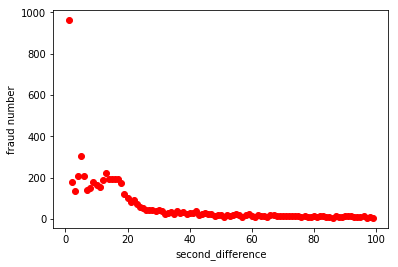

In [46]:
plt.scatter(a['total_difference_second'], a['fraud_ind'], c="r")
plt.xlabel("second_difference")
plt.ylabel('fraud number')

# 同一張交易同一商品在同一天有相同的時間差

In [10]:
def cal_same_cano_same_mcc_difference_second(x):
    print(x)
    print('---------------')

In [11]:
train_data.groupby(by=['cano','locdt','mcc'])['loctm'].apply(lambda x : cal_same_cano_same_mcc_difference_second(x))

284164    151948.0
Name: (0, 1, 251), dtype: float64
---------------
1185304    154407.0
Name: (0, 4, 251), dtype: float64
---------------
726295    145342.0
Name: (0, 20, 286), dtype: float64
---------------
155960    152243.0
Name: (0, 29, 251), dtype: float64
---------------
418445    143710.0
Name: (0, 37, 251), dtype: float64
---------------
466560    152017.0
Name: (0, 40, 255), dtype: float64
---------------
1223772    140023.0
Name: (0, 43, 251), dtype: float64
---------------
938678    133815.0
Name: (0, 75, 251), dtype: float64
---------------
600105    151816.0
Name: (0, 89, 228), dtype: float64
---------------
460982    112412.0
Name: (1, 43, 388), dtype: float64
---------------
893628    191326.0
Name: (1, 47, 286), dtype: float64
---------------
616779    103424.0
Name: (1, 49, 388), dtype: float64
---------------
557228    81220.0
Name: (2, 4, 191), dtype: float64
---------------
676759    125559.0
Name: (2, 7, 191), dtype: float64
---------------
1092596    153839.0
Nam

Name: (29, 27, 292), dtype: float64
---------------
141310    174307.0
173622    173841.0
Name: (29, 28, 52), dtype: float64
---------------
511943    61119.0
Name: (29, 42, 212), dtype: float64
---------------
324408    151549.0
Name: (29, 46, 250), dtype: float64
---------------
313297    113002.0
Name: (29, 52, 289), dtype: float64
---------------
486304     151236.0
790427     150000.0
1038668    150736.0
1476875    173543.0
Name: (29, 53, 203), dtype: float64
---------------
994727    120020.0
Name: (29, 53, 322), dtype: float64
---------------
957545     215910.0
1362899    164347.0
Name: (29, 56, 191), dtype: float64
---------------
466715    114211.0
Name: (29, 62, 102), dtype: float64
---------------
584343    24842.0
Name: (29, 73, 212), dtype: float64
---------------
177270    112913.0
295847    112914.0
Name: (29, 83, 289), dtype: float64
---------------
687234    104129.0
Name: (30, 26, 191), dtype: float64
---------------
58254    153156.0
Name: (30, 55, 209), dtype: floa

Name: (88, 74, 457), dtype: float64
---------------
123926    144102.0
Name: (88, 76, 251), dtype: float64
---------------
1422314    181450.0
Name: (88, 80, 264), dtype: float64
---------------
1149951    164729.0
Name: (88, 82, 457), dtype: float64
---------------
1350320    114031.0
Name: (88, 83, 251), dtype: float64
---------------
1490686    102618.0
Name: (88, 84, 457), dtype: float64
---------------
172348    165249.0
Name: (88, 88, 457), dtype: float64
---------------
866787    154050.0
Name: (88, 89, 251), dtype: float64
---------------
443730    102300.0
Name: (89, 59, 251), dtype: float64
---------------
1167085    102012.0
Name: (89, 73, 251), dtype: float64
---------------
1059157    230707.0
Name: (89, 75, 251), dtype: float64
---------------
316772    233521.0
Name: (89, 76, 251), dtype: float64
---------------
1495958    224213.0
Name: (89, 85, 251), dtype: float64
---------------
1345664    133418.0
Name: (90, 68, 251), dtype: float64
---------------
993202    190141.

---------------
84032      203226.0
172884     202914.0
456531     203132.0
510760     203218.0
817444     202915.0
1154742    203131.0
1373710    203227.0
Name: (132, 61, 380), dtype: float64
---------------
107011    131706.0
Name: (133, 18, 263), dtype: float64
---------------
519822    145451.0
Name: (133, 57, 263), dtype: float64
---------------
365410    203417.0
555320    203423.0
Name: (133, 61, 380), dtype: float64
---------------
546818    110309.0
Name: (134, 75, 263), dtype: float64
---------------
492249    161800.0
823597    161720.0
Name: (134, 75, 286), dtype: float64
---------------
251558    152853.0
Name: (135, 75, 251), dtype: float64
---------------
595400     172555.0
1270018    172644.0
Name: (135, 87, 251), dtype: float64
---------------
532663    180553.0
Name: (136, 43, 55), dtype: float64
---------------
661258     181104.0
1136682    181736.0
1312332    174650.0
1353607    181539.0
Name: (139, 18, 247), dtype: float64
---------------
309430    172615.0
Name:

Name: (204, 85, 421), dtype: float64
---------------
1402862    141000.0
Name: (204, 87, 292), dtype: float64
---------------
546964    165927.0
Name: (204, 88, 299), dtype: float64
---------------
863818    112721.0
Name: (204, 88, 421), dtype: float64
---------------
701341    132021.0
Name: (209, 1, 212), dtype: float64
---------------
1215771    91113.0
Name: (209, 1, 445), dtype: float64
---------------
60187    175512.0
Name: (209, 7, 457), dtype: float64
---------------
620583    93521.0
Name: (209, 13, 207), dtype: float64
---------------
1313144    143301.0
Name: (209, 13, 457), dtype: float64
---------------
462373    124559.0
Name: (209, 19, 457), dtype: float64
---------------
527064    113348.0
Name: (209, 22, 432), dtype: float64
---------------
367451    93725.0
Name: (209, 39, 457), dtype: float64
---------------
769274    93443.0
Name: (209, 46, 207), dtype: float64
---------------
796823    175133.0
Name: (209, 50, 457), dtype: float64
---------------
718841    91734.

Name: (269, 31, 251), dtype: float64
---------------
950411    191538.0
Name: (269, 32, 251), dtype: float64
---------------
608700    150035.0
Name: (269, 36, 251), dtype: float64
---------------
1019600    191514.0
1076594    192317.0
Name: (269, 37, 292), dtype: float64
---------------
1862    192700.0
Name: (269, 38, 457), dtype: float64
---------------
289732    193936.0
Name: (269, 45, 251), dtype: float64
---------------
699771     203441.0
1480772    203403.0
Name: (269, 47, 251), dtype: float64
---------------
464756     212959.0
1429245    212930.0
Name: (269, 51, 251), dtype: float64
---------------
635191    114113.0
Name: (269, 54, 247), dtype: float64
---------------
1157542    210823.0
Name: (269, 55, 251), dtype: float64
---------------
1206085    193120.0
Name: (269, 58, 457), dtype: float64
---------------
803010    191221.0
Name: (269, 59, 251), dtype: float64
---------------
713202    165234.0
Name: (269, 66, 251), dtype: float64
---------------
1023380    205000.0


---------------
1283248    131309.0
Name: (281, 85, 264), dtype: float64
---------------
782471    114356.0
Name: (282, 47, 451), dtype: float64
---------------
1517023    102256.0
Name: (287, 1, 411), dtype: float64
---------------
1280885    132547.0
Name: (287, 4, 457), dtype: float64
---------------
337383    115655.0
Name: (287, 7, 251), dtype: float64
---------------
1153713    121602.0
1316109    121605.0
Name: (287, 7, 411), dtype: float64
---------------
665170    204556.0
Name: (287, 8, 251), dtype: float64
---------------
63841    140721.0
Name: (287, 9, 457), dtype: float64
---------------
1109985    172756.0
Name: (287, 12, 457), dtype: float64
---------------
849415    205622.0
Name: (287, 15, 251), dtype: float64
---------------
448211    162515.0
Name: (287, 16, 457), dtype: float64
---------------
667827    154110.0
Name: (287, 20, 251), dtype: float64
---------------
851838    110952.0
Name: (287, 20, 343), dtype: float64
---------------
299545    111325.0
Name: (287,

Name: (303, 6, 251), dtype: float64
---------------
338071    172352.0
Name: (303, 9, 264), dtype: float64
---------------
92409    125842.0
Name: (303, 15, 277), dtype: float64
---------------
680851    132259.0
Name: (303, 21, 291), dtype: float64
---------------
801708    124318.0
Name: (303, 24, 207), dtype: float64
---------------
258774    193147.0
Name: (303, 28, 209), dtype: float64
---------------
141080    114121.0
Name: (303, 29, 264), dtype: float64
---------------
758789    131759.0
Name: (303, 35, 291), dtype: float64
---------------
616554    133050.0
Name: (303, 48, 281), dtype: float64
---------------
390812    121254.0
Name: (303, 48, 291), dtype: float64
---------------
320819    155510.0
Name: (303, 49, 264), dtype: float64
---------------
1269323    130701.0
Name: (303, 50, 291), dtype: float64
---------------
1451396    161153.0
Name: (303, 54, 207), dtype: float64
---------------
1228474    123701.0
Name: (303, 61, 291), dtype: float64
---------------
1051096    

Name: (345, 62, 251), dtype: float64
---------------
1472537    221332.0
Name: (345, 75, 457), dtype: float64
---------------
166869    150347.0
Name: (345, 76, 251), dtype: float64
---------------
176451    110630.0
Name: (345, 82, 457), dtype: float64
---------------
1285106    200745.0
Name: (346, 76, 417), dtype: float64
---------------
1498007    170028.0
Name: (347, 75, 251), dtype: float64
---------------
821726    131719.0
Name: (347, 82, 251), dtype: float64
---------------
894677    165652.0
Name: (347, 83, 251), dtype: float64
---------------
1159395    151428.0
Name: (349, 32, 292), dtype: float64
---------------
724636    142241.0
Name: (352, 5, 247), dtype: float64
---------------
50601    224115.0
Name: (352, 7, 257), dtype: float64
---------------
872491    213858.0
Name: (352, 32, 457), dtype: float64
---------------
437474    234710.0
Name: (352, 56, 457), dtype: float64
---------------
224335    120415.0
Name: (352, 60, 257), dtype: float64
---------------
1094692   

Name: (377, 87, 263), dtype: float64
---------------
312747    143533.0
Name: (378, 44, 203), dtype: float64
---------------
1314385    135639.0
Name: (381, 15, 263), dtype: float64
---------------
587205    181502.0
Name: (381, 35, 251), dtype: float64
---------------
1343021    194903.0
Name: (381, 45, 263), dtype: float64
---------------
1037843    164157.0
Name: (381, 51, 251), dtype: float64
---------------
1342585    170524.0
Name: (381, 56, 251), dtype: float64
---------------
541380    170010.0
Name: (381, 74, 251), dtype: float64
---------------
908894    103728.0
Name: (381, 79, 263), dtype: float64
---------------
668183    91015.0
Name: (384, 8, 251), dtype: float64
---------------
504758    163203.0
Name: (384, 15, 306), dtype: float64
---------------
514265    155706.0
Name: (384, 16, 251), dtype: float64
---------------
850116    101640.0
Name: (384, 22, 191), dtype: float64
---------------
687868    140547.0
Name: (384, 25, 227), dtype: float64
---------------
320870   

Name: (398, 60, 189), dtype: float64
---------------
714409     135545.0
1466083    135544.0
Name: (398, 62, 205), dtype: float64
---------------
1467101    143232.0
Name: (398, 62, 251), dtype: float64
---------------
524804    93427.0
Name: (398, 67, 207), dtype: float64
---------------
217553    72223.0
Name: (398, 68, 380), dtype: float64
---------------
966145    153214.0
Name: (398, 69, 203), dtype: float64
---------------
1492459    201708.0
Name: (398, 70, 251), dtype: float64
---------------
1482569    151818.0
Name: (398, 87, 251), dtype: float64
---------------
1238338    101249.0
Name: (399, 53, 451), dtype: float64
---------------
767378    111527.0
Name: (400, 28, 374), dtype: float64
---------------
432581    154106.0
Name: (400, 49, 248), dtype: float64
---------------
1361843    104407.0
Name: (401, 7, 451), dtype: float64
---------------
762064    104831.0
Name: (401, 42, 451), dtype: float64
---------------
818618    101125.0
Name: (401, 82, 451), dtype: float64
----

Name: (453, 64, 292), dtype: float64
---------------
414358     35359.0
868334     35357.0
872153     35358.0
1261073    35356.0
Name: (453, 65, 247), dtype: float64
---------------
24057       34412.0
78827       34410.0
138308      34409.0
185131      34412.0
292688      34411.0
492572      34413.0
554648      34412.0
1056078     34412.0
1108633     34411.0
1182903     34411.0
1185443    150022.0
1309687     34411.0
Name: (453, 65, 248), dtype: float64
---------------
31417      60235.0
105093     60224.0
481120     60231.0
658785     60226.0
779551     60222.0
931607     60233.0
1090708    60220.0
1312058    60229.0
1486230    60228.0
Name: (453, 81, 319), dtype: float64
---------------
191227     210230.0
1501412    210025.0
Name: (453, 82, 248), dtype: float64
---------------
903153    1320.0
Name: (453, 83, 248), dtype: float64
---------------
77544      80741.0
153072     45022.0
164011     42335.0
252146     44906.0
321156     45024.0
325408     45127.0
474794     45023.0
55343

Name: (472, 90, 251), dtype: float64
---------------
468284    121102.0
Name: (473, 60, 250), dtype: float64
---------------
512754    121545.0
Name: (474, 2, 251), dtype: float64
---------------
557663    152343.0
Name: (474, 8, 251), dtype: float64
---------------
670344    170317.0
Name: (474, 15, 251), dtype: float64
---------------
379120    151524.0
Name: (474, 16, 251), dtype: float64
---------------
521353    120242.0
Name: (474, 23, 251), dtype: float64
---------------
100697    204722.0
Name: (474, 26, 305), dtype: float64
---------------
539668    142710.0
Name: (474, 29, 251), dtype: float64
---------------
1465083    175142.0
Name: (474, 36, 251), dtype: float64
---------------
24826    124057.0
Name: (474, 43, 209), dtype: float64
---------------
312733    172325.0
Name: (474, 43, 251), dtype: float64
---------------
36390    120753.0
Name: (474, 51, 251), dtype: float64
---------------
1496831    113108.0
Name: (474, 54, 286), dtype: float64
---------------
883987    211

---------------
1059695    125856.0
Name: (528, 37, 306), dtype: float64
---------------
1350004    153114.0
Name: (528, 45, 286), dtype: float64
---------------
503432    184700.0
964050    185508.0
Name: (528, 60, 306), dtype: float64
---------------
176474    180827.0
716847    181341.0
Name: (528, 62, 306), dtype: float64
---------------
717591    175315.0
Name: (528, 65, 251), dtype: float64
---------------
851011    134355.0
Name: (528, 74, 305), dtype: float64
---------------
833109    134124.0
Name: (528, 80, 281), dtype: float64
---------------
689934    143009.0
Name: (528, 85, 247), dtype: float64
---------------
7016    135144.0
Name: (528, 85, 305), dtype: float64
---------------
419813    144032.0
Name: (528, 86, 306), dtype: float64
---------------
46822    134342.0
Name: (530, 10, 251), dtype: float64
---------------
1353262    130851.0
Name: (530, 24, 251), dtype: float64
---------------
949890     171330.0
1219076    131153.0
Name: (530, 59, 251), dtype: float64
-----

Name: (590, 66, 122), dtype: float64
---------------
255716    90152.0
Name: (590, 67, 289), dtype: float64
---------------
1242496    110509.0
Name: (590, 67, 432), dtype: float64
---------------
291909    134907.0
Name: (590, 70, 421), dtype: float64
---------------
1472483    104917.0
Name: (590, 80, 289), dtype: float64
---------------
1026920    90242.0
Name: (590, 81, 289), dtype: float64
---------------
1029446    90249.0
Name: (590, 88, 289), dtype: float64
---------------
771319    140331.0
Name: (592, 2, 457), dtype: float64
---------------
960103    65520.0
Name: (592, 9, 457), dtype: float64
---------------
1089355    152431.0
Name: (592, 17, 457), dtype: float64
---------------
999962    121410.0
Name: (592, 28, 263), dtype: float64
---------------
666988    193526.0
Name: (592, 34, 457), dtype: float64
---------------
24659    55718.0
Name: (592, 46, 457), dtype: float64
---------------
1076184    214100.0
Name: (592, 47, 457), dtype: float64
---------------
339620    121

Name: (595, 67, 192), dtype: float64
---------------
318936     194859.0
1269703     93455.0
1386372     93323.0
1418084     92900.0
Name: (595, 68, 192), dtype: float64
---------------
189481    93842.0
Name: (595, 69, 192), dtype: float64
---------------
1418388    84849.0
Name: (596, 41, 343), dtype: float64
---------------
820670    121245.0
Name: (597, 3, 264), dtype: float64
---------------
1106329    222457.0
Name: (597, 6, 247), dtype: float64
---------------
881952    195124.0
Name: (597, 8, 457), dtype: float64
---------------
660183    142847.0
Name: (597, 10, 296), dtype: float64
---------------
1152455    193548.0
Name: (597, 11, 457), dtype: float64
---------------
615940    133604.0
Name: (597, 14, 264), dtype: float64
---------------
1166264    201352.0
Name: (597, 15, 457), dtype: float64
---------------
461012    213555.0
Name: (597, 16, 457), dtype: float64
---------------
53659    180930.0
Name: (597, 21, 257), dtype: float64
---------------
1170465    203430.0
Name

Name: (624, 54, 289), dtype: float64
---------------
1293075    180144.0
Name: (624, 59, 360), dtype: float64
---------------
960312    161230.0
Name: (624, 61, 264), dtype: float64
---------------
556786    173951.0
Name: (624, 61, 411), dtype: float64
---------------
621294     174412.0
1043818     91620.0
Name: (624, 62, 289), dtype: float64
---------------
816858    101735.0
Name: (624, 64, 360), dtype: float64
---------------
19087    143145.0
Name: (624, 67, 251), dtype: float64
---------------
1054121    155626.0
Name: (624, 69, 251), dtype: float64
---------------
1468847    173041.0
Name: (624, 73, 251), dtype: float64
---------------
1498089    104025.0
Name: (624, 74, 289), dtype: float64
---------------
1003000    32726.0
Name: (624, 78, 289), dtype: float64
---------------
1164620    144548.0
Name: (624, 80, 281), dtype: float64
---------------
1140496    51041.0
Name: (624, 85, 289), dtype: float64
---------------
1159326    223143.0
Name: (624, 86, 374), dtype: float64
-

Name: (661, 78, 292), dtype: float64
---------------
786136    181057.0
Name: (662, 2, 263), dtype: float64
---------------
764842    203042.0
Name: (662, 3, 264), dtype: float64
---------------
1324514    161330.0
Name: (662, 8, 264), dtype: float64
---------------
143313    145837.0
Name: (662, 9, 251), dtype: float64
---------------
1235992    174924.0
Name: (662, 9, 264), dtype: float64
---------------
1159073    202851.0
Name: (662, 11, 264), dtype: float64
---------------
764565    182221.0
Name: (662, 12, 264), dtype: float64
---------------
1049537    211048.0
Name: (662, 12, 292), dtype: float64
---------------
156350    204327.0
Name: (662, 15, 263), dtype: float64
---------------
964066    94934.0
Name: (662, 17, 263), dtype: float64
---------------
878683    122351.0
Name: (662, 17, 264), dtype: float64
---------------
442580    174534.0
Name: (662, 19, 264), dtype: float64
---------------
80991     124600.0
130934    125217.0
Name: (662, 19, 277), dtype: float64
----------

KeyboardInterrupt: 

In [16]:
train_data.loc[train_data['cano']==7].sort_values(by=['locdt','loctm'])

,acqic,bacno,cano,conam,contp,csmcu,ecfg,etymd,flbmk,flg_3dsmk,fraud_ind,hcefg,insfg,iterm,locdt,loctm,mcc,mchno,ovrlt,scity,stocn,stscd,txkey,same_cano_same_locdt_mcc_transaction_number
989125,6716,2901,7,579.11,5,62,N,5,N,N,0,5,N,0,4,140236.0,251,46255,N,4526,102,0,1406445,1
977309,6767,2901,7,1485.11,5,62,Y,8,N,Y,0,5,N,0,5,85931.0,435,16796,N,5817,102,0,978157,1
1079093,5975,2901,7,392.72,5,62,N,5,N,N,0,5,N,0,10,80832.0,263,92685,N,5817,102,0,1124967,1
1202225,5962,2901,7,652.61,4,62,Y,8,N,N,0,5,N,0,10,200102.0,319,75824,N,5817,102,0,981698,1
1332283,5975,2901,7,617.70,5,62,N,4,N,N,0,5,N,0,11,133113.0,263,91478,N,5817,102,0,1625130,1
1108492,6716,2901,7,1587.87,5,62,Y,8,N,N,0,5,N,0,13,74839.0,441,34371,N,5820,102,0,983033,1
1389987,5975,2901,7,666.87,5,62,N,4,N,N,0,5,N,0,19,104447.0,263,91500,N,5817,102,0,1273348,1
734671,6777,2901,7,359.56,5,62,N,5,N,N,0,5,N,0,20,83359.0,250,3089,N,5817,102,0,1701902,1
1004252,5975,2901,7,657.24,5,62,N,5,N,N,0,5,N,0,20,142428.0,292,92109,N,5817,102,0,1488175,1
173012,6769,2901,7,1895.57,5,62,Y,8,N,N,0,5,Y,7,20,200729.0,247,82174,N,5817,102,0,279558,1


# 同一張卡同一天商品交易數目(使用中)

In [33]:
scslmtn = train_data.groupby(by=['cano','locdt','mcc'])['txkey'].count().rename('same_cano_same_locdt_mcc_transaction_number').reset_index()
train_data = train_data.merge(scslmtn,on=['cano','locdt','mcc'],how='left')

In [34]:
scmtn = train_data.groupby(by=['cano','mcc'])['txkey'].count().rename('same_cano_mcc_transaction_number').reset_index()
train_data = train_data.merge(scmtn,on=['cano','mcc'],how='left')

train_data['same_cano_current_day_mcc_ratio'] = train_data['same_cano_same_locdt_mcc_transaction_number'] / train_data['same_cano_mcc_transaction_number']

                              Plots for same_cano_current_day_mcc_ratio                               
                                           Train data plots                                           


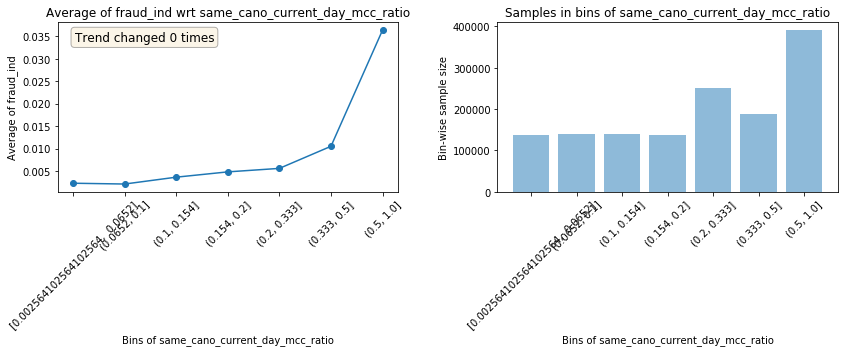

                                           Test data plots                                            


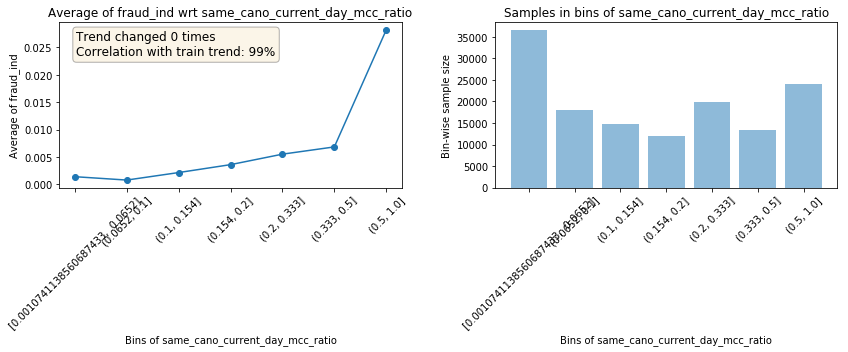

--------------------------------------------------------------------------------------------------------------


                              Plots for same_cano_current_day_mcc_ratio                               
                                           Train data plots                                           


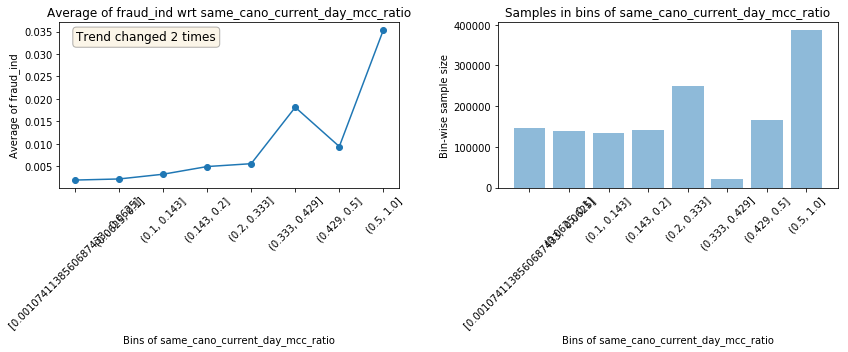

                                           Test data plots                                            


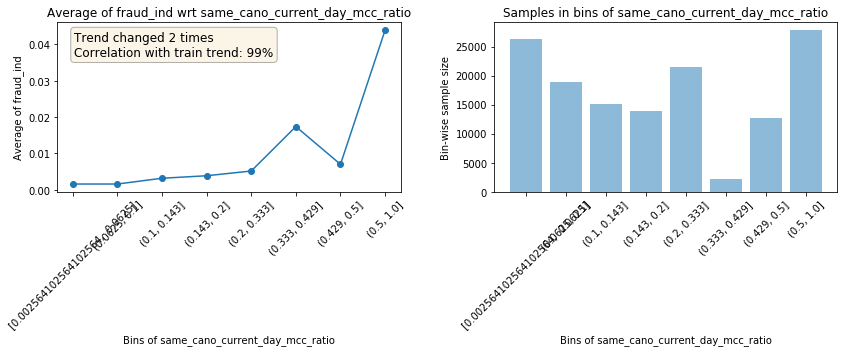

--------------------------------------------------------------------------------------------------------------


                              Plots for same_cano_current_day_mcc_ratio                               
                                           Train data plots                                           


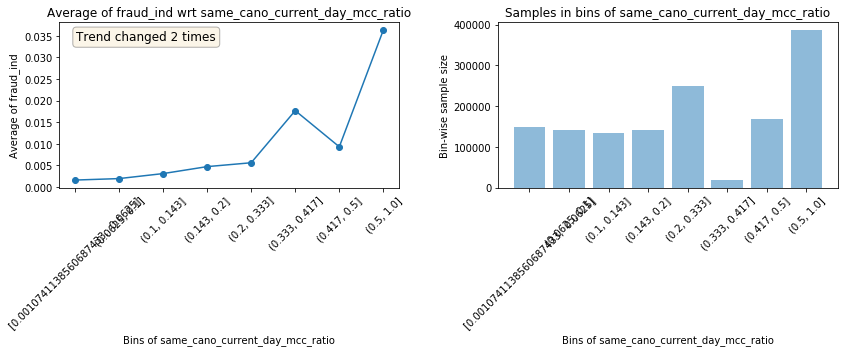

                                           Test data plots                                            


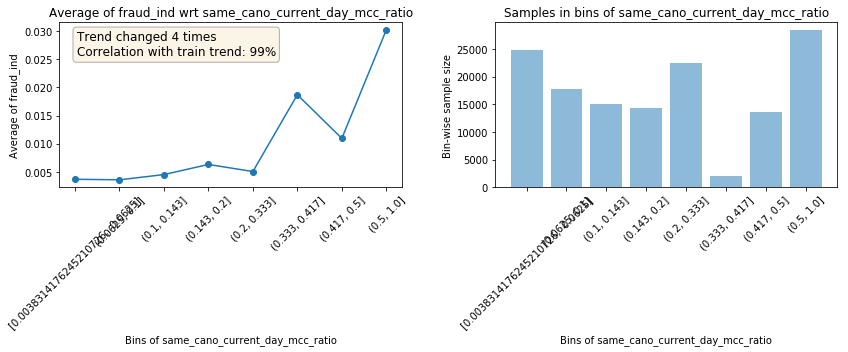

--------------------------------------------------------------------------------------------------------------


                              Plots for same_cano_current_day_mcc_ratio                               
                                           Train data plots                                           


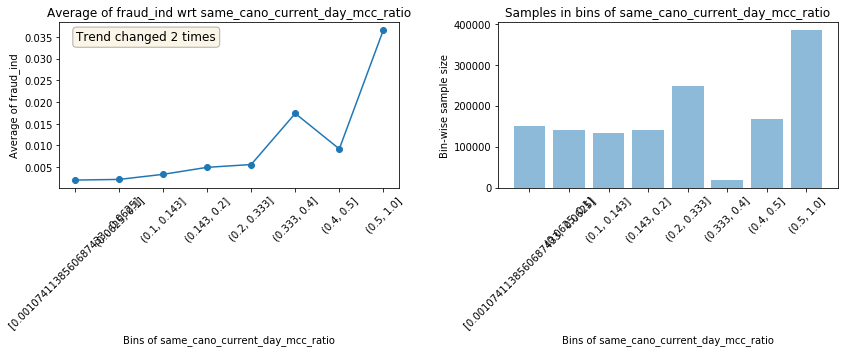

                                           Test data plots                                            


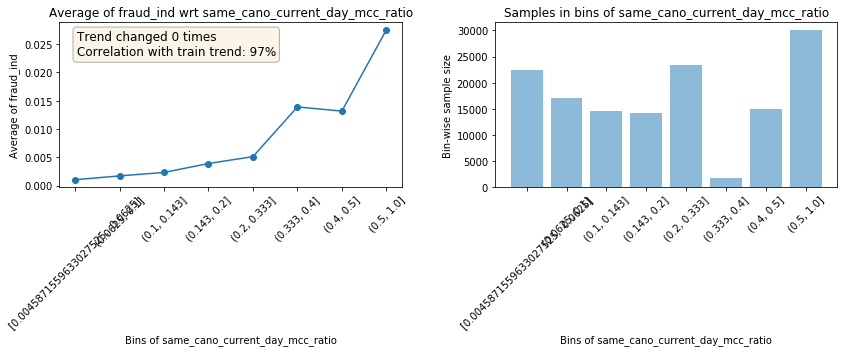

--------------------------------------------------------------------------------------------------------------


                              Plots for same_cano_current_day_mcc_ratio                               
                                           Train data plots                                           


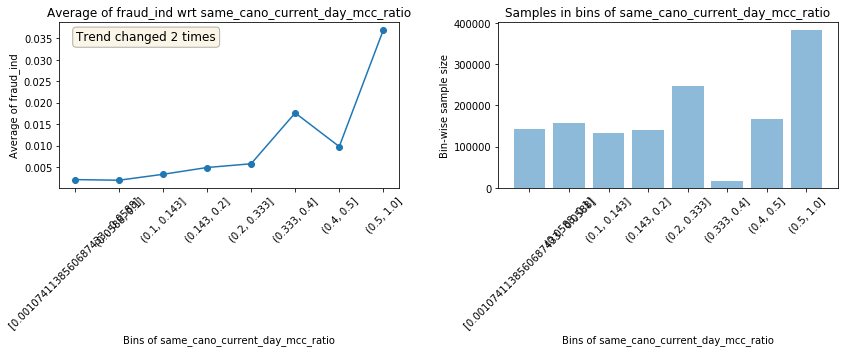

                                           Test data plots                                            


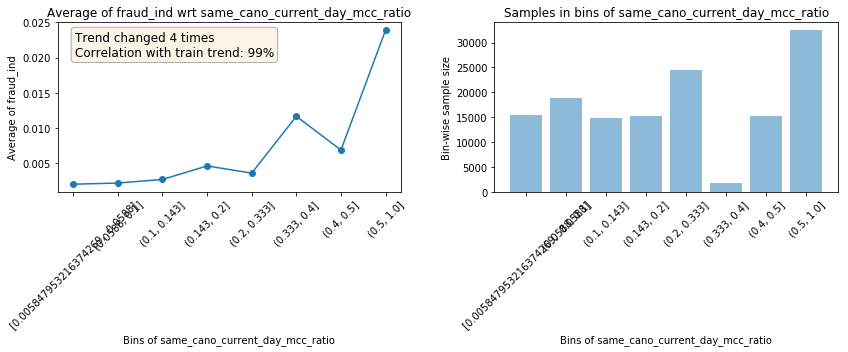

--------------------------------------------------------------------------------------------------------------


                              Plots for same_cano_current_day_mcc_ratio                               
                                           Train data plots                                           


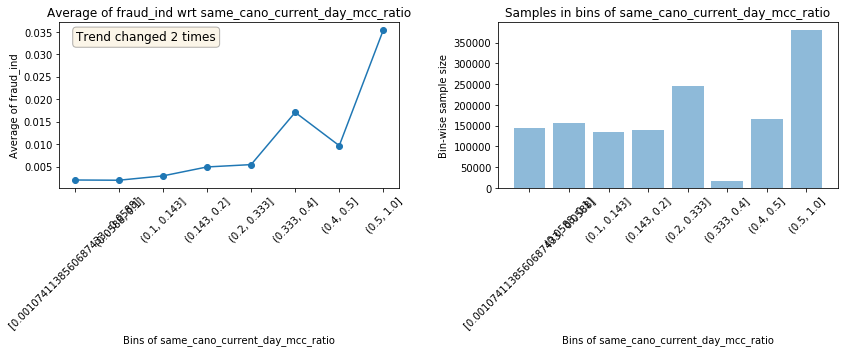

                                           Test data plots                                            


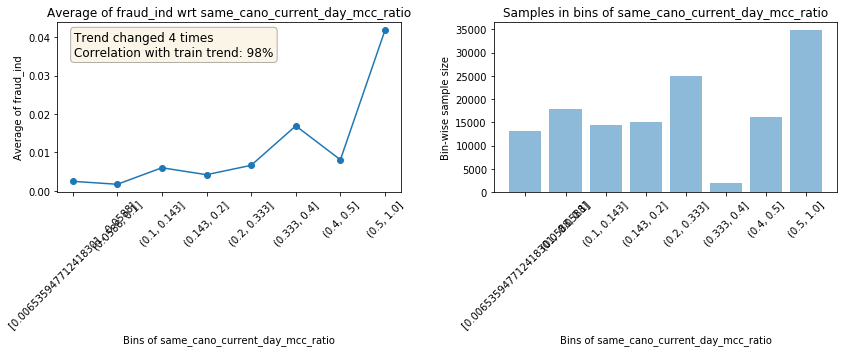

--------------------------------------------------------------------------------------------------------------


                              Plots for same_cano_current_day_mcc_ratio                               
                                           Train data plots                                           


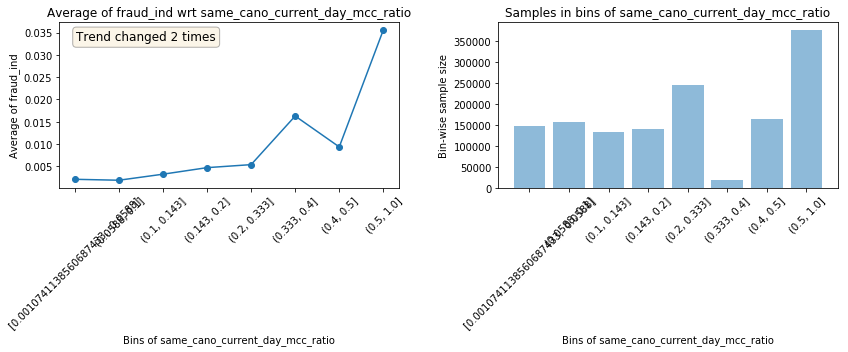

                                           Test data plots                                            


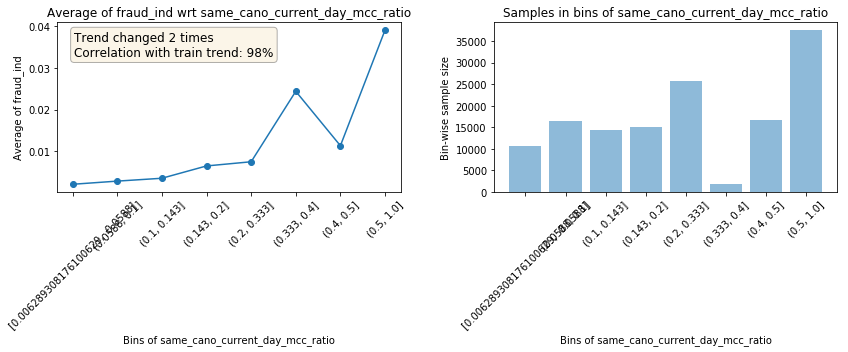

--------------------------------------------------------------------------------------------------------------


                              Plots for same_cano_current_day_mcc_ratio                               
                                           Train data plots                                           


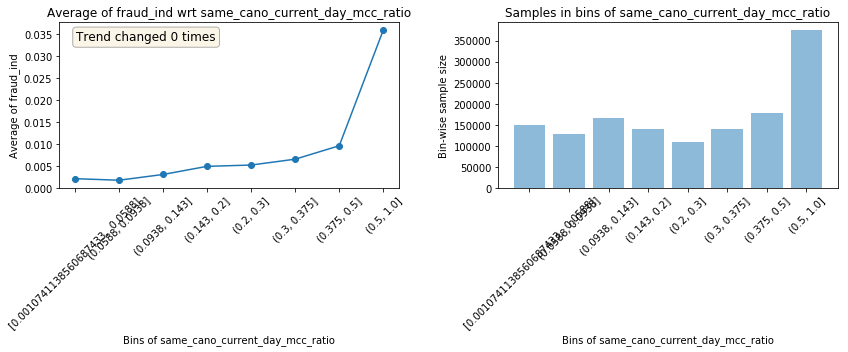

                                           Test data plots                                            


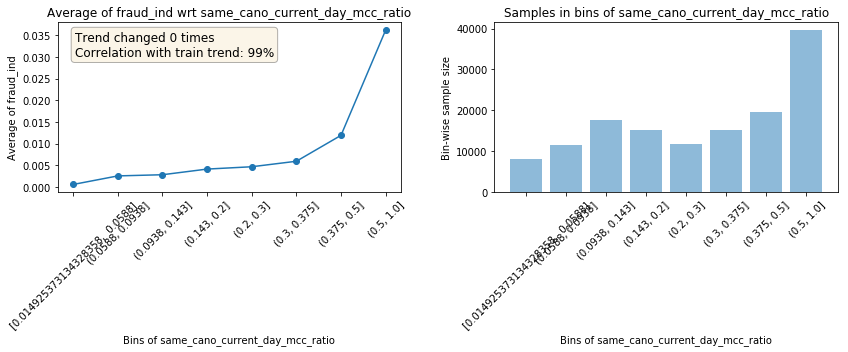

--------------------------------------------------------------------------------------------------------------


                              Plots for same_cano_current_day_mcc_ratio                               
                                           Train data plots                                           


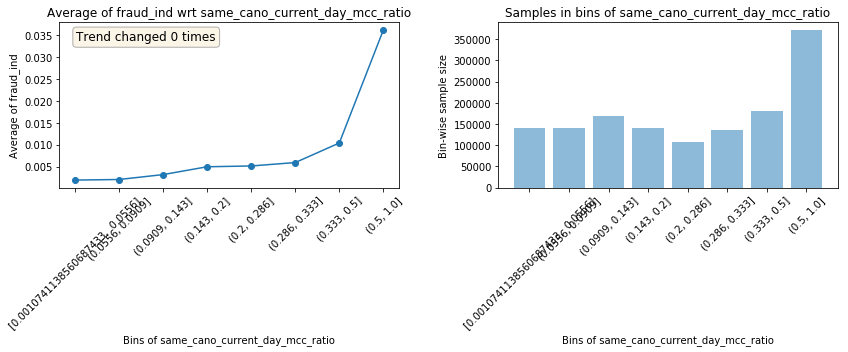

                                           Test data plots                                            


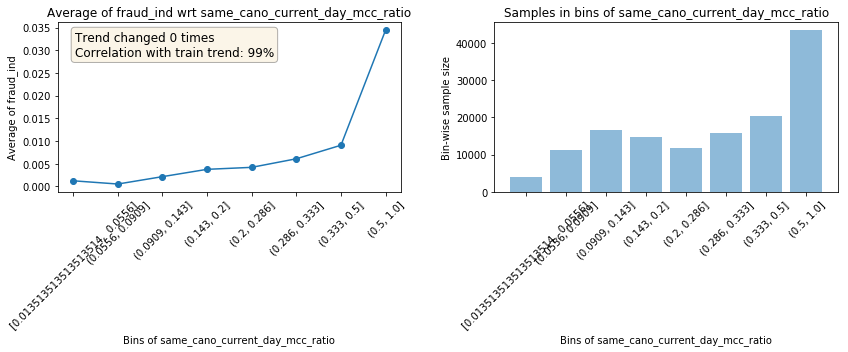

--------------------------------------------------------------------------------------------------------------


                              Plots for same_cano_current_day_mcc_ratio                               
                                           Train data plots                                           


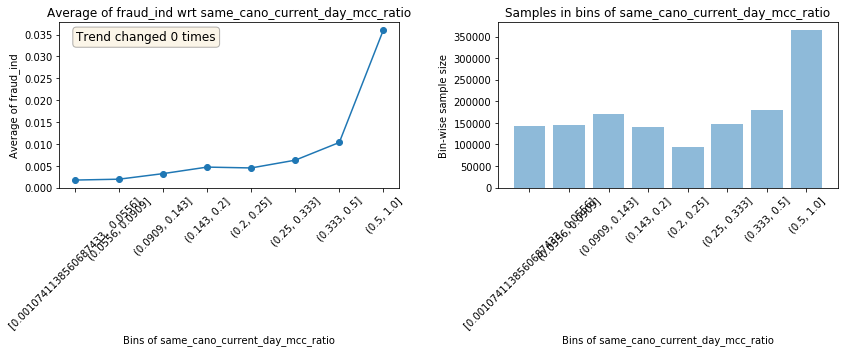

                                           Test data plots                                            


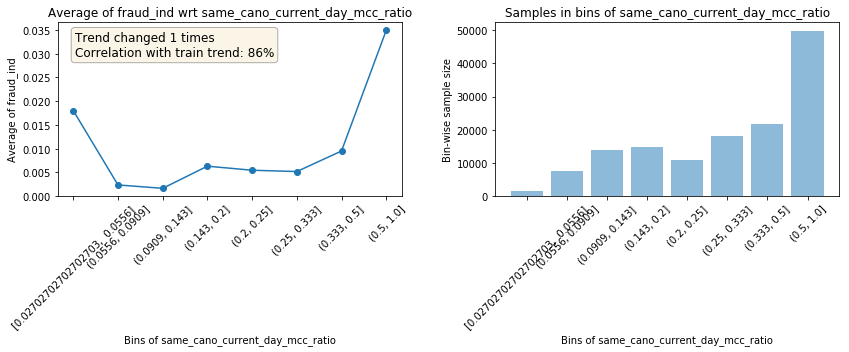

--------------------------------------------------------------------------------------------------------------




In [35]:
for epoch, (train_index, valid_index) in enumerate(zip(train_index_list,valid_index_list)):
    fold_train, fold_valid = train_data.iloc[train_index], train_data.iloc[valid_index]
    get_univariate_plots(data=fold_train, target_col='fraud_ind', 
                         features_list=['same_cano_current_day_mcc_ratio'], bins=10,data_test=fold_valid)

# 同一張卡距離上一筆交易差幾天

In [113]:
sorted_train_data.loc[sorted_train_data['is_first']==1,'difference_locdt'] = -1

train_data = train_data.merge(sorted_train_data[['txkey','difference_locdt']],on='txkey',how='left')

# 同一帳戶在各時段交易次數

In [71]:
sbshtn = train_data.groupby(by=['bacno','hour'])['txkey'].count().rename('same_bacno_same_hour_transaction_number').reset_index()
train_data = train_data.merge(sbshtn,on=['bacno','hour'],how='left')

KeyError: 'hour'

In [ ]:
plt.figure(figsize=(100,50))
ax = sns.countplot(x='same_bacno_same_hour_transaction_number',hue='fraud_ind',data=train_data)
ncount = len(train_data)
for p in ax.patches:
    x=p.get_bbox().get_points()[:,0]
    y=p.get_bbox().get_points()[1,1]
    if np.isnan(y) == True:
        y = 0
    ax.annotate('{:.3f}%'.format(100.*y/ncount), (x.mean(), y), 
            ha='center', va='bottom') # set the alignment of the text

# 同一帳戶同一商品不同商店交易次數

In [ ]:
sbsmdmtn = train_data.groupby(by=['bacno','mcc','mchno'])['txkey'].count().rename('same_bacno_same_mcc_different_mchno_transaction_number').reset_index()
train_data = train_data.merge(sbsmdmtn,on=['bacno','mcc','mchno'],how='left')

# 同一帳戶同一商品不同商店交易次數比例

In [ ]:
# 同一帳戶同一商品不同商店交易次數比例
sbsmdmtn = train_data.groupby(by=['bacno','mcc','mchno'])['txkey'].count().rename('same_bacno_same_mcc_different_mchno_transaction_number').reset_index()
train_data = train_data.merge(sbsmdmtn,on=['bacno','mcc','mchno'],how='left')

sbsmtn = train_data.groupby(by=['bacno','mcc'])['txkey'].count().rename('same_bacno_same_mcc_transaction_number').reset_index()
train_data = train_data.merge(sbsmtn,on=['bacno','mcc'],how='left')

train_data['same_bacno_same_mcc_different_mchno_transaction_ratio'] = train_data['same_bacno_same_mcc_different_mchno_transaction_number'] / train_data['same_bacno_same_mcc_transaction_number']

# 同一信用卡不同天交易次數 (使用中)

In [31]:
scddtn = train_data.groupby(by='cano')['txkey'].count().rename('same_cano_difference_day_transaction_number').reset_index()
train_data = train_data.merge(scddtn,on='cano',how='left')

                        Plots for same_cano_difference_day_transaction_number                         
                                           Train data plots                                           


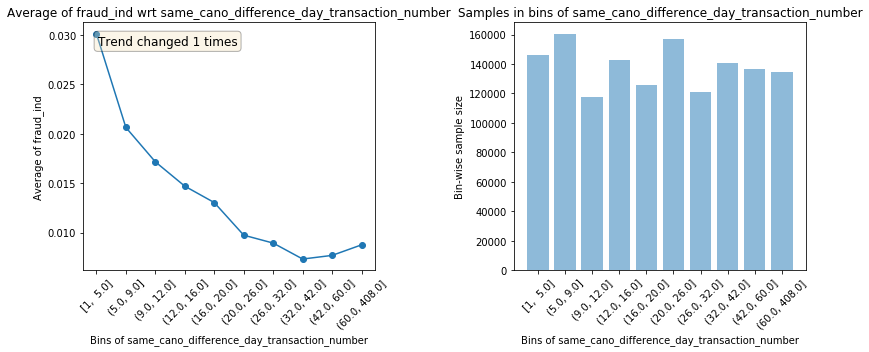

                                           Test data plots                                            


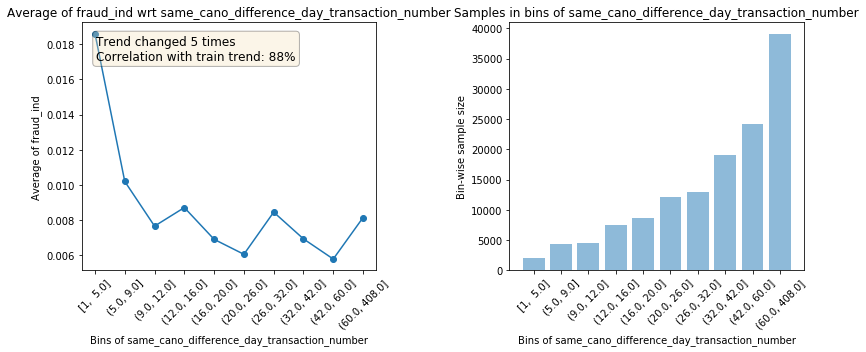

--------------------------------------------------------------------------------------------------------------


                        Plots for same_cano_difference_day_transaction_number                         
                                           Train data plots                                           


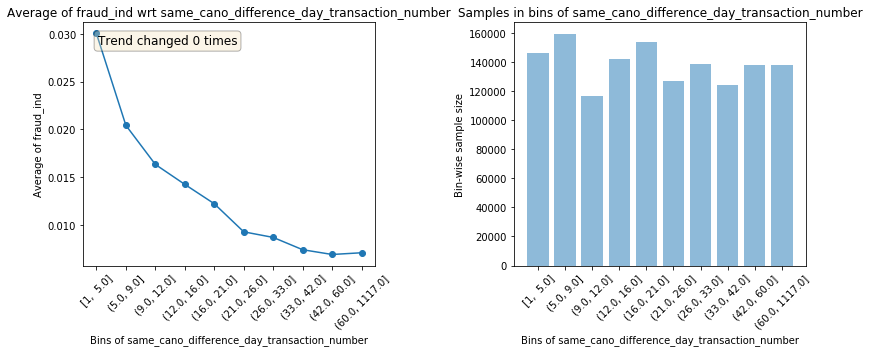

                                           Test data plots                                            


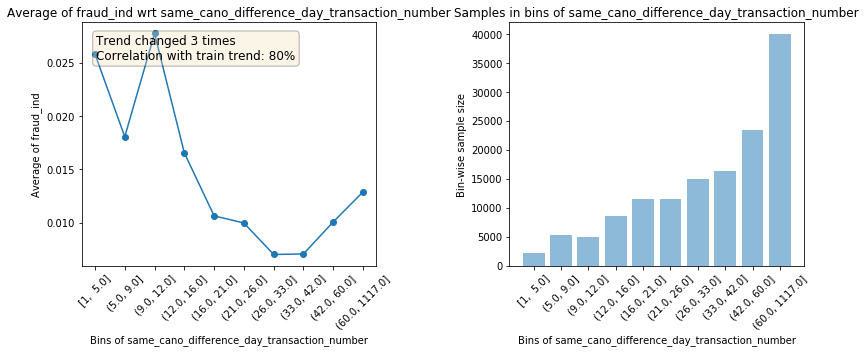

--------------------------------------------------------------------------------------------------------------


                        Plots for same_cano_difference_day_transaction_number                         
                                           Train data plots                                           


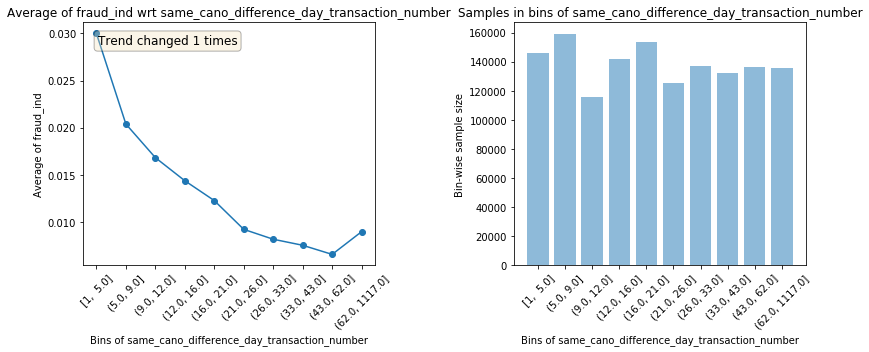

                                           Test data plots                                            


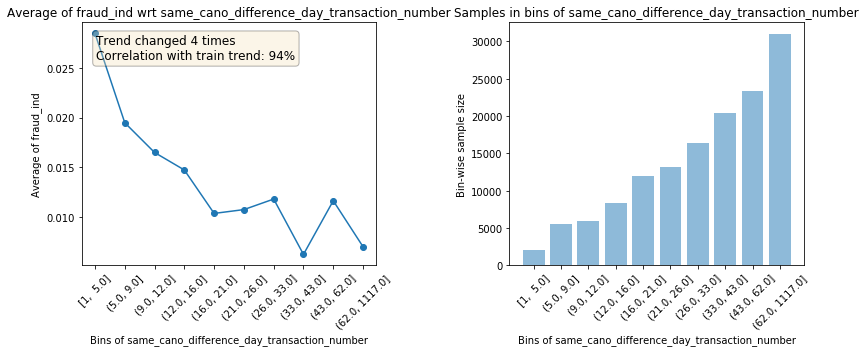

--------------------------------------------------------------------------------------------------------------


                        Plots for same_cano_difference_day_transaction_number                         
                                           Train data plots                                           


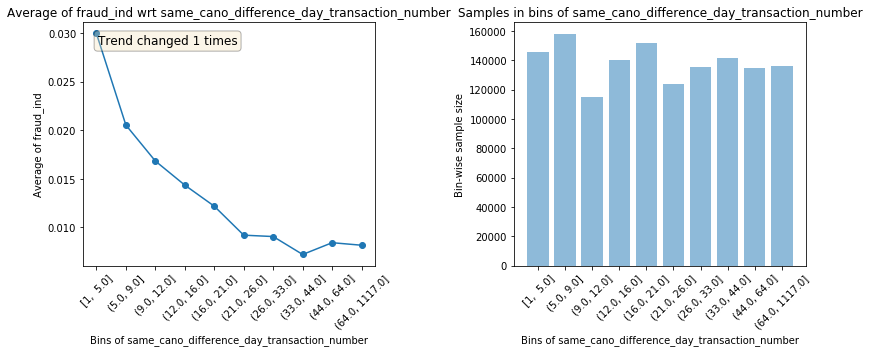

                                           Test data plots                                            


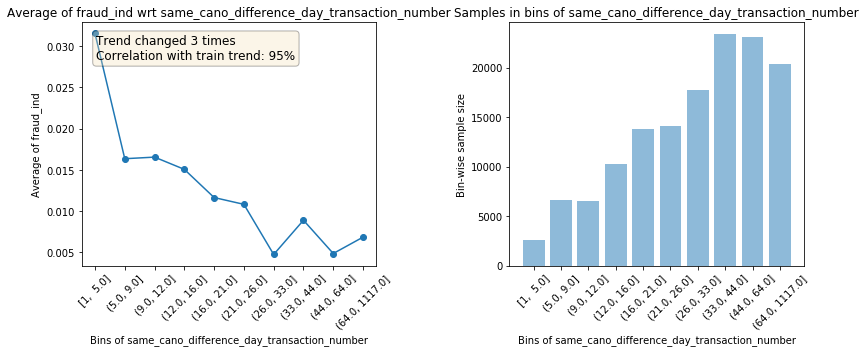

--------------------------------------------------------------------------------------------------------------


                        Plots for same_cano_difference_day_transaction_number                         
                                           Train data plots                                           


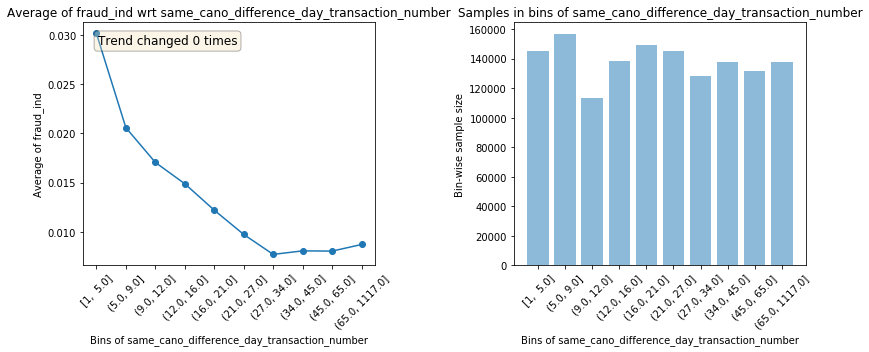

                                           Test data plots                                            


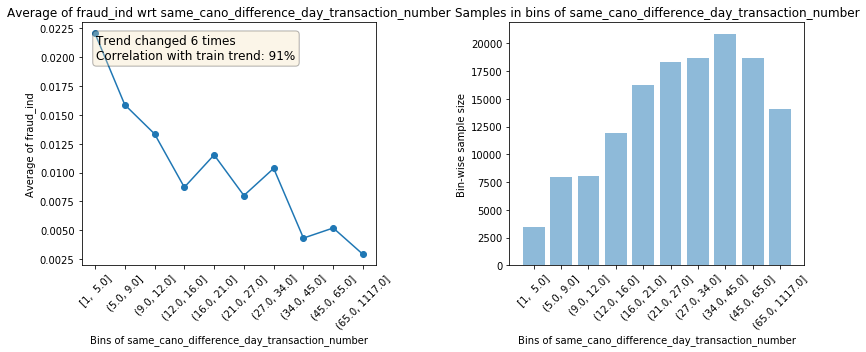

--------------------------------------------------------------------------------------------------------------


                        Plots for same_cano_difference_day_transaction_number                         
                                           Train data plots                                           


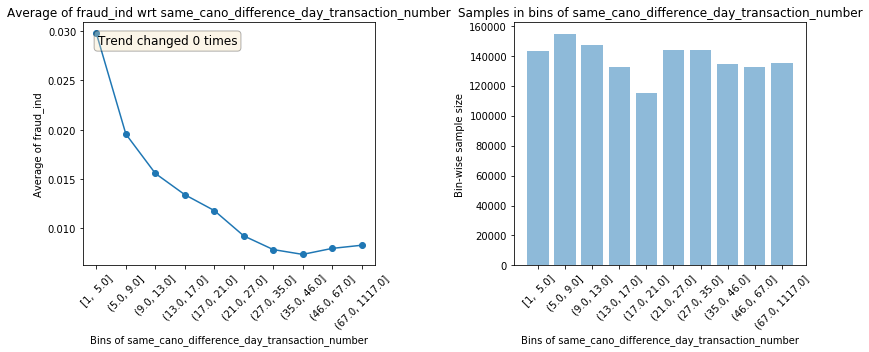

                                           Test data plots                                            


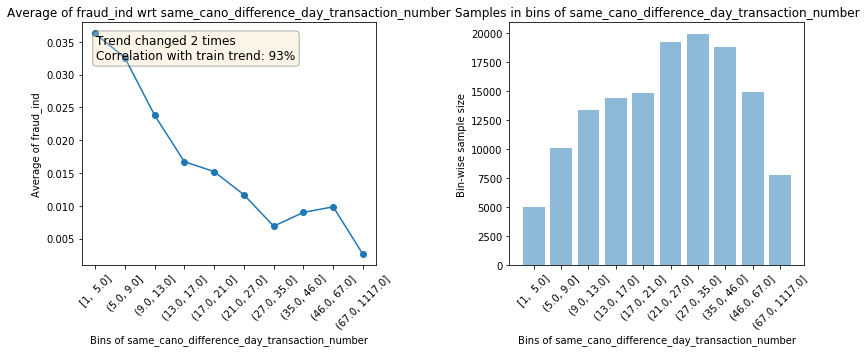

--------------------------------------------------------------------------------------------------------------


                        Plots for same_cano_difference_day_transaction_number                         
                                           Train data plots                                           


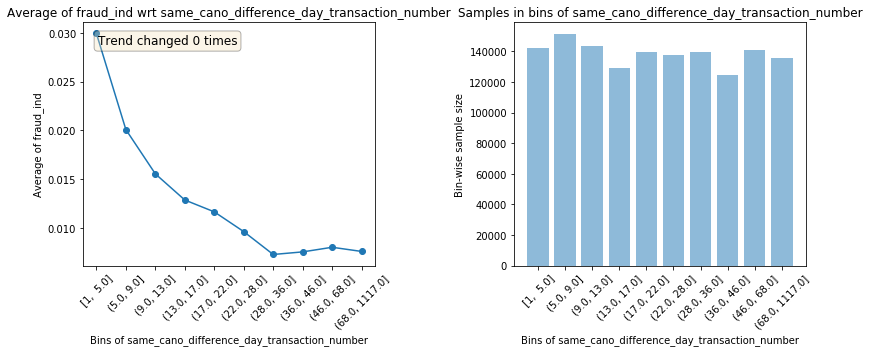

                                           Test data plots                                            


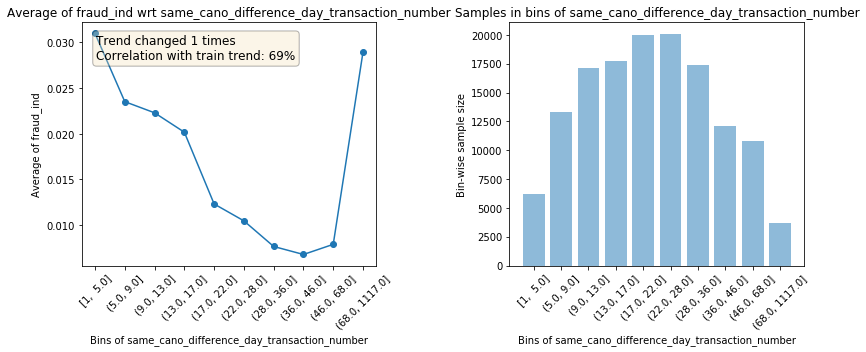

--------------------------------------------------------------------------------------------------------------


                        Plots for same_cano_difference_day_transaction_number                         
                                           Train data plots                                           


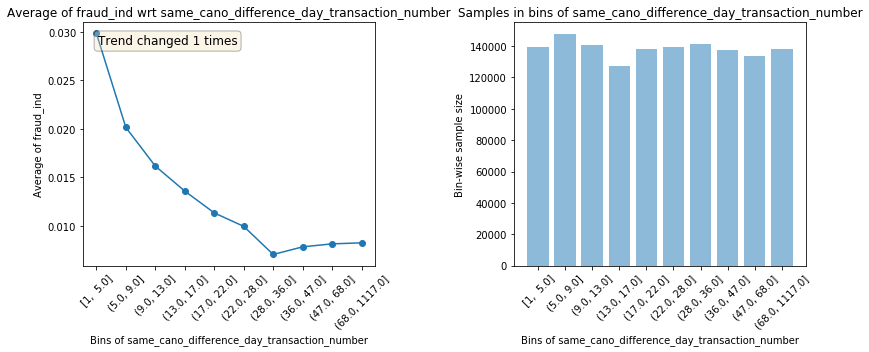

                                           Test data plots                                            


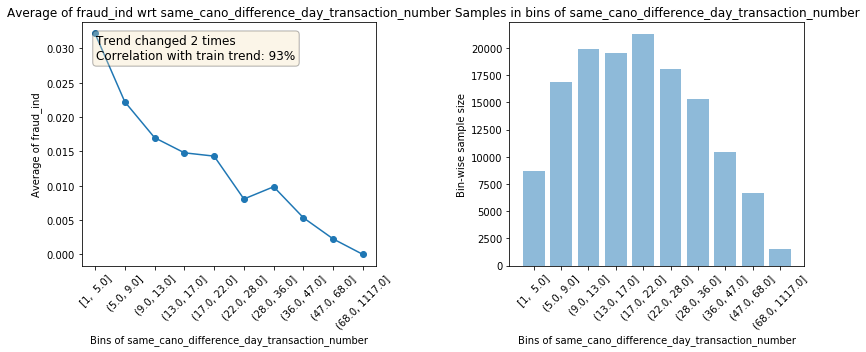

--------------------------------------------------------------------------------------------------------------


                        Plots for same_cano_difference_day_transaction_number                         
                                           Train data plots                                           


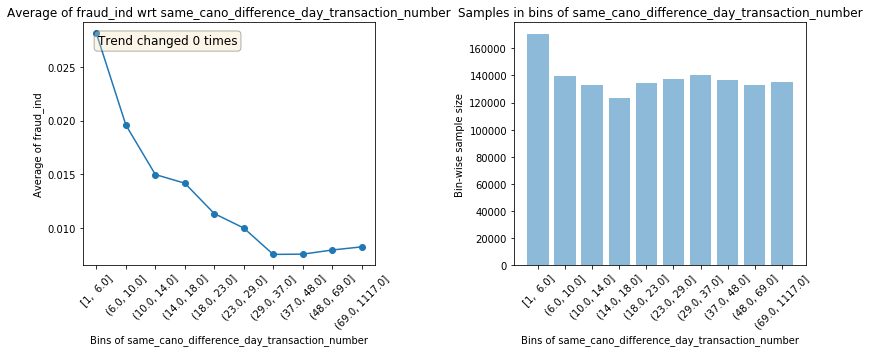

                                           Test data plots                                            


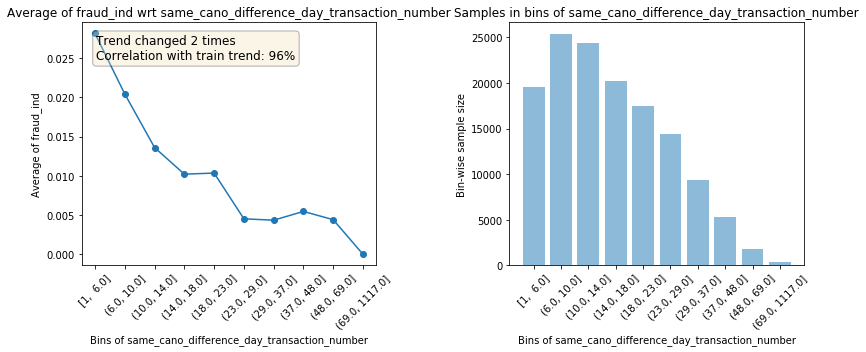

--------------------------------------------------------------------------------------------------------------


                        Plots for same_cano_difference_day_transaction_number                         
                                           Train data plots                                           


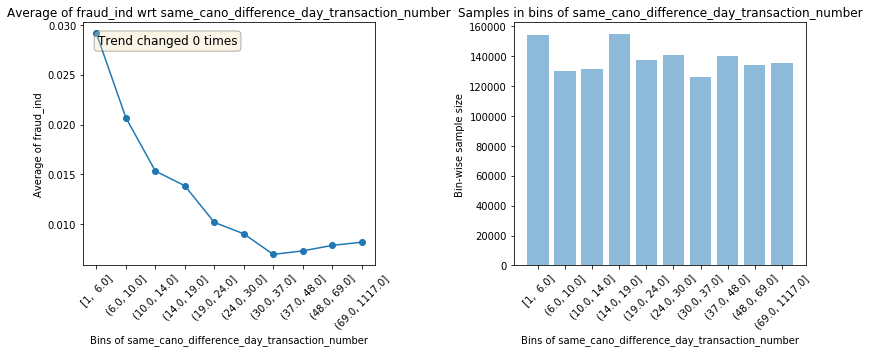

                                           Test data plots                                            


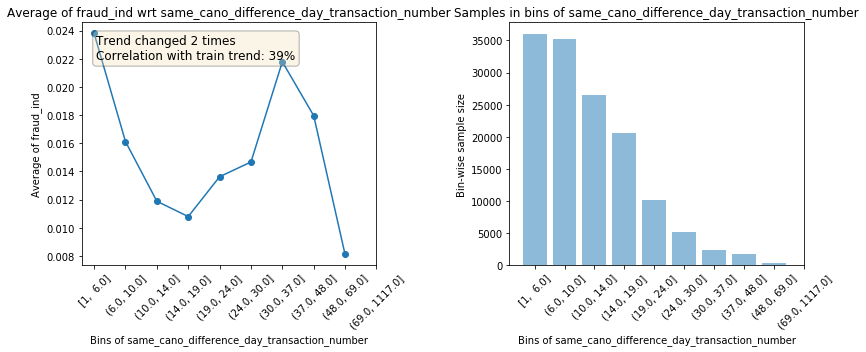

--------------------------------------------------------------------------------------------------------------




In [32]:
for epoch, (train_index, valid_index) in enumerate(zip(train_index_list,valid_index_list)):
    fold_train, fold_valid = train_data.iloc[train_index], train_data.iloc[valid_index]
    get_univariate_plots(data=fold_train, target_col='fraud_ind', 
                         features_list=['same_cano_difference_day_transaction_number'], bins=10,data_test=fold_valid)

# 同一張卡是否為常用幣別且常用消費國別

In [74]:
frequent_csmcu = train_data.groupby(by='cano')['csmcu'].apply(lambda x : x.mode()).rename('frequent_csmcu').reset_index()

frequent_csmcu_0 = frequent_csmcu.loc[frequent_csmcu['level_1']==0]
frequent_csmcu_0.drop('level_1',axis=1,inplace=True)
frequent_csmcu_0.columns = ['cano','frequent_csmcu_0']


frequent_csmcu_1 = frequent_csmcu.loc[frequent_csmcu['level_1']==1]
frequent_csmcu_1.drop('level_1',axis=1,inplace=True)
frequent_csmcu_1.columns = ['cano','frequent_csmcu_1']

frequent_csmcu_2 = frequent_csmcu.loc[frequent_csmcu['level_1']==2]
frequent_csmcu_2.drop('level_1',axis=1,inplace=True)
frequent_csmcu_2.columns = ['cano','frequent_csmcu_2']

frequent_csmcu_3 = frequent_csmcu.loc[frequent_csmcu['level_1']==3]
frequent_csmcu_3.drop('level_1',axis=1,inplace=True)
frequent_csmcu_3.columns = ['cano','frequent_csmcu_3']

final_frequent_csmcu = frequent_csmcu_0.merge(frequent_csmcu_1,on='cano',how='left')
final_frequent_csmcu = final_frequent_csmcu.merge(frequent_csmcu_2,on='cano',how='left')
final_frequent_csmcu = final_frequent_csmcu.merge(frequent_csmcu_3,on='cano',how='left')

train_data = train_data.merge(final_frequent_csmcu,on='cano',how='left')

C:\Users\champ\Anaconda3\lib\site-packages\pandas\core\frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


In [75]:
frequent_stocn = train_data.groupby(by='cano')['stocn'].apply(lambda x : x.mode()).rename('frequent_stocn').reset_index()

In [76]:
frequent_stocn['level_1'].value_counts()

0    129413
1      2321
2       240
3        19
4         1
Name: level_1, dtype: int64

In [77]:
frequent_stocn = train_data.groupby(by='cano')['stocn'].apply(lambda x : x.mode()).rename('frequent_stocn').reset_index()

frequent_stocn_0 = frequent_stocn.loc[frequent_stocn['level_1']==0]
frequent_stocn_0.drop('level_1',axis=1,inplace=True)
frequent_stocn_0.columns = ['cano','frequent_stocn_0']


frequent_stocn_1 = frequent_stocn.loc[frequent_stocn['level_1']==1]
frequent_stocn_1.drop('level_1',axis=1,inplace=True)
frequent_stocn_1.columns = ['cano','frequent_stocn_1']

frequent_stocn_2 = frequent_stocn.loc[frequent_stocn['level_1']==2]
frequent_stocn_2.drop('level_1',axis=1,inplace=True)
frequent_stocn_2.columns = ['cano','frequent_stocn_2']

frequent_stocn_3 = frequent_stocn.loc[frequent_stocn['level_1']==3]
frequent_stocn_3.drop('level_1',axis=1,inplace=True)
frequent_stocn_3.columns = ['cano','frequent_stocn_3']

frequent_stocn_4 = frequent_stocn.loc[frequent_stocn['level_1']==4]
frequent_stocn_4.drop('level_1',axis=1,inplace=True)
frequent_stocn_4.columns = ['cano','frequent_stocn_4']

final_frequent_stocn = frequent_stocn_0.merge(frequent_stocn_1,on='cano',how='left')
final_frequent_stocn = final_frequent_stocn.merge(frequent_stocn_2,on='cano',how='left')
final_frequent_stocn = final_frequent_stocn.merge(frequent_stocn_3,on='cano',how='left')
final_frequent_stocn = final_frequent_stocn.merge(frequent_stocn_4,on='cano',how='left')

train_data = train_data.merge(final_frequent_stocn,on='cano',how='left')

In [78]:
def find_difference_csmcu_stocn(x):
    is_difference_csmcu_stocn = 0
    csmcu_list = []
    stocn_list = []
    csmcu_list.append(x['frequent_csmcu_0'])
    stocn_list.append(x['frequent_stocn_0'])
    if pd.isnull(x['frequent_csmcu_1']) == False:
        csmcu_list.append(x['frequent_csmcu_1'])
    if pd.isnull(x['frequent_csmcu_2']) == False:
        csmcu_list.append(x['frequent_csmcu_2'])
    if pd.isnull(x['frequent_csmcu_3']) == False:
        csmcu_list.append(x['frequent_csmcu_3'])
    if x['csmcu'] not in csmcu_list:
        is_difference_csmcu_stocn = 1
    
    if pd.isnull(x['frequent_stocn_1']) == False:
        stocn_list.append(x['frequent_stocn_1'])
    if pd.isnull(x['frequent_stocn_2']) == False:
        stocn_list.append(x['frequent_stocn_2'])
    if pd.isnull(x['frequent_stocn_3']) == False:
        stocn_list.append(x['frequent_stocn_3'])
    if pd.isnull(x['frequent_stocn_4']) == False:
        stocn_list.append(x['frequent_stocn_4'])
    if x['stocn'] not in stocn_list:
        is_difference_csmcu_stocn = 1
    
    return is_difference_csmcu_stocn
            

In [79]:
train_data['is_difference_csmcu_stocn'] = train_data.progress_apply(find_difference_csmcu_stocn,axis=1)

In [80]:
train_data.groupby('is_difference_csmcu_stocn')['fraud_ind'].value_counts()

is_difference_csmcu_stocn  fraud_ind
0                          0            1266877
                           1               9504
1                          0             234555
                           1              10851
Name: fraud_ind, dtype: int64

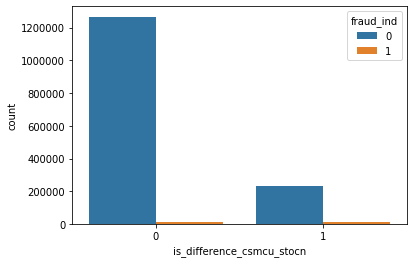

In [81]:
sns.countplot(x='is_difference_csmcu_stocn',hue='fraud_ind',data=train_data)

# 同一張卡同一天交易次數 (使用中)

In [82]:
sctn = train_data.groupby(by=['cano','locdt'])['txkey'].count().rename('same_cano_same_locdt_transaction_number').reset_index()
train_data = train_data.merge(sctn,on=['cano','locdt'],how='left')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
        68, 69, 70, 71, 72, 73]), <a list of 74 Text xticklabel objects>)

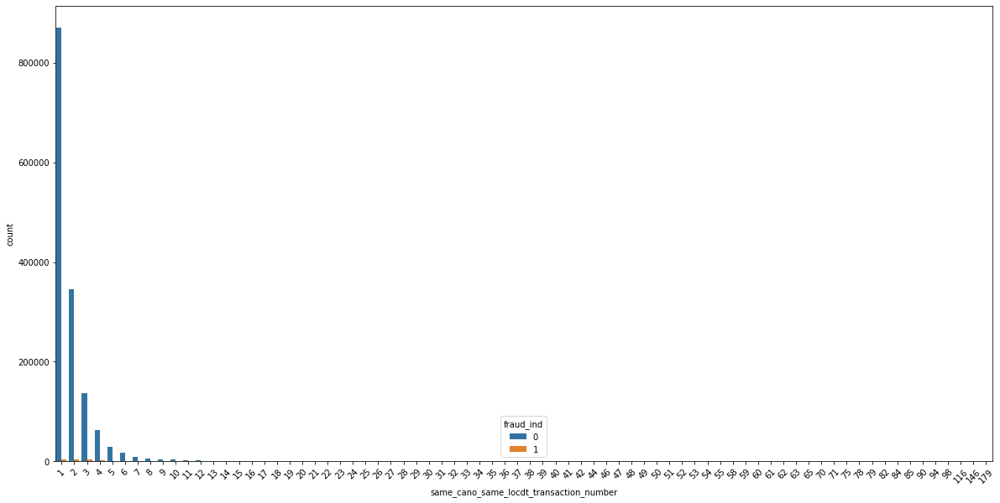

In [83]:
plt.figure(figsize=(20,10))
sns.countplot(x='same_cano_same_locdt_transaction_number',hue='fraud_ind',data=train_data)
plt.xticks(rotation=45)

# 同一張卡同一天的平均交易頻率(使用中)

In [16]:
train_data.index = train_data['loctm'].progress_apply(impute_time_zero) + train_data['locdt'].apply(lambda x : datetime.timedelta(days=x))

In [20]:
a = train_data.loc[train_data['cano']==0]
a = a.sort_index()

In [33]:
a['conam'].rolling('7d').sum()

1900-01-02 15:19:48     236.43
1900-01-05 15:44:07     556.15
1900-01-21 14:53:42    1016.34
1900-01-30 15:22:43     272.12
1900-02-07 14:37:10     283.91
1900-02-10 15:20:17     902.90
1900-02-13 14:00:23    1153.09
1900-03-17 13:38:15     428.26
1900-03-31 15:18:16     555.43
Name: conam, dtype: float64

In [171]:
tf = train_data.groupby(by=['cano','locdt'])['loctm'].progress_apply(cal_same_day_transaction_frequency).rename('transaction_frequency').reset_index()

In [172]:
train_data = train_data.merge(tf,on=['cano','locdt'],how='left')
tf_fraud_number_count = train_data.groupby(by='transaction_frequency')['fraud_ind'].sum()

In [173]:
tf_fraud_number_count_cumsum = np.cumsum(tf_fraud_number_count[1:])

In [174]:
final_tf_fraud_number_count = tf_fraud_number_count_cumsum.iloc[-1]
tfncc = tf_fraud_number_count_cumsum.rename('tf_fraud_number_count_cumsum').reset_index()
tfncc['tf_fraud_number_count_cumsum_ratio'] = tfncc['tf_fraud_number_count_cumsum'] / final_tf_fraud_number_count

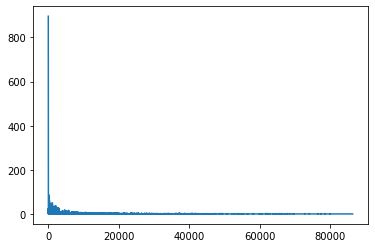

In [175]:
#去除交易頻率 -1 之後 可以發現交易頻率越長詐欺案越少
plt.plot(tf_fraud_number_count[1:])

# 同一張卡在各時段的交易次數

In [91]:
scshtn = train_data.groupby(by=['cano','hour'])['txkey'].count().rename('same_cano_same_hour_transaction_number').reset_index()
train_data = train_data.merge(scshtn,on=['cano','hour'],how='left')

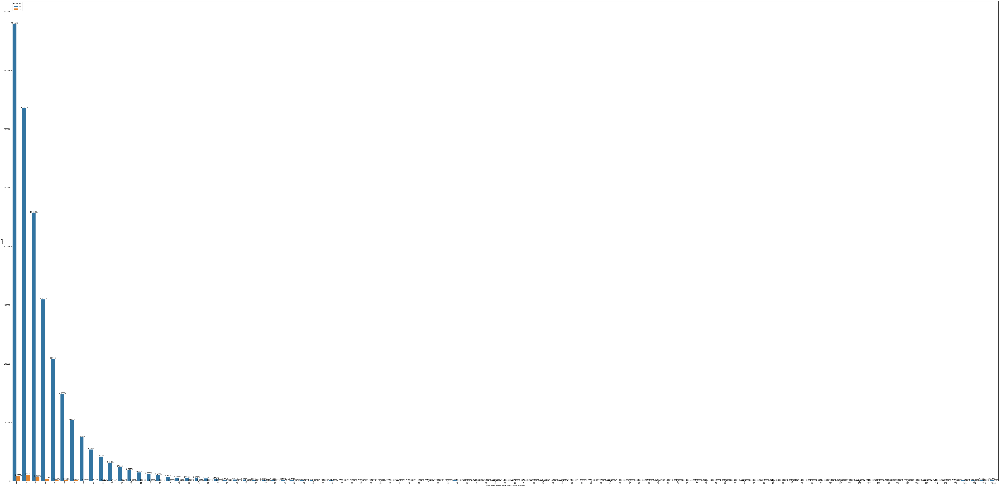

In [92]:
plt.figure(figsize=(100,50))
ax = sns.countplot(x='same_cano_same_hour_transaction_number',hue='fraud_ind',data=train_data)
ncount = len(train_data)
for p in ax.patches:
    x=p.get_bbox().get_points()[:,0]
    y=p.get_bbox().get_points()[1,1]
    if np.isnan(y) == True:
        y = 0
    ax.annotate('{:.3f}%'.format(100.*y/ncount), (x.mean(), y), 
            ha='center', va='bottom') # set the alignment of the text

# 同一張卡在同一天各時段的交易次數

In [93]:
scsdhtn = train_data.groupby(by=['cano','locdt','hour'])['txkey'].count().rename('same_cano_same_day_same_hour_transaction_number').reset_index()
train_data = train_data.merge(scsdhtn,on=['cano','locdt','hour'],how='left')

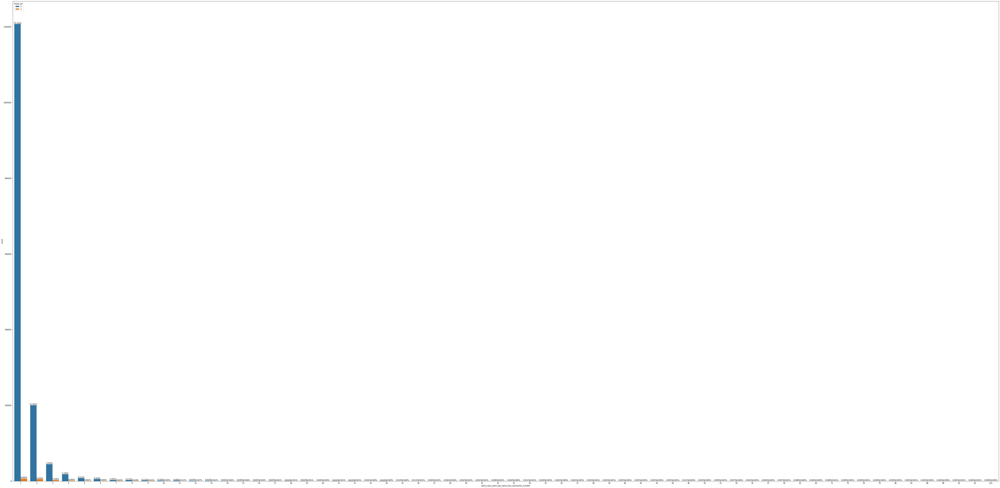

In [94]:
plt.figure(figsize=(100,50))
ax = sns.countplot(x='same_cano_same_day_same_hour_transaction_number',hue='fraud_ind',data=train_data)
ncount = len(train_data)
for p in ax.patches:
    x=p.get_bbox().get_points()[:,0]
    y=p.get_bbox().get_points()[1,1]
    if np.isnan(y) == True:
        y = 0
    ax.annotate('{:.3f}%'.format(100.*y/ncount), (x.mean(), y), 
            ha='center', va='bottom') # set the alignment of the text

# 同一張卡同一天同一小時中位數交易金額

In [95]:
scslshmc = train_data.groupby(by=['cano','locdt','hour'])['conam'].median().rename('same_cano_same_locdt_same_hour_median_conam').reset_index()
train_data = train_data.merge(scslshmc,on=['cano','locdt','hour'],how='left')

# 計算同一張卡不同天的平均交易頻率

In [32]:
def cal_difference_day_transaction_frequency(x):
    sorted_locdt = sorted(x['locdt'])
    sorted_loctm = sorted(x['loctm'])
    minus_locdt = []
    minus_loctm = []
    
    for i in range(len(sorted_locdt)):
        if i == len(x)-1:
            pass
        else:
            minus_locdt.append(sorted_locdt[i+1] - sorted_locdt[i])
            
    for i in range(len(sorted_loctm)):
        if i == len(x)-1:
            pass
        else:
            minus_loctm.append(sorted_loctm[i+1] - sorted_loctm[i])
    
    if len(minus_locdt) == 0 :
        if len(minus_loctm) == 0 :
            return -5
    
    minus_locdt = np.array(minus_locdt) * 86400
    minus_loctm = np.array(minus_loctm)
    total_second = minus_locdt + minus_loctm
    mean_frequency = np.mean(total_second)
    return mean_frequency

In [33]:
ddtf = train_data.groupby(by='cano').progress_apply(cal_difference_day_transaction_frequency).rename('difference_day_transaction_frequency').reset_index()
train_data = train_data.merge(ddtf,on='cano',how='left')

In [34]:
tf_fraud_number_count = train_data.groupby(by='difference_day_transaction_frequency')['fraud_ind'].sum()
tf_fraud_number_count_cumsum = np.cumsum(tf_fraud_number_count[1:])

final_tf_fraud_number_count = tf_fraud_number_count_cumsum.iloc[-1]
tfncc = tf_fraud_number_count_cumsum.rename('tf_fraud_number_count_cumsum').reset_index()
tfncc['tf_fraud_number_count_cumsum_ratio'] = tfncc['tf_fraud_number_count_cumsum'] / final_tf_fraud_number_count

Text(0, 0.5, 'fraud number')

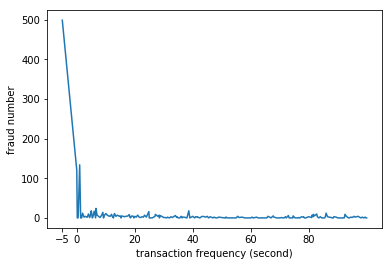

In [51]:
#去除交易頻率 -1 之後 可以發現交易頻率越長詐欺案越少
plt.plot(tf_fraud_number_count[:100])
ticks = [-5, 0, 20, 40, 60, 80]
plt.xticks(ticks)
plt.xlabel('transaction frequency (second)')
plt.ylabel('fraud number')

In [43]:
tf_fraud_number_count_cumsum = tf_fraud_number_count_cumsum.reset_index()
tf_fraud_number_count_cumsum['difference_day_transaction_frequency'] = tf_fraud_number_count_cumsum['difference_day_transaction_frequency'] / 86400
tf_fraud_number_count_cumsum['difference_day_transaction_frequency'] = tf_fraud_number_count_cumsum['difference_day_transaction_frequency'].apply(lambda x :int(x))

Text(0, 0.5, 'fraud number')

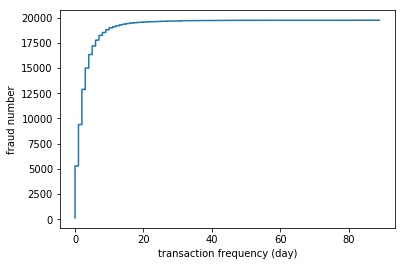

In [47]:
plt.plot(tf_fraud_number_count_cumsum['difference_day_transaction_frequency'], tf_fraud_number_count_cumsum['fraud_ind'])
plt.xlabel('transaction frequency (day)')
plt.ylabel('fraud number')

# 同一張卡同商品不同天的交易頻率

In [166]:
scd = train_data.groupby(by=['cano','mcc']).progress_apply(cal_difference_day_transaction_frequency).rename('same_cano_difference_mcc_difference_day_transaction_frequency').reset_index()
train_data = train_data.merge(scd,on=['cano','mcc'],how='left')

In [168]:
train_data['same_cano_difference_mcc_difference_day_transaction_frequency']

0          4.141646e+05
1          8.783149e+05
2          1.989100e+06
3          2.852192e+05
4          1.167506e+06
5          9.510291e+05
6          2.418604e+06
7          2.396040e+05
8          3.551884e+06
9          1.873390e+06
10         1.042896e+06
11         1.556637e+06
12         1.010065e+06
13         4.463948e+05
14         1.352942e+06
15         4.758774e+05
16        -1.000000e+00
17        -1.000000e+00
18         3.215417e+06
19         6.745213e+05
20         3.170718e+06
21         3.026258e+06
22         1.445132e+06
23         8.047545e+05
24         7.358393e+05
25         5.185322e+05
26        -1.000000e+00
27         1.666662e+06
28        -1.000000e+00
29         1.599436e+06
30         3.224140e+05
31         2.305089e+05
32         5.936529e+05
33         1.280314e+06
34         4.778530e+05
35         8.640300e+04
36         2.678451e+06
37         2.017372e+06
38         9.043787e+05
39         6.024765e+05
40        -1.000000e+00
41         5.821

# 同一張卡同一天秒數是否落在信賴區間

In [100]:
scslml = train_data.groupby(by=['cano','locdt'])['loctm'].mean().rename('same_cano_same_locdt_mean_loctm').reset_index()
train_data = train_data.merge(scslml,on=['cano','locdt'],how='left')

scslsl = train_data.groupby(by=['cano','locdt'])['loctm'].std().rename('same_cano_same_locdt_std_loctm').reset_index()
train_data = train_data.merge(scslsl,on=['cano','locdt'],how='left')
train_data['same_cano_same_locdt_std_loctm'] = train_data['same_cano_same_locdt_std_loctm'].fillna(0)

In [101]:
train_data['same_cano_same_locdt_ci_lower_bound_loctm'] = train_data['same_cano_same_locdt_mean_loctm'] - 2 * train_data['same_cano_same_locdt_std_loctm']
train_data['same_cano_same_locdt_ci_upper_bound_loctm'] = train_data['same_cano_same_locdt_mean_loctm'] + 2 * train_data['same_cano_same_locdt_std_loctm']

In [102]:
train_data.loc[(train_data['loctm']>=train_data['same_cano_same_locdt_ci_lower_bound_loctm'])&(train_data['loctm']<=train_data['same_cano_same_locdt_ci_upper_bound_loctm']),'is_ci_loctm'] = 1
train_data['is_ci_loctm'] = train_data['is_ci_loctm'].fillna(0)

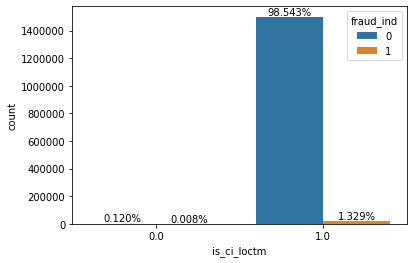

In [103]:
ax = sns.countplot(x='is_ci_loctm',hue='fraud_ind',data=train_data)
ncount = len(train_data)
for p in ax.patches:
    x=p.get_bbox().get_points()[:,0]
    y=p.get_bbox().get_points()[1,1]
    if np.isnan(y) == True:
        y = 0
    ax.annotate('{:.3f}%'.format(100.*y/ncount), (x.mean(), y), 
            ha='center', va='bottom') # set the alignment of the text

# 同一張卡同金額同商品交易次數

In [140]:
scsmdctn = train_data.groupby(by=['cano','mcc','conam'])['txkey'].count().rename('same_cano_same_mcc_different_conam_transaction_number').reset_index()
train_data = train_data.merge(scsmdctn,on=['cano','mcc','conam'],how='left')

# 同一張卡同一天平均交易金額

In [ ]:
train_data['same_cano_same_locdt_mean_conam'] = train_data['same_cano_same_locdt_sum_conam'] / train_data['same_cano_same_locdt_transaction_number']

# 同一張卡同金額同時間交易次數

In [104]:
scscsltn = train_data.groupby(by=['cano','conam','locdt'])['txkey'].count().rename('same_cano_same_conam_same_locdt_transaction_number').reset_index()
train_data = train_data.merge(scscsltn,on=['cano','conam','locdt'],how='left')

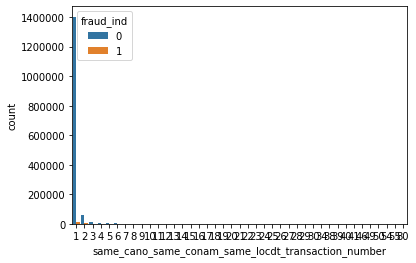

In [105]:
sns.countplot(x='same_cano_same_conam_same_locdt_transaction_number',hue='fraud_ind',data=train_data)

In [106]:
scscslt_1 = train_data.loc[train_data['same_cano_same_conam_same_locdt_transaction_number']>12]

# 同一張卡在同一天消費使用的貨幣有幾種

In [107]:
scslcn = train_data.groupby(by=['cano','locdt'])['csmcu'].unique().rename('same_cano_same_locdt_csmcu_number').reset_index()
scslcn['same_cano_same_locdt_csmcu_number'] = scslcn['same_cano_same_locdt_csmcu_number'].apply(lambda x : len(x))

In [108]:
train_data = train_data.merge(scslcn,on=['cano','locdt'],how='left')

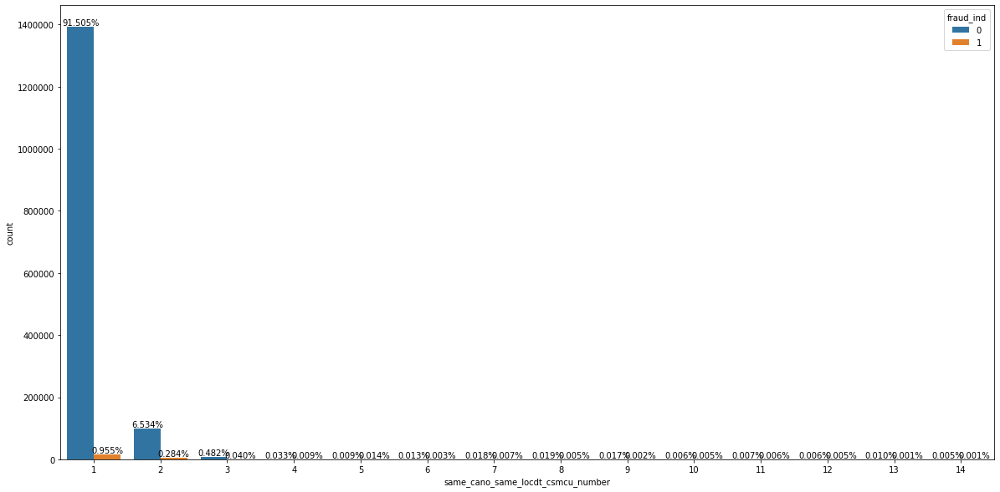

In [109]:
plt.figure(figsize=(20,10))
ax = sns.countplot(x='same_cano_same_locdt_csmcu_number',hue='fraud_ind',data=train_data)

ncount = len(train_data)
for p in ax.patches:
    x=p.get_bbox().get_points()[:,0]
    y=p.get_bbox().get_points()[1,1]
    if np.isnan(y) == True:
        y = 0
    ax.annotate('{:.3f}%'.format(100.*y/ncount), (x.mean(), y), 
            ha='center', va='bottom') # set the alignment of the text

# 同一張卡同商品在同一天消費使用的貨幣有幾種

In [94]:
scslsmcn = train_data.groupby(by=['cano','mcc','locdt'])['csmcu'].unique().rename('same_cano_same_locdt_same_mcc_csmcu_number').reset_index()
scslsmcn['same_cano_same_locdt_same_mcc_csmcu_number'] = scslsmcn['same_cano_same_locdt_same_mcc_csmcu_number'].apply(lambda x : len(x))
train_data = train_data.merge(scslsmcn,on=['cano','mcc','locdt'],how='left')

KeyboardInterrupt: 

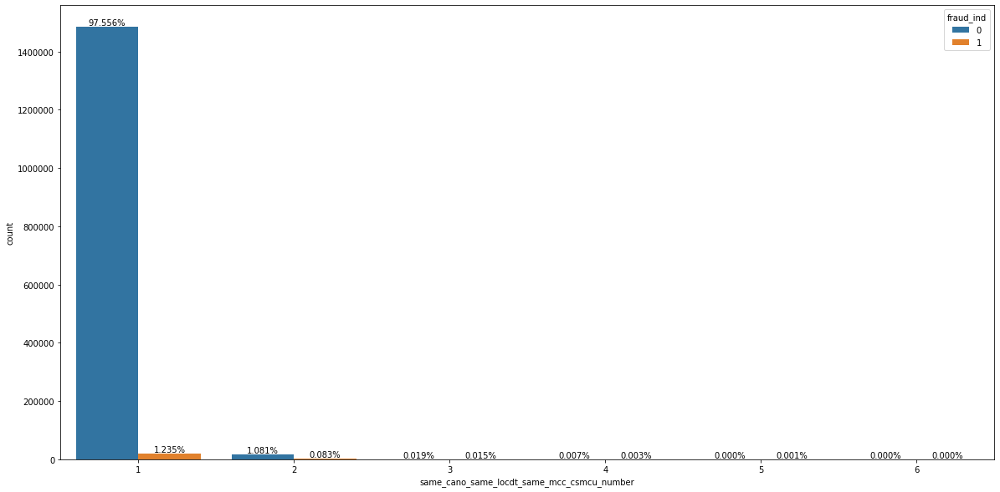

In [91]:
plt.figure(figsize=(20,10))
ax = sns.countplot(x='same_cano_same_locdt_same_mcc_csmcu_number',hue='fraud_ind',data=train_data)

ncount = len(train_data)
for p in ax.patches:
    x=p.get_bbox().get_points()[:,0]
    y=p.get_bbox().get_points()[1,1]
    if np.isnan(y) == True:
        y = 0
    ax.annotate('{:.3f}%'.format(100.*y/ncount), (x.mean(), y), 
            ha='center', va='bottom') # set the alignment of the text

# 同一卡號購買該商品的比率

In [55]:
sbmstn = train_data.groupby(by=['cano','mcc'])['txkey'].count().rename('same_bacno_mcc_separate_trade_number').reset_index()
train_data = train_data.merge(sbmstn,on=['cano','mcc'],how='left')

In [56]:
sctn = train_data.groupby(by=['cano'])['txkey'].count().rename('same_cano_transaction_number').reset_index()
train_data = train_data.merge(sctn,on=['cano'],how='left')

In [57]:
train_data['same_bacno_mcc_trade_ratio'] = train_data['same_bacno_mcc_separate_trade_number'] / train_data['same_cano_transaction_number']

In [68]:
a = train_data.groupby(by='same_bacno_mcc_separate_trade_number')['fraud_ind'].sum()
a = a.reset_index()
a = a.rename(columns = {'same_bacno_mcc_separate_trade_number': "same_card_buy_mcc_number", "fraud_ind": "fraud number"})

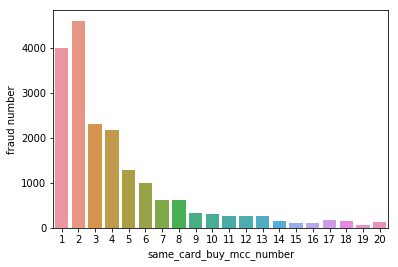

In [70]:
sns.barplot(x="same_card_buy_mcc_number", y="fraud number", data=a[:20])

# 同一張卡距離上一筆交易的時間差

In [4]:
sorted_train_data = train_data.sort_values(by=['cano','locdt','loctm'])

first_train_data = train_data.sort_values(by=['locdt','loctm']).groupby(by='cano').first().reset_index()
first_train_data['is_first'] = 1

sorted_train_data['shift_locdt'] = sorted_train_data['locdt'].shift(1).fillna(0)

sorted_train_data['shift_loctm'] = sorted_train_data['loctm'].shift(1).fillna(0)

sorted_train_data['difference_locdt'] = sorted_train_data['locdt'] - sorted_train_data['shift_locdt']
sorted_train_data['difference_loctm'] = sorted_train_data['loctm'] - sorted_train_data['shift_loctm']
sorted_train_data['same_cano_total_difference_second'] = 86400 * sorted_train_data['difference_locdt'] + sorted_train_data['difference_loctm']

sorted_train_data = sorted_train_data.merge(first_train_data[['txkey','is_first']],on='txkey',how='left')
sorted_train_data['is_first'] = sorted_train_data['is_first'].fillna(0)

sorted_train_data.loc[sorted_train_data['is_first']==1,'same_cano_total_difference_second'] = -1
train_data = train_data.merge(sorted_train_data[['txkey','same_cano_total_difference_second']],on='txkey',how='left')

In [7]:
sorted_train_data.groupby(by='is_first')['fraud_ind'].value_counts()

is_first  fraud_ind
0.0       0            1373281
          1              19093
1.0       0             128151
          1               1262
Name: fraud_ind, dtype: int64

# 同一張卡同一金額是否落在信賴區間

In [115]:
scslml = train_data.groupby(by=['cano'])['conam'].mean().rename('same_cano_mean_conam').reset_index()
train_data = train_data.merge(scslml,on=['cano'],how='left')

scslsl = train_data.groupby(by=['cano'])['conam'].std().rename('same_cano_std_conam').reset_index()
train_data = train_data.merge(scslsl,on=['cano'],how='left')
train_data['same_cano_std_conam'] = train_data['same_cano_std_conam'].fillna(0)

train_data['same_cano_ci_lower_bound_conam'] = train_data['same_cano_mean_conam'] - 2 * train_data['same_cano_std_conam']
train_data['same_cano_ci_upper_bound_conam'] = train_data['same_cano_mean_conam'] + 2 * train_data['same_cano_std_conam']

train_data.loc[(train_data['conam']>=train_data['same_cano_ci_lower_bound_conam'])&(train_data['conam']<=train_data['same_cano_ci_upper_bound_conam']),'is_ci_conam'] = 1
train_data['is_ci_conam'] = train_data['is_ci_conam'].fillna(0)

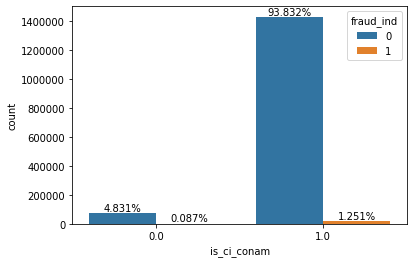

In [116]:
ax = sns.countplot(x='is_ci_conam',hue='fraud_ind',data=train_data)
ncount = len(train_data)
for p in ax.patches:
    x=p.get_bbox().get_points()[:,0]
    y=p.get_bbox().get_points()[1,1]
    if np.isnan(y) == True:
        y = 0
    ax.annotate('{:.3f}%'.format(100.*y/ncount), (x.mean(), y), 
            ha='center', va='bottom') # set the alignment of the text

# 同一張卡在同一天平均交易金額

In [121]:
scslsmmc = train_data.groupby(by=['cano','locdt','mcc'])['conam'].mean().rename('same_cano_same_locdt_same_mcc_mean_conam').reset_index()
train_data = train_data.merge(scslsmmc,on=['cano','locdt','mcc'],how='left')

# 同一張卡購買該商品的數量

In [122]:
scpmn = train_data.groupby(by=['cano','mcc'])['txkey'].count().rename('same_cano_purchase_mcc_number').reset_index()
train_data = train_data.merge(scpmn,on=['cano','mcc'],how='left')

In [124]:
train_data['same_card_purchase_mcc_ratio'] = train_data['same_cano_purchase_mcc_number'] / train_data['same_bacno_different_cano_trade_number']

# 同一張卡在該國家購買該商品的數量

In [125]:
scssmtn = train_data.groupby(by=['cano','stocn','mcc'])['txkey'].count().rename('same_cano_same_stocn_mcc_transaction_number').reset_index()
train_data = train_data.merge(scssmtn,on=['cano','stocn','mcc'],how='left')

# 同一張卡買同一個商品時是否高於平均價格

In [126]:
scsmmc = train_data.groupby(by=['cano','mcc'])['conam'].mean().rename('same_cano_same_mcc_mean_conam').reset_index()
train_data = train_data.merge(scsmmc,on=['cano','mcc'],how='left')

In [127]:
train_data.loc[train_data['conam']>train_data['same_cano_same_mcc_mean_conam'],'is_higher_mean_conam'] = 1
train_data['is_higher_mean_conam'] = train_data['is_higher_mean_conam'].fillna(0)

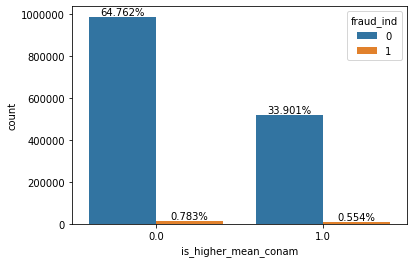

In [128]:
ax = sns.countplot(x='is_higher_mean_conam',hue='fraud_ind',data=train_data)
ncount = len(train_data)
for p in ax.patches:
    x=p.get_bbox().get_points()[:,0]
    y=p.get_bbox().get_points()[1,1]
    if np.isnan(y) == True:
        y = 0
    ax.annotate('{:.3f}%'.format(100.*y/ncount), (x.mean(), y), 
            ha='center', va='bottom') # set the alignment of the text

# 同一卡號用不同支付型態的次數

In [129]:
train_data.groupby(by=['cano','hcefg','ecfg'])['txkey'].count().rename('same_cano_different_hcefg_transaction_number').reset_index()

,cano,hcefg,ecfg,same_cano_different_hcefg_transaction_number
0,0,5,N,9
1,1,5,N,3
2,2,5,N,31
3,2,5,Y,3
4,3,5,N,3
5,4,5,N,1
6,5,0,N,5
7,5,5,N,18
8,5,5,Y,2
9,7,5,N,24


# 同一張卡同金額同一天是否連續交易

In [140]:
scsdstn = train_data.groupby(by=['cano','conam','locdt'])['txkey'].count().rename('same_cano_same_day_sequential_transaction_number').reset_index()
train_data = train_data.merge(scsdstn,on=['cano','conam','locdt'],how='left')

In [141]:
train_data.loc[train_data['same_cano_same_day_sequential_transaction_number']>1,'is_sequential_trade'] = 1
train_data['is_sequential_trade'] = train_data['is_sequential_trade'].fillna(0)

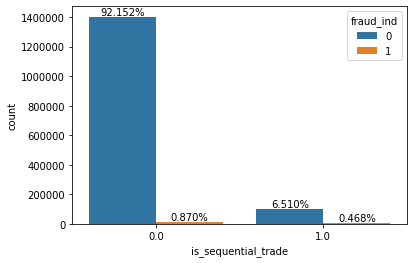

In [142]:
ax = sns.countplot(x='is_sequential_trade',hue='fraud_ind',data=train_data)
ncount = len(train_data)
for p in ax.patches:
    x=p.get_bbox().get_points()[:,0]
    y=p.get_bbox().get_points()[1,1]
    if np.isnan(y) == True:
        y = 0
    ax.annotate('{:.3f}%'.format(100.*y/ncount), (x.mean(), y), 
            ha='center', va='bottom') # set the alignment of the text

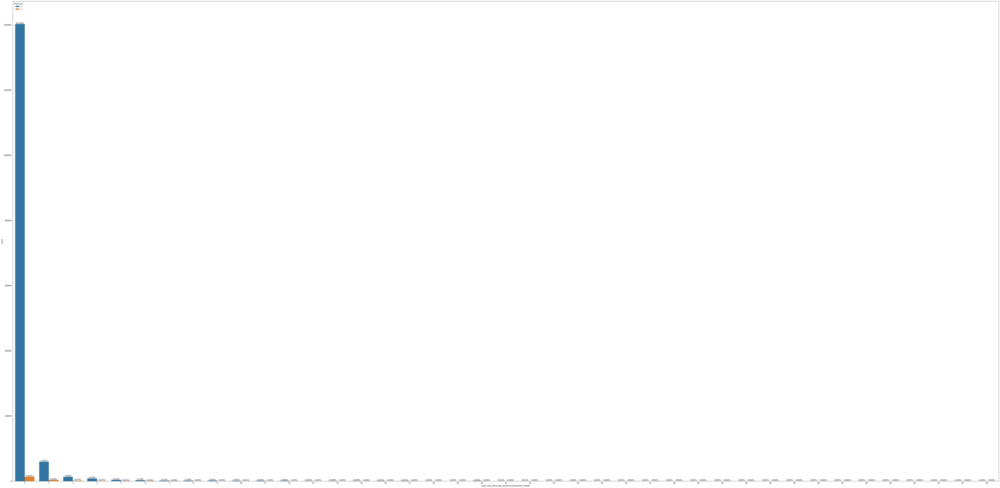

In [143]:
plt.figure(figsize=(100,50))
ax = sns.countplot(x='same_cano_same_day_sequential_transaction_number',hue='fraud_ind',data=train_data)
ncount = len(train_data)
for p in ax.patches:
    x=p.get_bbox().get_points()[:,0]
    y=p.get_bbox().get_points()[1,1]
    if np.isnan(y) == True:
        y = 0
    ax.annotate('{:.3f}%'.format(100.*y/ncount), (x.mean(), y), 
            ha='center', va='bottom') # set the alignment of the text

# 同一張卡同金額同一天是否高頻連續交易

In [139]:
a = train_data.loc[(train_data['is_sequential_trade']==1)&(train_data['total_difference_second']!=-1)]
a.groupby('fraud_ind')['total_difference_second'].median()

KeyError: 'is_sequential_trade'

In [138]:
train_data.loc[(train_data['is_sequential_trade']==1)&(train_data['total_difference_second']<=49),'is_high_frequency_sequential_trade'] = 1
train_data['is_high_frequency_sequential_trade'] = train_data['is_high_frequency_sequential_trade'].fillna(0)

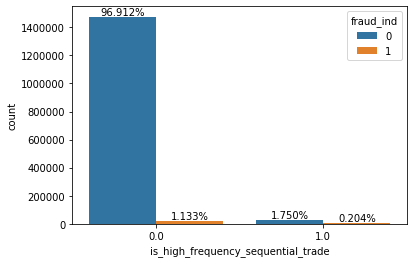

In [136]:
ax = sns.countplot(x='is_high_frequency_sequential_trade',hue='fraud_ind',data=train_data)
ncount = len(train_data)
for p in ax.patches:
    x=p.get_bbox().get_points()[:,0]
    y=p.get_bbox().get_points()[1,1]
    if np.isnan(y) == True:
        y = 0
    ax.annotate('{:.3f}%'.format(100.*y/ncount), (x.mean(), y), 
            ha='center', va='bottom') # set the alignment of the text

# 同一張卡同一天同一小時是否連續交易

In [139]:
scsdstn = train_data.groupby(by=['cano','locdt','hour'])['txkey'].count().rename('same_cano_same_day_same_hour_sequential_transaction_number').reset_index()
train_data = train_data.merge(scsdstn,on=['cano','locdt','hour'],how='left')

In [140]:
train_data.loc[train_data['same_cano_same_day_same_hour_sequential_transaction_number']>1,'is_same_hour_sequential_trade'] = 1
train_data['is_same_hour_sequential_trade'] = train_data['is_same_hour_sequential_trade'].fillna(0)

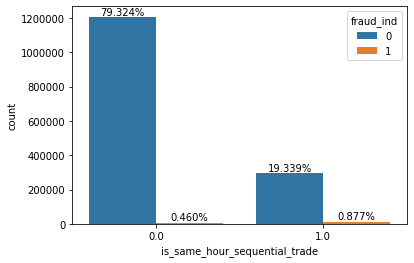

In [141]:
ax = sns.countplot(x='is_same_hour_sequential_trade',hue='fraud_ind',data=train_data)
ncount = len(train_data)
for p in ax.patches:
    x=p.get_bbox().get_points()[:,0]
    y=p.get_bbox().get_points()[1,1]
    if np.isnan(y) == True:
        y = 0
    ax.annotate('{:.3f}%'.format(100.*y/ncount), (x.mean(), y), 
            ha='center', va='bottom') # set the alignment of the text

# 同一張卡每個國家的交易次數(效果不好)

In [142]:
scstn = train_data.groupby(by=['cano','stocn'])['txkey'].count().rename('same_cano_stocn_transaction_number').reset_index()
train_data = train_data.merge(scstn,on=['cano','stocn'],how='left')

# 同一張卡每個國家的交易比率(效果不好)

In [ ]:
# 同一張卡同一個國家交易比率
train_data['same_cano_stocn_transaction_ratio'] = train_data['same_cano_stocn_transaction_number'] / train_data['same_cano_transaction_number']

# 同一張卡同一個國家不同城市的交易次數

In [144]:
scssdstn = train_data.groupby(by=['cano','stocn','scity'])['txkey'].count().rename('same_cano_same_stocn_different_scity_transaction_number').reset_index()
train_data = train_data.merge(scssdstn,on=['cano','stocn','scity'],how='left')

# 同一張卡同一件商品總共用幾次同一種貨幣

In [145]:
scsmctn = train_data.groupby(by=['cano','mcc','csmcu'])['txkey'].count().rename('same_cano_same_mcc_csmcu_transaction_number').reset_index()
train_data = train_data.merge(scsmctn,on=['cano','mcc','csmcu'],how='left')

# 同一張卡不同狀態碼交易次數

In [146]:
scdstn = train_data.groupby(by=['cano','stscd'])['txkey'].count().rename('same_cano_different_stscd_transaction_number').reset_index()
train_data = train_data.merge(scdstn,on=['cano','stscd'],how='left')

# 同一張卡網路交易的數量

In [147]:
scdetn = train_data.groupby(by=['cano','ecfg'])['txkey'].count().rename('same_cano_different_ecfg_transaction_number').reset_index()
train_data = train_data.merge(scdetn,on=['cano','ecfg'],how='left')


# 同一張卡在同一天同一小時透過網路交易的數量

In [196]:
ecfg_train_data = train_data.loc[train_data['ecfg']=='Y']
scsltn = ecfg_train_data.groupby(by=['cano','locdt','ecfg'])['txkey'].count().rename('same_cano_same_locdt_through_network_transaction_number').reset_index()
train_data = train_data.merge(scsltn,on=['cano','locdt','ecfg'],how='left')
train_data['same_cano_same_locdt_through_network_transaction_number'] = train_data['same_cano_same_locdt_through_network_transaction_number'].fillna(0)

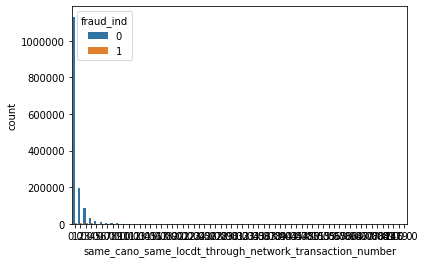

In [198]:
sns.countplot(x='same_cano_same_locdt_through_network_transaction_number',hue='fraud_ind',data=train_data)

# 同一張卡同金額同商品不同狀態碼交易數量

In [148]:
scscsmdst = train_data.groupby(by=['cano','conam','mcc'])['stscd'].count().rename('same_cano_same_conam_same_mcc_different_stscd_transaction_number').reset_index()
train_data = train_data.merge(scscsmdst,on=['cano','conam','mcc'],how='left')

# 同一張卡同商品交易金額最大值

In [210]:
scmc = train_data.groupby(by=['cano','mcc'])['conam'].max().rename('same_cano_same_mcc_max_conam').reset_index()
train_data = train_data.merge(scmc,on=['cano','mcc'],how='left')

# 同一張同一個禮拜幾不同商品的交易次數

In [214]:
scsdmtn = train_data.groupby(by=['cano','days','mcc'])['txkey'].count().rename('same_cano_same_days_mcc_transaction_number').reset_index()
train_data = train_data.merge(scsdmtn,on=['cano','days','mcc'],how='left')

# 同一張卡同一天同一件商品不同狀態碼交易次數

In [ ]:
scslsmdstn = train_data.groupby(by=['cano','locdt','mcc','stscd'])['txkey'].count().rename('same_cano_same_locdt_same_mcc_different_stscd_transaction_number').reset_index()
train_data = train_data.merge(scslsmdstn,on=['cano','locdt','mcc','stscd'],how='left')

# 同一張卡同一個商品不同小時交易數量

In [ ]:
scsmdhtn = train_data.groupby(by=['cano','mcc','hour'])['txkey'].count().rename('same_cano_same_mcc_different_hour_transaction_number').reset_index()
train_data = train_data.merge(scsmdhtn,on=['cano','mcc','hour'],how='left')

# 同一張卡同一天交易同商品使用商店數

In [4]:
scslsmdmn = train_data.groupby(['cano','locdt','mcc'])['mchno'].unique().rename('same_cano_same_locdt_same_mcc_different_mchno_number').reset_index()
scslsmdmn['same_cano_same_locdt_same_mcc_different_mchno_number'] = scslsmdmn['same_cano_same_locdt_same_mcc_different_mchno_number'].apply(lambda x : len(x))
train_data = train_data.merge(scslsmdmn,on=['cano','locdt','mcc'],how='left')

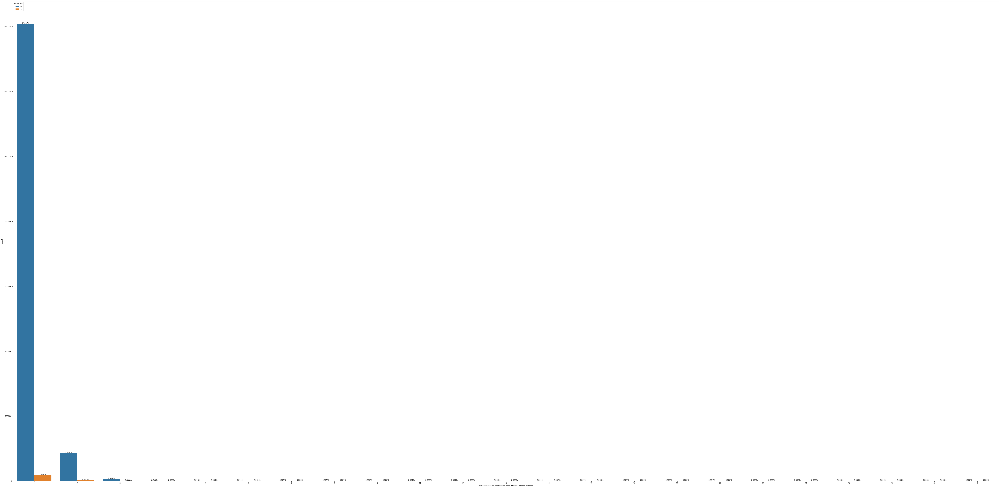

In [5]:
plt.figure(figsize=(100,50))
ax = sns.countplot(x='same_cano_same_locdt_same_mcc_different_mchno_number',hue='fraud_ind',data=train_data)
ncount = len(train_data)
for p in ax.patches:
    x=p.get_bbox().get_points()[:,0]
    y=p.get_bbox().get_points()[1,1]
    if np.isnan(y) == True:
        y = 0
    ax.annotate('{:.3f}%'.format(100.*y/ncount), (x.mean(), y), 
            ha='center', va='bottom') # set the alignment of the text

In [8]:
train_data.loc[(train_data['same_cano_same_locdt_same_mcc_different_mchno_number']==1)&(train_data['fraud_ind']==1)].sort_values(by='cano')

,acqic,bacno,cano,conam,contp,csmcu,ecfg,etymd,flbmk,flg_3dsmk,fraud_ind,hcefg,insfg,iterm,locdt,loctm,mcc,mchno,ovrlt,scity,stocn,stscd,txkey,same_cano_same_locdt_same_mcc_different_mchno_number
1378477,5876,41871,23,0.00,5,4,Y,8,N,N,1,5,N,0,50,62252.0,192,68362,N,376,6,2,722477,1
521926,5876,41871,23,85.64,5,4,Y,8,N,N,1,5,N,0,50,62253.0,192,68362,N,376,6,2,722478,1
646271,5993,25286,34,668.27,5,62,N,2,N,N,1,5,N,0,83,131110.0,311,9215,N,1803,75,0,1919766,1
297765,5720,160485,102,2077.32,5,20,Y,8,N,N,1,5,N,0,69,11914.0,349,67619,N,1803,75,2,753439,1
366488,5720,160485,102,2077.32,5,20,Y,8,N,N,1,5,N,0,69,11914.0,203,67656,N,1803,75,2,753440,1
214322,3348,43024,132,1202.35,5,62,Y,8,N,N,1,5,N,0,58,409.0,380,54238,N,6580,38,0,734951,1
426754,3348,43024,132,1018.62,5,62,Y,8,N,N,1,5,N,0,58,1130.0,380,54238,N,6580,38,0,734958,1
555320,3348,43024,133,1016.34,5,62,Y,8,N,N,1,5,N,0,61,203423.0,380,54238,N,6580,38,0,741230,1
237650,3348,50276,149,794.93,5,62,Y,8,N,N,1,5,N,0,63,4640.0,289,54828,N,3460,46,0,743694,1
589140,6881,123152,168,513.80,5,0,N,0,N,N,1,5,N,0,78,32253.0,457,59333,N,0,102,0,566508,1


# 同一張卡同一商品不同全球商店交易次數

In [18]:
scsmdgtn = train_data.groupby(by=['cano','mcc','global_mchno'])['txkey'].count().rename('same_cano_same_mcc_different_gm_transaction_number').reset_index()
train_data = train_data.merge(scsmdgtn,on=['cano','mcc','global_mchno'],how='left')

# 同一張卡同一個月交易次數

In [10]:
train_data.loc[train_data['locdt']<=30,'month'] = 1
train_data.loc[(train_data['locdt']>30)&(train_data['locdt']<=60),'month'] = 2
train_data.loc[(train_data['locdt']>60)&(train_data['locdt']<=90),'month'] = 3

In [11]:
sbsmtn = train_data.groupby(by=['cano','month'])['txkey'].count().rename('same_cano_same_month_transaction_number').reset_index()
train_data = train_data.merge(sbsmtn,on=['cano','month'],how='left')

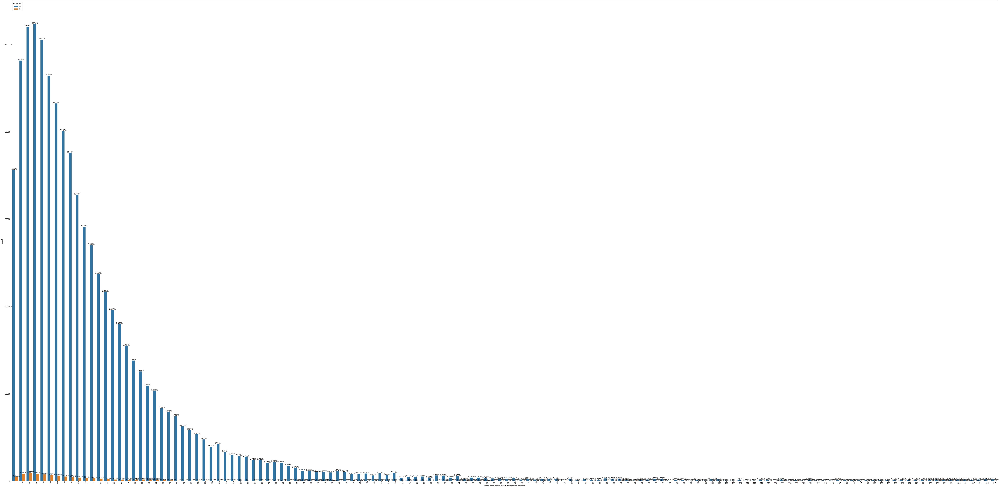

In [13]:
plt.figure(figsize=(100,50))
ax = sns.countplot(x='same_cano_same_month_transaction_number',hue='fraud_ind',data=train_data)

ncount = len(train_data)
for p in ax.patches:
    x=p.get_bbox().get_points()[:,0]
    y=p.get_bbox().get_points()[1,1]
    if np.isnan(y) == True:
        y = 0
    ax.annotate('{:.3f}%'.format(100.*y/ncount), (x.mean(), y), 
            ha='center', va='bottom') # set the alignment of the text

# 同一張卡同一天交易總額

In [ ]:
scslsc = train_data.groupby(by=['cano','locdt'])['conam'].sum().rename('same_cano_same_locdt_sum_conam').reset_index()
train_data = train_data.merge(scslsc,on=['cano','locdt'],how='left')

# 同一張卡同一個商品不同交易型態金額中位數 

In [ ]:
scsmdemc = train_data.groupby(by=['cano','mcc','etymd'])['conam'].median().rename('same_cano_same_mcc_different_etymd_median_conam').reset_index()
train_data = train_data.merge(scsmdemc,on=['cano','mcc','etymd'],how='left')

# 同一張卡同一天同商品同一金額交易比例

In [ ]:
# 同一張卡同一天同商品同一金額交易次數
scslsmctn = train_data.groupby(by=['cano','locdt','mcc','conam'])['txkey'].count().rename('same_cano_same_locdt_same_mcc_conam_transaction_number').reset_index()
train_data = train_data.merge(scslsmctn,on=['cano','locdt','mcc','conam'],how='left')
#同一張卡同一天同商品交易次數
scslsmtn = train_data.groupby(by=['cano','locdt','mcc'])['txkey'].count().rename('same_cano_same_locdt_same_mcc_transaction_number').reset_index()
train_data = train_data.merge(scslsmtn,on=['cano','locdt','mcc'],how='left')
#同一張卡同一天同商品同一金額交易比例
train_data['same_cano_same_locdt_same_mcc_conam_transaction_ratio'] = train_data['same_cano_same_locdt_same_mcc_conam_transaction_number'] / train_data['same_cano_same_locdt_same_mcc_transaction_number']
train_data['same_cano_same_locdt_same_mcc_conam_transaction_ratio'] = round(train_data['same_cano_same_locdt_same_mcc_conam_transaction_ratio'],2)

# 同一張卡同一個月交易數量

In [ ]:
scsmtn = train_data.groupby(by=['cano','month'])['txkey'].count().rename('same_cano_same_month_transaction_number').reset_index()
train_data = train_data.merge(scsmtn,on=['cano','month'],how='left')

In [149]:
scmmp = train_data.groupby(by='cano')['conam'].mean().rename('same_cano_mcc_mean_price').reset_index()
train_data = train_data.merge(scmmp,on='cano',how='left')

In [150]:
train_data.loc[train_data['conam']>train_data['same_cano_mcc_mean_price'],'is_high_same_cano_mcc_mean_price'] = 1
train_data.loc[(train_data['conam']<=train_data['same_cano_mcc_mean_price']),'is_high_same_cano_mcc_mean_price'] = 0

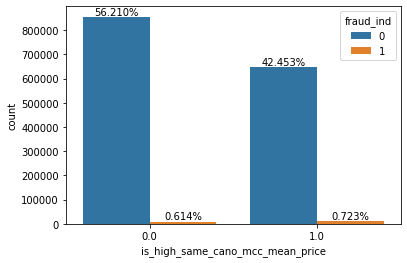

In [151]:
ax = sns.countplot(x='is_high_same_cano_mcc_mean_price',hue='fraud_ind',data=train_data)

ncount = len(train_data)
for p in ax.patches:
    x=p.get_bbox().get_points()[:,0]
    y=p.get_bbox().get_points()[1,1]
    if np.isnan(y) == True:
        y = 0
    ax.annotate('{:.3f}%'.format(100.*y/ncount), (x.mean(), y), 
            ha='center', va='bottom') # set the alignment of the text

# 是否高於用同一張卡購買同商品的平均值

In [152]:
scsmmmp = train_data.groupby(by=['cano','mchno'])['conam'].mean().rename('same_cano_same_mchno_mcc_mean_price').reset_index()
train_data = train_data.merge(scsmmmp,on=['cano','mchno'],how='left')

train_data.loc[train_data['conam']>train_data['same_cano_same_mchno_mcc_mean_price'],'is_high_same_cano_same_mcc_mean_price'] = 1
train_data.loc[(train_data['conam']<=train_data['same_cano_same_mchno_mcc_mean_price']),'is_high_same_cano_same_mcc_mean_price'] = 0

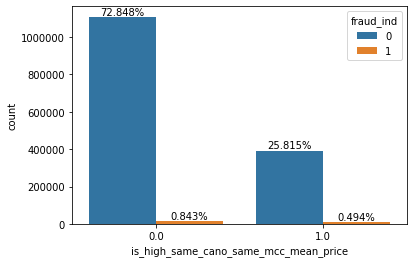

In [153]:
ax = sns.countplot(x='is_high_same_cano_same_mcc_mean_price',hue='fraud_ind',data=train_data)

ncount = len(train_data)
for p in ax.patches:
    x=p.get_bbox().get_points()[:,0]
    y=p.get_bbox().get_points()[1,1]
    if np.isnan(y) == True:
        y = 0
    ax.annotate('{:.3f}%'.format(100.*y/ncount), (x.mean(), y), 
            ha='center', va='bottom') # set the alignment of the text

# 同一收單行同一商店發生不同狀態碼的次數

In [ ]:
sasmdstn = train_data.groupby(by=['acqic','mchno','stscd'])['txkey'].count().rename('same_acqic_same_mchno_different_stscd_transaction_number').reset_index()
train_data = train_data.merge(sasmdstn,on=['acqic','mchno','stscd'],how='left')


# 同一收單行有幾個商店

In [ ]:
samn = train_data.groupby(by=['acqic'])['mchno'].unique().rename('same_acqic_mchno_number').reset_index()
samn['same_acqic_mchno_number'] = samn['same_acqic_mchno_number'].apply(lambda x : len(x))
train_data = train_data.merge(samn,on=['acqic'],how='left')

# 同一個發卡行同一家商店發生不同狀態碼的比例

In [ ]:
sasmdstn = train_data.groupby(by=['acqic','mchno','stscd'])['txkey'].count().rename('same_acqic_same_mchno_different_stscd_transaction_number').reset_index()
train_data = train_data.merge(sasmdstn,on=['acqic','mchno','stscd'],how='left')

sasmtn = train_data.groupby(by=['acqic','mchno'])['txkey'].count().rename('same_acqic_same_mchno_transaction_number').reset_index()
train_data = train_data.merge(sasmtn,on=['acqic','mchno'],how='left')
train_data['same_acqic_same_mchno_different_stscd_transaction_ratio'] = train_data['same_acqic_same_mchno_different_stscd_transaction_number']

# 是否高於通常購買該商品的中位數

In [4]:
mmp = train_data.groupby(by='mcc')['conam'].median().rename('mcc_median_price').reset_index()
train_data = train_data.merge(mmp,on='mcc',how='left')

In [6]:
train_data.loc[train_data['conam']>train_data['mcc_median_price'],'is_high_mcc_median_price'] = 1
train_data.loc[(train_data['conam']<=train_data['mcc_median_price']),'is_high_mcc_median_price'] = 0

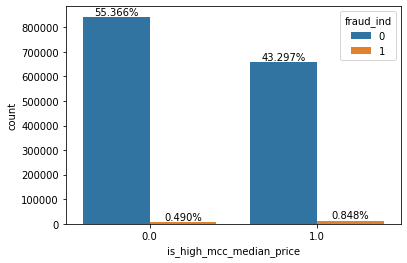

In [7]:
ax = sns.countplot(x='is_high_mcc_median_price',hue='fraud_ind',data=train_data)

ncount = len(train_data)
for p in ax.patches:
    x=p.get_bbox().get_points()[:,0]
    y=p.get_bbox().get_points()[1,1]
    if np.isnan(y) == True:
        y = 0
    ax.annotate('{:.3f}%'.format(100.*y/ncount), (x.mean(), y), 
            ha='center', va='bottom') # set the alignment of the text

# 同一商品透過網路交易的比例

# 同一商品透過網路交易的數量

In [158]:
ecfg_train_data = train_data.loc[train_data['ecfg']=='Y']
mtntn = ecfg_train_data.groupby(by=['mcc','ecfg'])['txkey'].count().rename('mcc_through_network_transaction_number').reset_index()

train_data = train_data.merge(mtntn,on=['mcc','ecfg'],how='left')

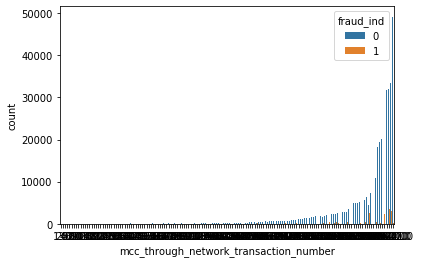

In [159]:
sns.countplot(x='mcc_through_network_transaction_number',hue='fraud_ind',data=train_data)

In [160]:
smtn = train_data.groupby(by=['mcc','ecfg'])['txkey'].count().rename('same_mcc_through_network_number').reset_index()
train_data = train_data.merge(smtn,on=['mcc','ecfg'],how='left')

In [161]:
mcc_ecfg_total_number = smtn.groupby(by='mcc').sum().reset_index()
mcc_ecfg_total_number.columns = ['mcc','mcc_ecfg_total_number']

In [162]:
train_data = train_data.merge(mcc_ecfg_total_number,on='mcc',how='left')

In [163]:
train_data['same_mcc_through_network_ratio'] = train_data['same_mcc_through_network_number'] / train_data['mcc_ecfg_total_number']

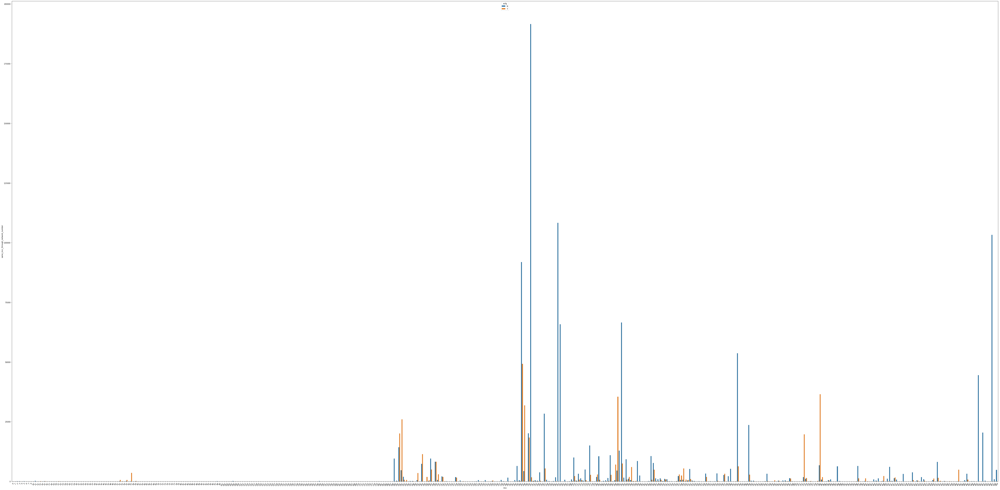

In [164]:
plt.figure(figsize=(100,50))
sns.barplot(x='mcc',y='same_mcc_through_network_number',hue='ecfg',data=smtn)
plt.xticks(rotation=45)
plt.show()

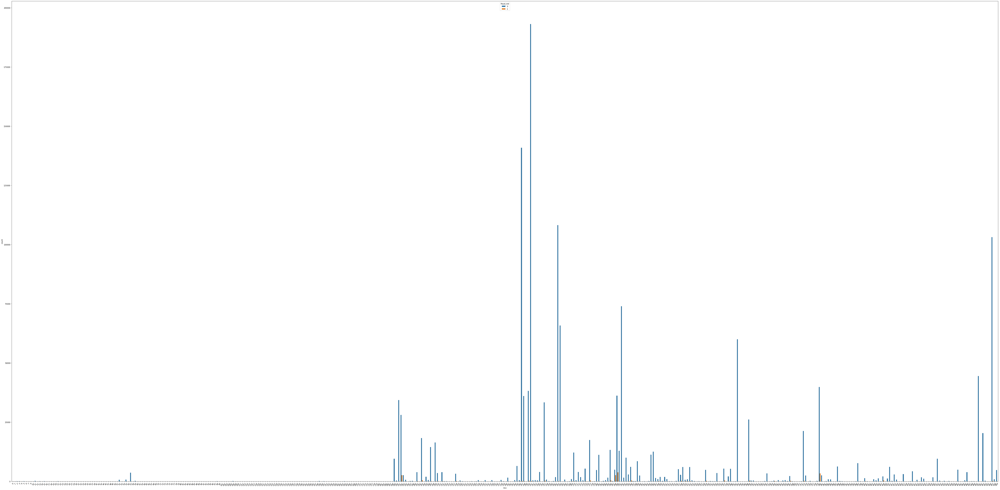

In [165]:
plt.figure(figsize=(100,50))
sns.countplot(x='mcc',hue='fraud_ind',data=train_data)
plt.xticks(rotation=45)
plt.show()

# 同一商品通過網路交易在各小時交易次數

In [166]:
ecfg_train_data = train_data.loc[train_data['ecfg']=='Y']
smshtn = ecfg_train_data.groupby(by=['mcc','hour'])['txkey'].count().rename('same_mcc_same_hour_through_network_transaction_number').reset_index()
train_data = train_data.merge(smshtn,on=['mcc','hour'],how='left')

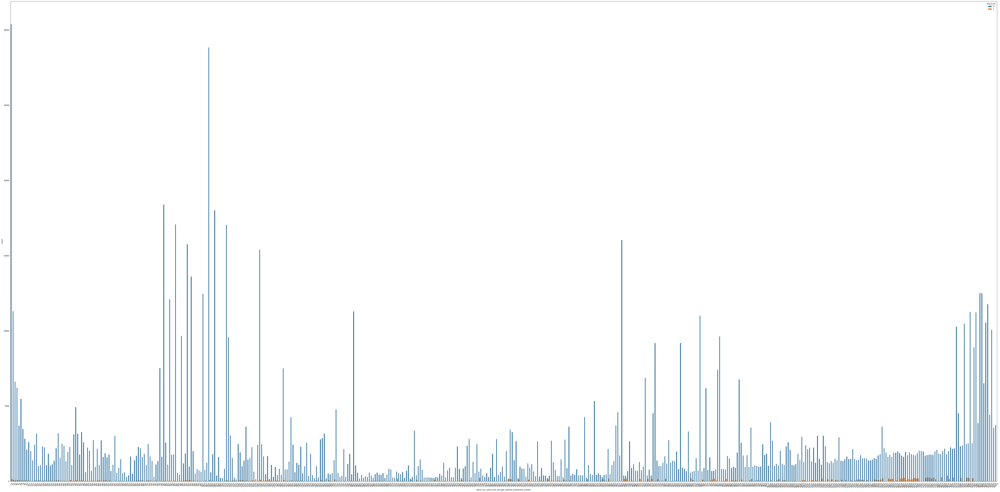

In [167]:
plt.figure(figsize=(100,50))
sns.countplot(x='same_mcc_same_hour_through_network_transaction_number',hue='fraud_ind',data=train_data)
plt.xticks(rotation=45)
plt.show()

# 同一商品詐騙數目

In [229]:
fraud_train_data = train_data.loc[train_data['fraud_ind']==1]
smfn = fraud_train_data.groupby(by=['mcc','fraud_ind'])['txkey'].count().rename('same_mcc_fraud_number').reset_index()
smfn = smfn.drop('fraud_ind',axis=1)

# 商品和交易類別的組合

In [41]:
train_data['str_mcc'] = train_data['mcc'].astype(int).apply(lambda x : str(x))
train_data['str_etymd'] = train_data['etymd'].astype(int).apply(lambda x : str(x))

train_data['mcc_etymd'] = train_data['str_mcc'] + '_' + train_data['str_etymd']
le = LabelEncoder()
train_data['mcc_etymd'] = le.fit_transform(train_data['mcc_etymd'])
train_data['mcc_etymd'] = train_data['mcc_etymd'].astype('category')

# 商品搭配金額

In [42]:
train_data['str_mcc'] = train_data['mcc'].astype(int).apply(lambda x : str(x))
train_data['str_conam'] = train_data['conam'].apply(lambda x : str(x))

train_data['mcc_conam'] = train_data['str_mcc'] + '_' + train_data['str_conam']
le = LabelEncoder()
train_data['mcc_conam'] = le.fit_transform(train_data['mcc_conam'])
train_data['mcc_conam'] = train_data['mcc_conam'].astype('category')

# 同一商品商店交易次數

In [4]:
mmtn = total_data.groupby(by=['mcc','mchno'])['txkey'].count().rename('mcc_mchno_transaction_number').reset_index()
total_data = total_data.merge(mmtn,on=['mcc','mchno'],how='left')

# 同一商品在各商店的比例(效果差)

In [5]:
smtn = total_data.groupby('mcc')['txkey'].count().rename('same_mcc_transaction_number').reset_index()
total_data = total_data.merge(smtn,on=['mcc'],how='left')

total_data['same_mcc_in_mchno_transaction_ratio'] = total_data['same_mcc_transaction_number'] / total_data['mcc_mchno_transaction_number']

# 一家商店在多個消費地被消費

In [ ]:
for i in train_data['mchno'].unique():
    a = train_data.loc[train_data['mchno']==i]['stocn'].unique()
    if len(a) > 1:
        print('mchno {} stocn {}'.format(i,a))

In [168]:
mchno_stocn_number = train_data.groupby(by='mchno')['stocn'].unique().rename('mchno_stocn_number').reset_index()
mchno_stocn_number['mchno_stocn_number'] = mchno_stocn_number['mchno_stocn_number'].apply(lambda x : len(x))

In [169]:
train_data = train_data.merge(mchno_stocn_number,on='mchno',how='left')

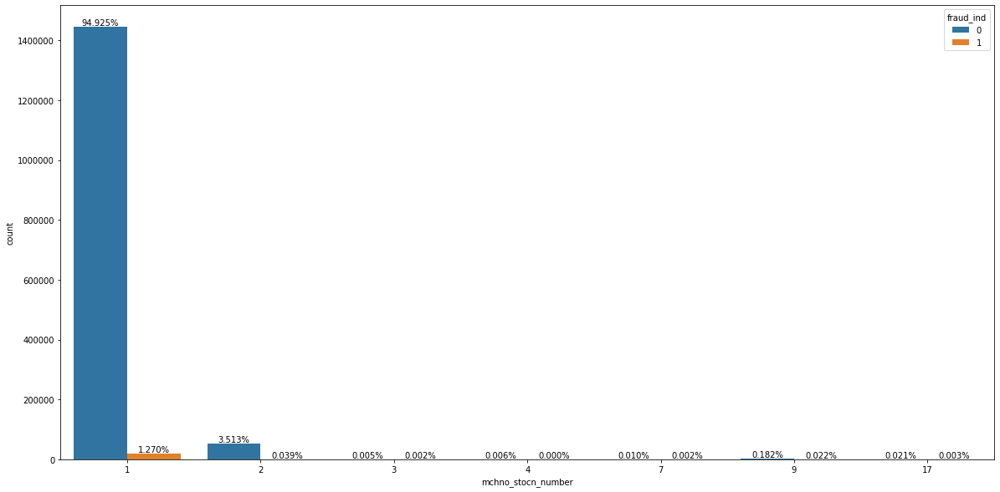

In [170]:
plt.figure(figsize=(20,10))
ax = sns.countplot(x='mchno_stocn_number',hue='fraud_ind',data=train_data)

ncount = len(train_data)
for p in ax.patches:
    x=p.get_bbox().get_points()[:,0]
    y=p.get_bbox().get_points()[1,1]
    if np.isnan(y) == True:
        y = 0
    ax.annotate('{:.3f}%'.format(100.*y/ncount), (x.mean(), y), 
            ha='center', va='bottom') # set the alignment of the text

# 商店超額交易數量

In [12]:
soln = train_data.groupby('mchno')['ovrlt'].value_counts().rename('store_over_load_number').reset_index()

In [13]:
soln_y = soln.loc[soln['ovrlt']=='Y'].drop('ovrlt',axis=1)
train_data = train_data.merge(soln_y,on='mchno',how='left')
train_data['store_over_load_number'] = train_data['store_over_load_number'].fillna(0)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
        68, 69, 70, 71, 72]), <a list of 73 Text xticklabel objects>)

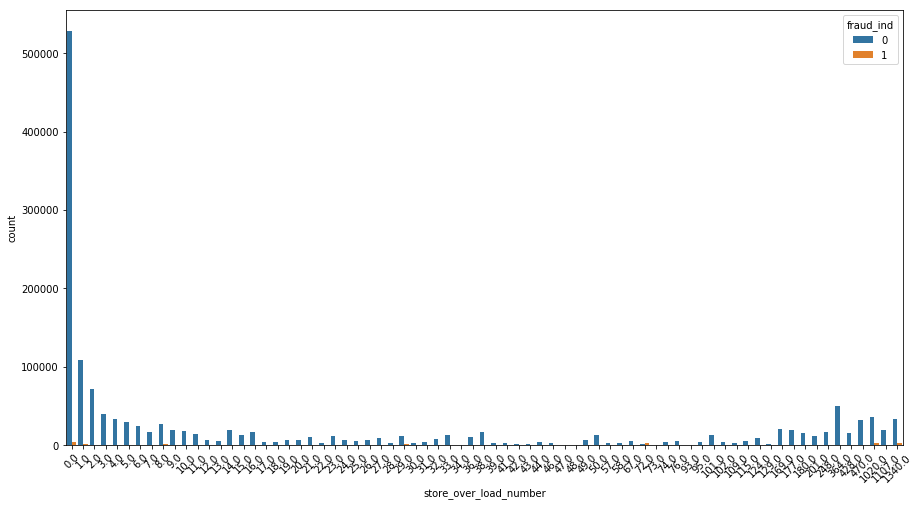

In [15]:
plt.figure(figsize=(15,8))
sns.countplot(x='store_over_load_number',hue='fraud_ind',data=train_data)
plt.xticks(rotation=45)

                                   Plots for store_over_load_number                                   
                                           Train data plots                                           


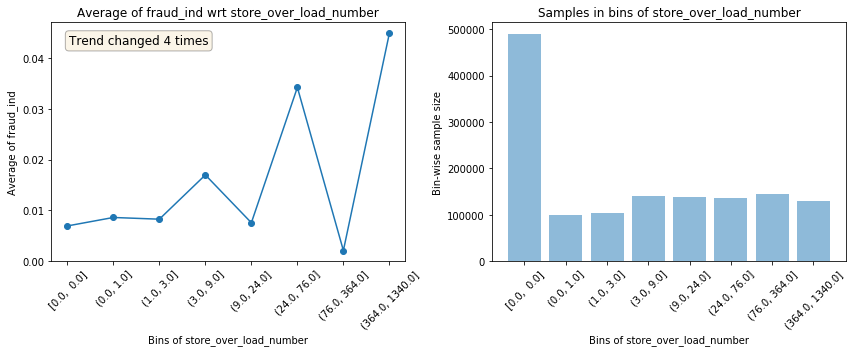

                                           Test data plots                                            


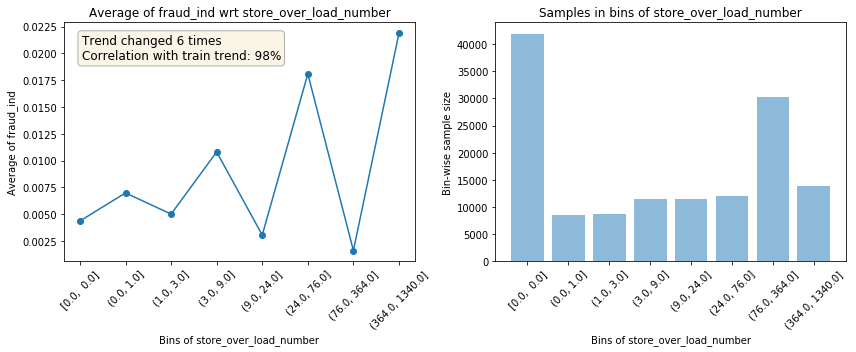

--------------------------------------------------------------------------------------------------------------


                                   Plots for store_over_load_number                                   
                                           Train data plots                                           


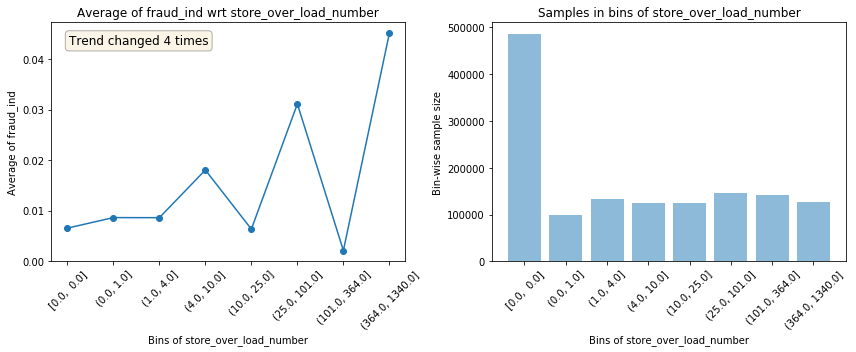

                                           Test data plots                                            


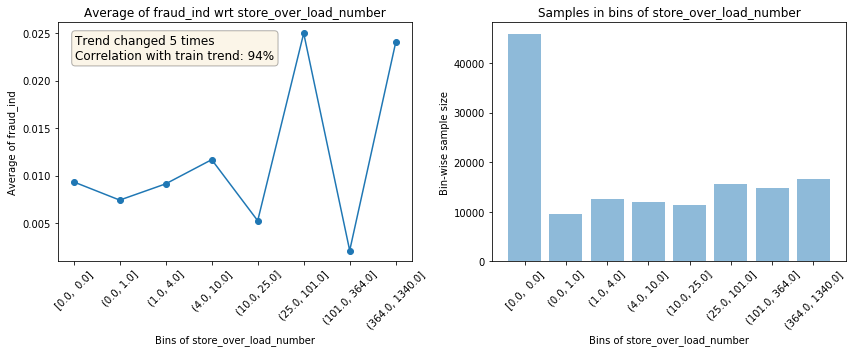

--------------------------------------------------------------------------------------------------------------


                                   Plots for store_over_load_number                                   
                                           Train data plots                                           


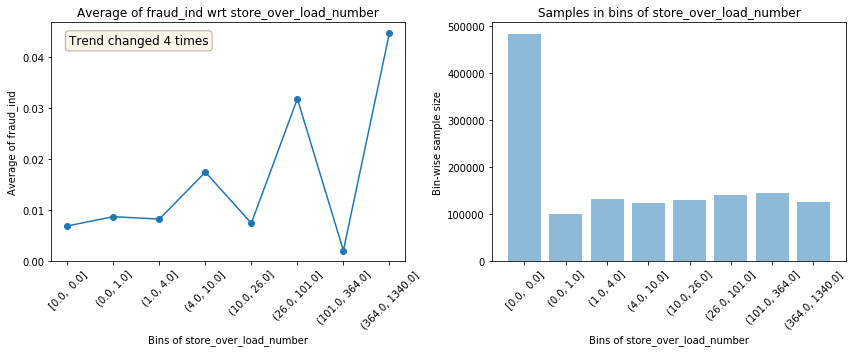

                                           Test data plots                                            


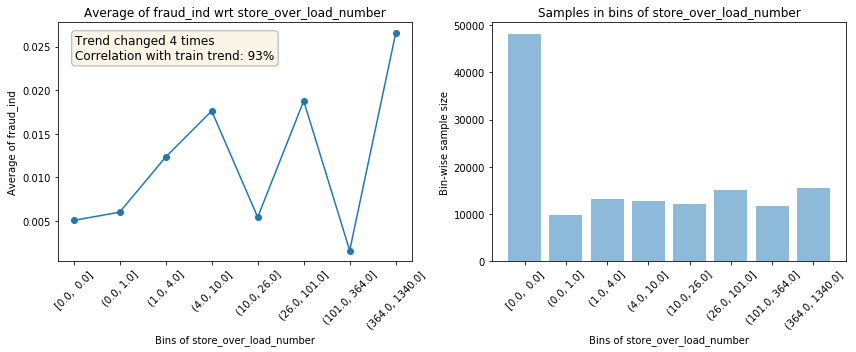

--------------------------------------------------------------------------------------------------------------


                                   Plots for store_over_load_number                                   
                                           Train data plots                                           


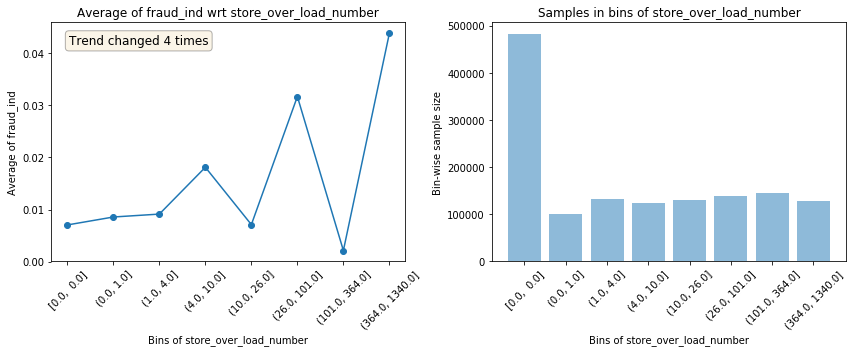

                                           Test data plots                                            


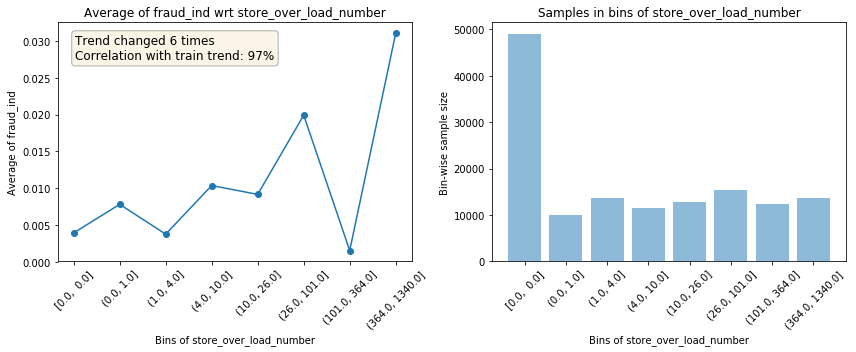

--------------------------------------------------------------------------------------------------------------


                                   Plots for store_over_load_number                                   
                                           Train data plots                                           


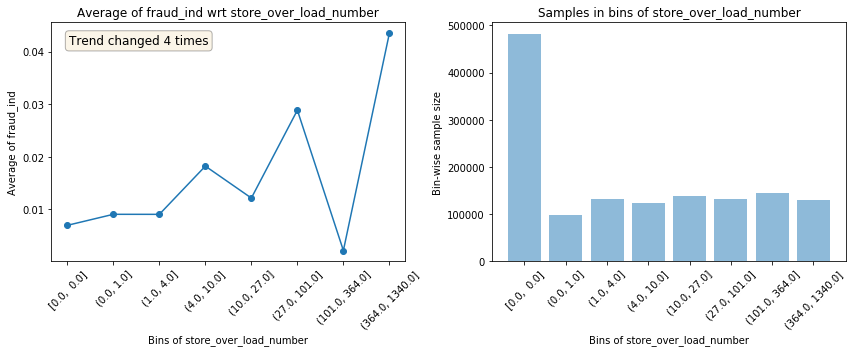

                                           Test data plots                                            


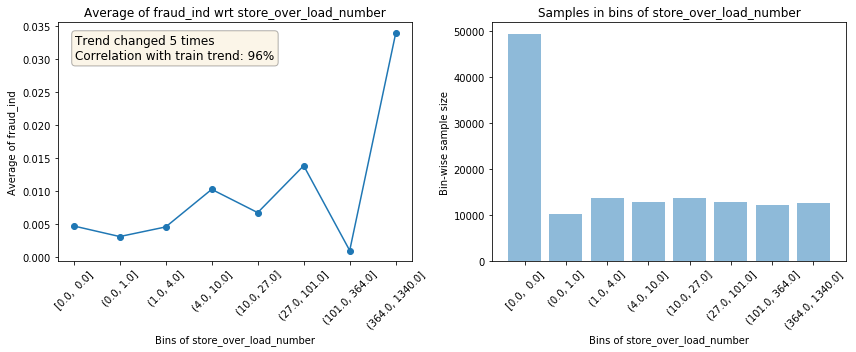

--------------------------------------------------------------------------------------------------------------


                                   Plots for store_over_load_number                                   
                                           Train data plots                                           


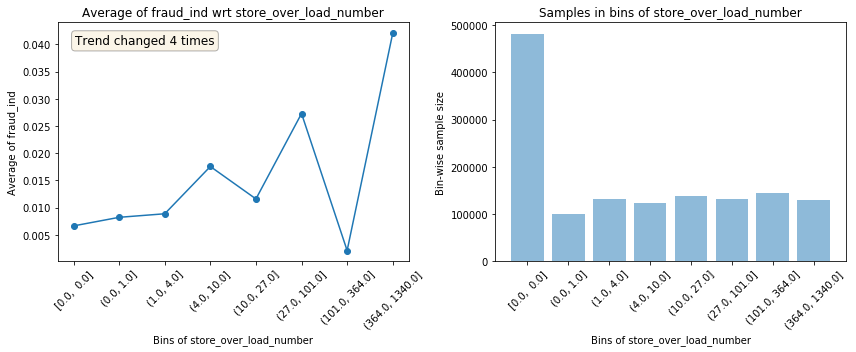

                                           Test data plots                                            


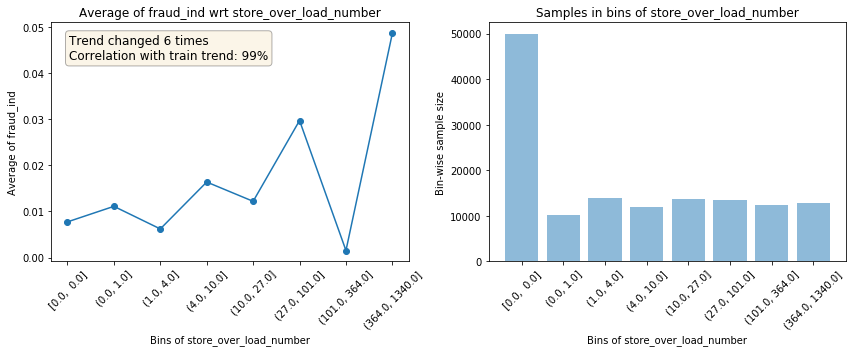

--------------------------------------------------------------------------------------------------------------


                                   Plots for store_over_load_number                                   
                                           Train data plots                                           


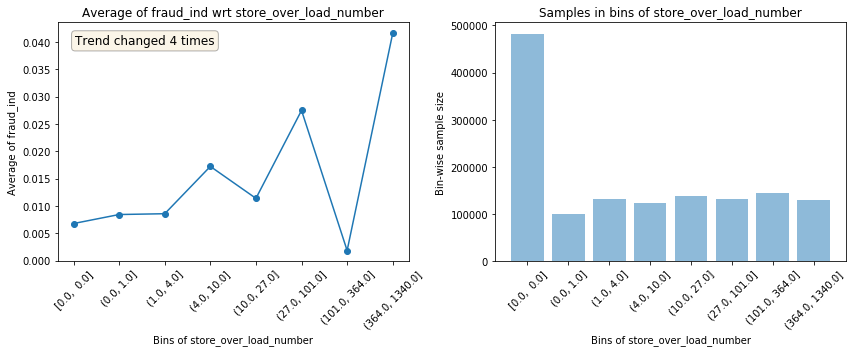

                                           Test data plots                                            


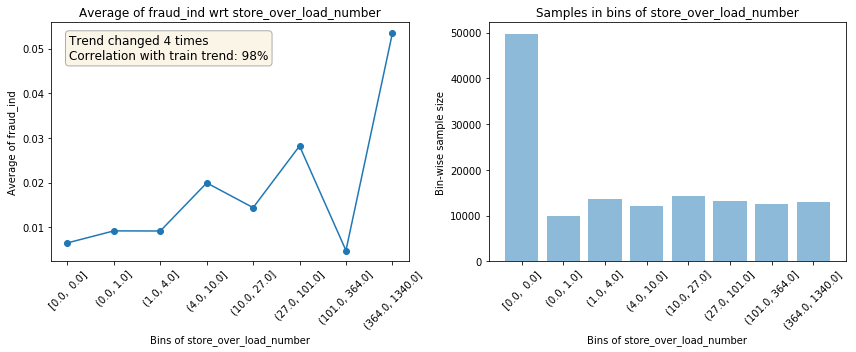

--------------------------------------------------------------------------------------------------------------


                                   Plots for store_over_load_number                                   
                                           Train data plots                                           


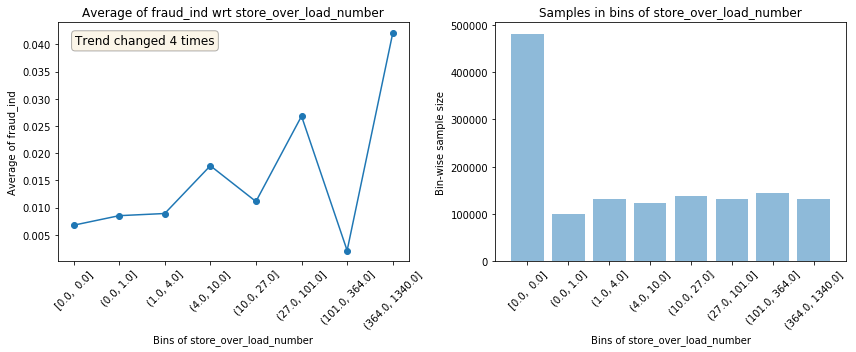

                                           Test data plots                                            


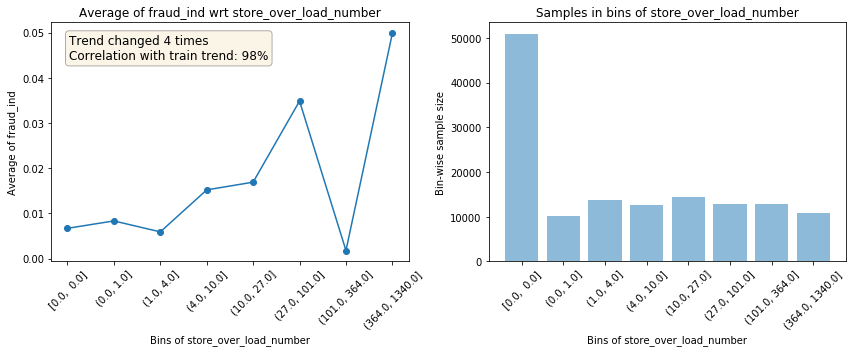

--------------------------------------------------------------------------------------------------------------


                                   Plots for store_over_load_number                                   
                                           Train data plots                                           


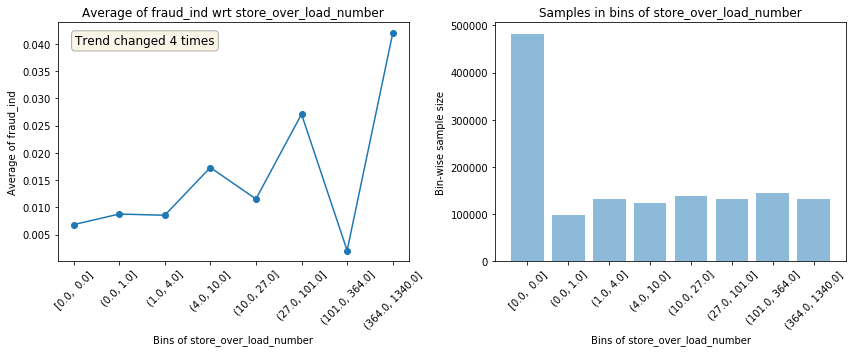

                                           Test data plots                                            


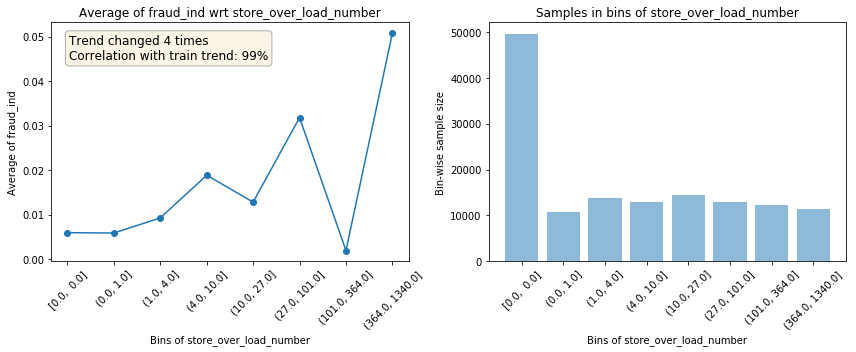

--------------------------------------------------------------------------------------------------------------


                                   Plots for store_over_load_number                                   
                                           Train data plots                                           


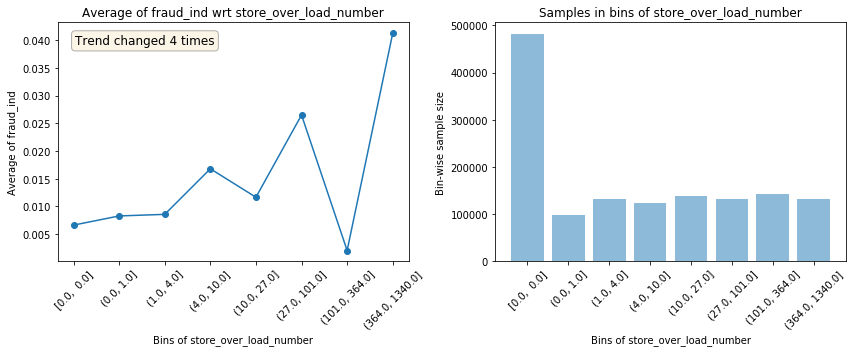

                                           Test data plots                                            


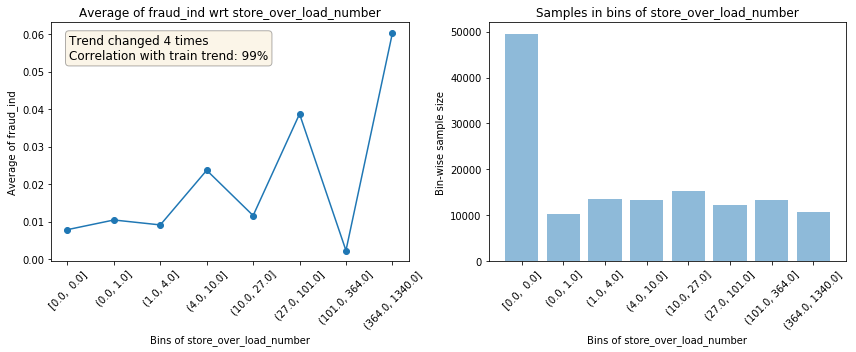

--------------------------------------------------------------------------------------------------------------




In [24]:
for epoch, (train_index, valid_index) in enumerate(zip(train_index_list,valid_index_list)):
    fold_train, fold_valid = train_data.iloc[train_index], train_data.iloc[valid_index]
    get_univariate_plots(data=fold_train, target_col='fraud_ind', 
                         features_list=['store_over_load_number'], bins=10,data_test=fold_valid)

# 商店超額交易比例

In [25]:
smtn = train_data.groupby(by='mchno')['txkey'].count().rename('same_mchno_transaction_number').reset_index()
train_data = train_data.merge(smtn,on=['mchno'],how='left')
train_data['mchno_overload_ratio'] = train_data['store_over_load_number'] / train_data['same_mchno_transaction_number']

                                    Plots for mchno_overload_ratio                                    
                                           Train data plots                                           


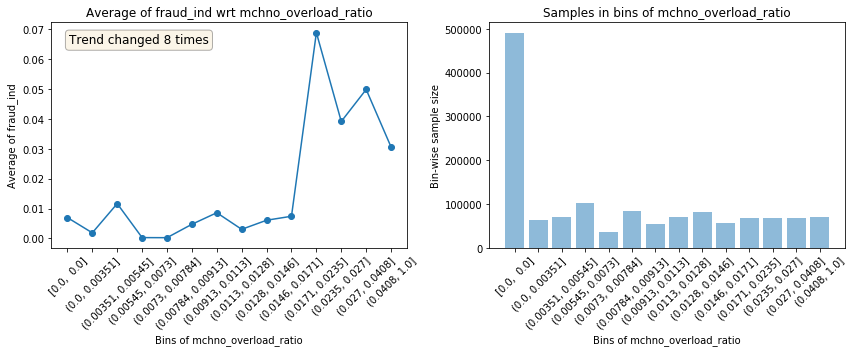

                                           Test data plots                                            


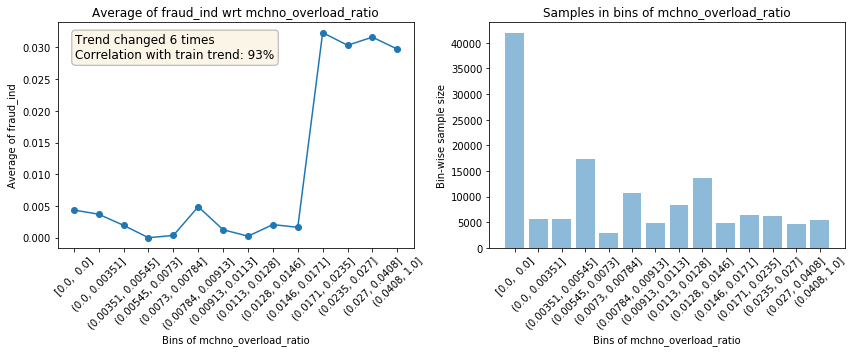

--------------------------------------------------------------------------------------------------------------


                                    Plots for mchno_overload_ratio                                    
                                           Train data plots                                           


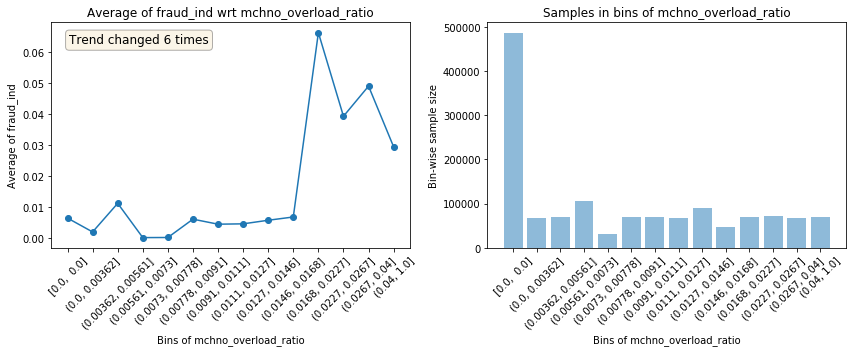

                                           Test data plots                                            


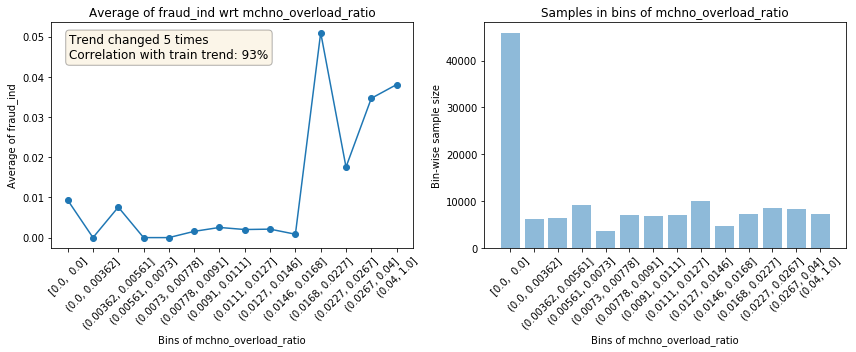

--------------------------------------------------------------------------------------------------------------


                                    Plots for mchno_overload_ratio                                    
                                           Train data plots                                           


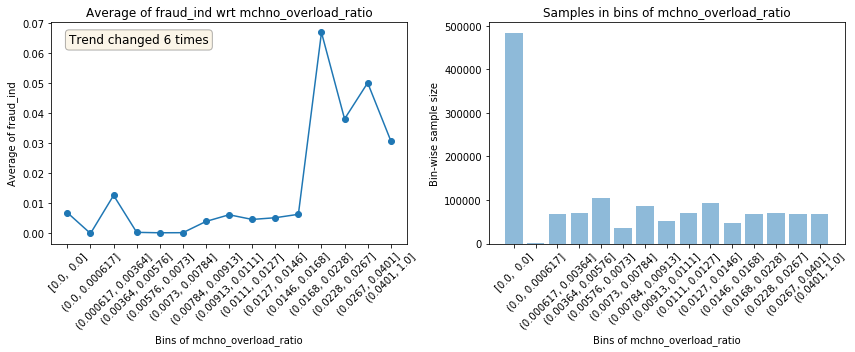

                                           Test data plots                                            


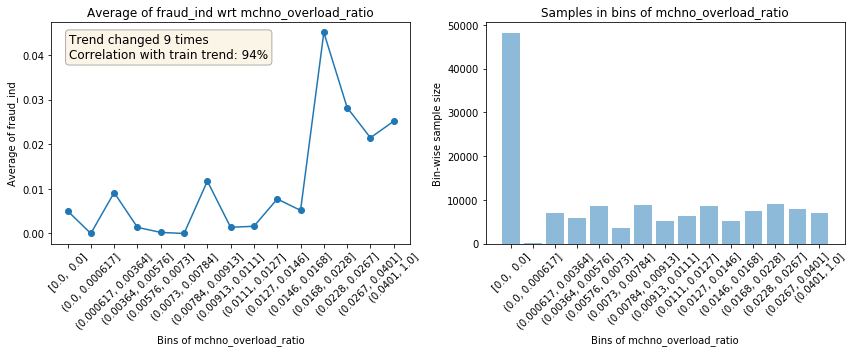

--------------------------------------------------------------------------------------------------------------


                                    Plots for mchno_overload_ratio                                    
                                           Train data plots                                           


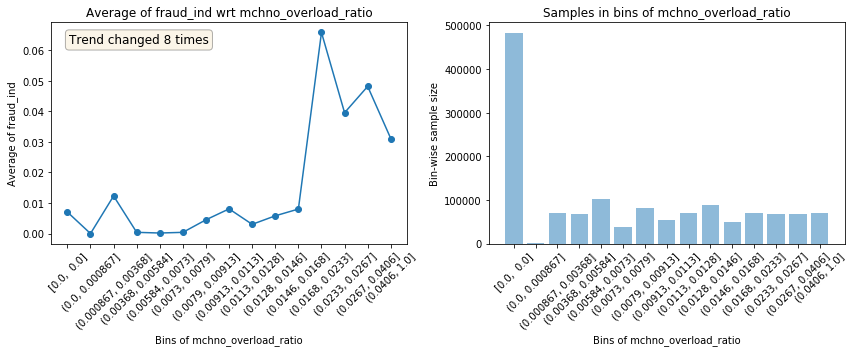

                                           Test data plots                                            


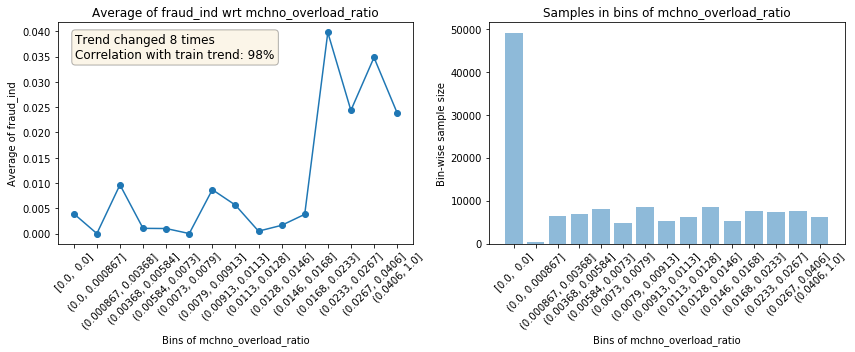

--------------------------------------------------------------------------------------------------------------


                                    Plots for mchno_overload_ratio                                    
                                           Train data plots                                           


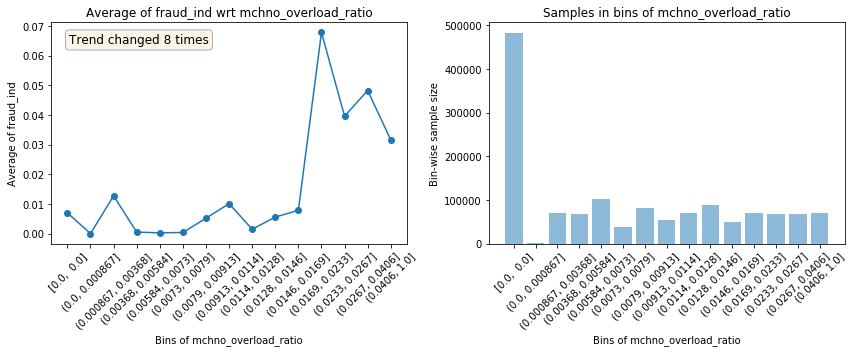

                                           Test data plots                                            


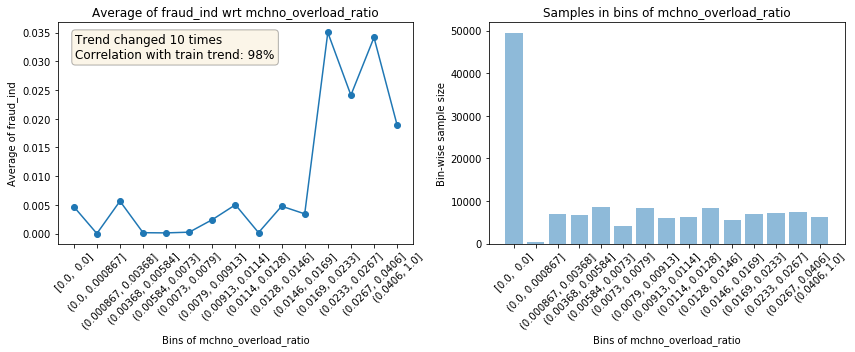

--------------------------------------------------------------------------------------------------------------


                                    Plots for mchno_overload_ratio                                    
                                           Train data plots                                           


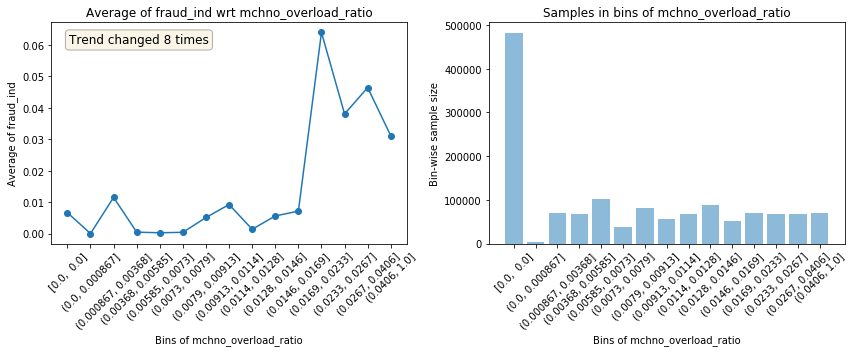

                                           Test data plots                                            


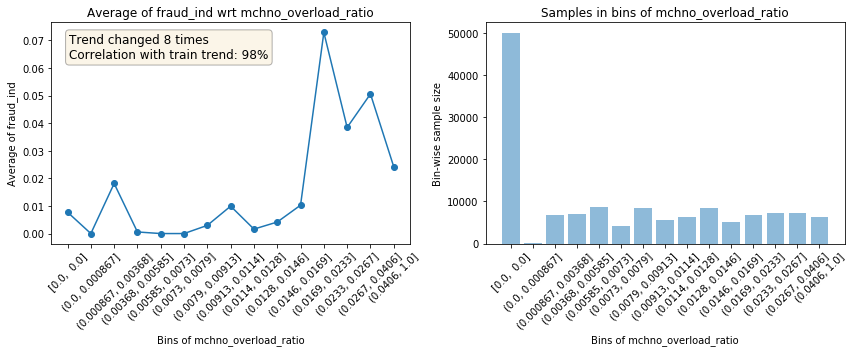

--------------------------------------------------------------------------------------------------------------


                                    Plots for mchno_overload_ratio                                    
                                           Train data plots                                           


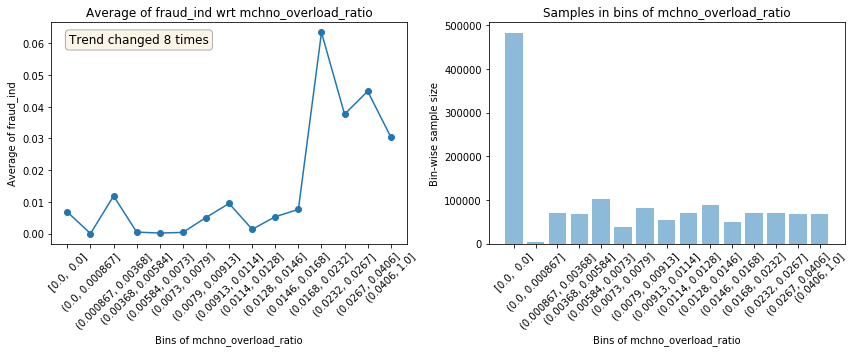

                                           Test data plots                                            


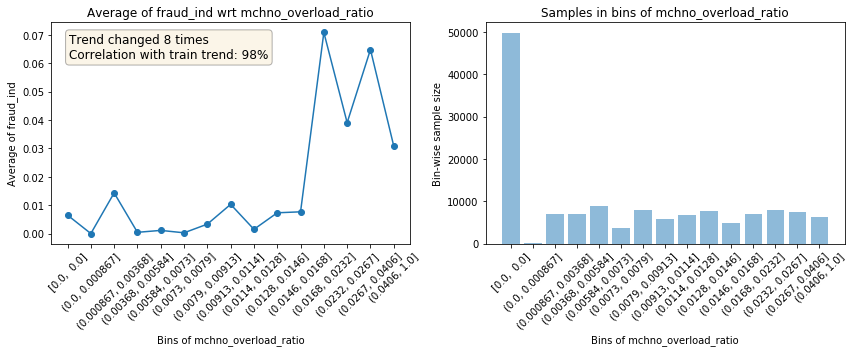

--------------------------------------------------------------------------------------------------------------


                                    Plots for mchno_overload_ratio                                    
                                           Train data plots                                           


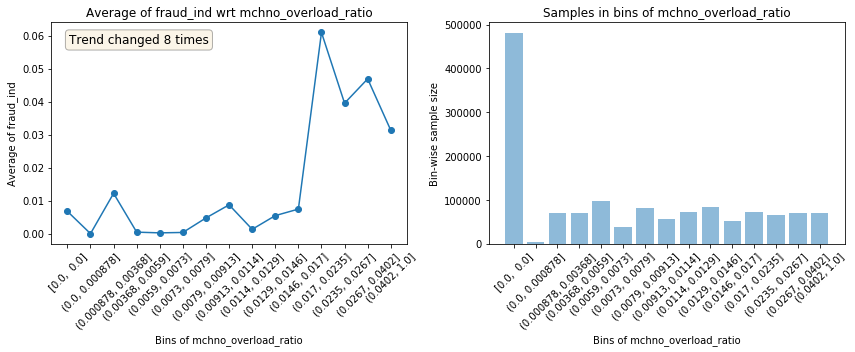

                                           Test data plots                                            


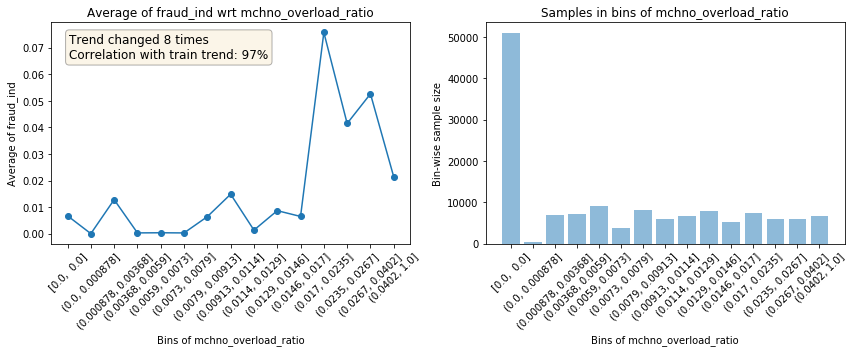

--------------------------------------------------------------------------------------------------------------


                                    Plots for mchno_overload_ratio                                    
                                           Train data plots                                           


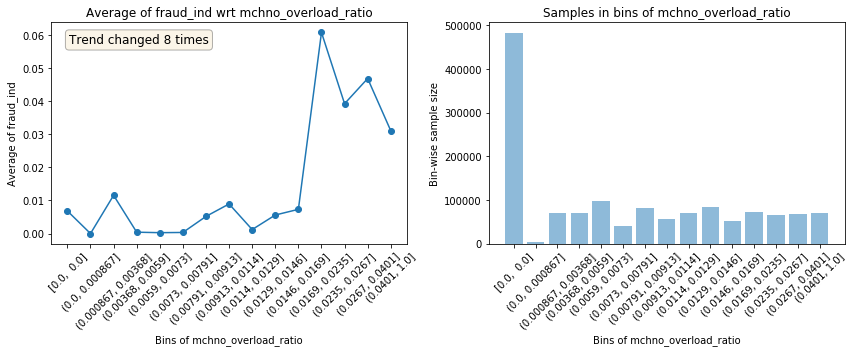

                                           Test data plots                                            


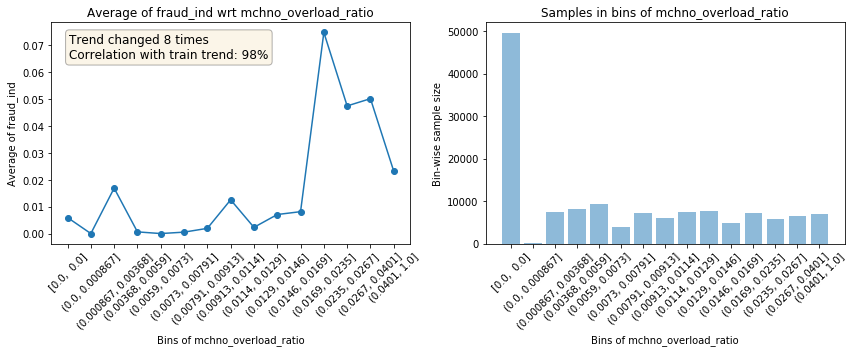

--------------------------------------------------------------------------------------------------------------


                                    Plots for mchno_overload_ratio                                    
                                           Train data plots                                           


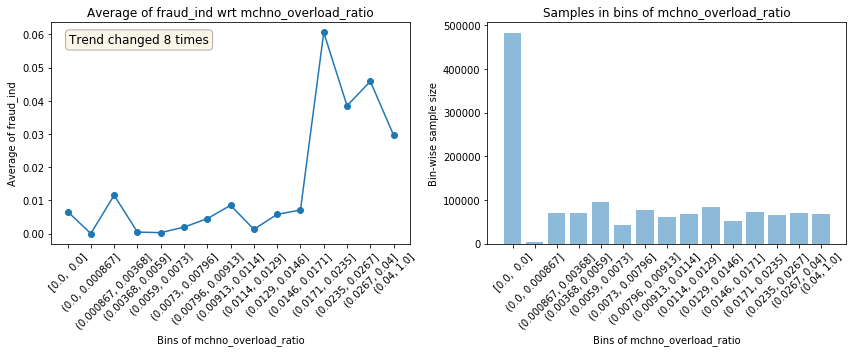

                                           Test data plots                                            


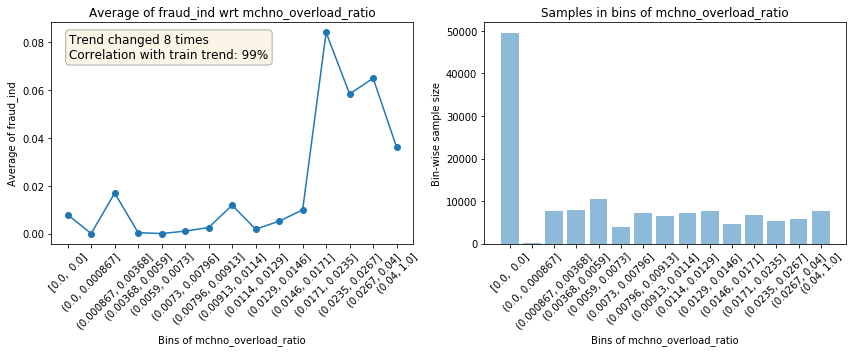

--------------------------------------------------------------------------------------------------------------




In [27]:
for epoch, (train_index, valid_index) in enumerate(zip(train_index_list,valid_index_list)):
    fold_train, fold_valid = train_data.iloc[train_index], train_data.iloc[valid_index]
    get_univariate_plots(data=fold_train, target_col='fraud_ind', 
                         features_list=['mchno_overload_ratio'], bins=20,data_test=fold_valid)

In [29]:
train_data['mchno_overload_ratio']

0          0.014557
1          0.007299
2          0.014557
3          0.014640
4          0.000000
5          0.007299
6          0.007299
7          0.016418
8          0.000000
9          0.007299
10         0.000000
11         0.007299
12         0.000000
13         0.008290
14         0.000000
15         0.007299
16         0.000000
17         0.007961
18         0.014557
19         0.006014
20         0.000000
21         0.007299
22         0.014462
23         0.008290
24         0.014557
25         0.000000
26         0.026316
27         0.011557
28         0.000000
29         0.007299
30         0.004039
31         0.012704
32         0.011557
33         0.013605
34         0.007299
35         0.007299
36         0.073171
37         0.007299
38         0.011557
39         0.014462
40         0.016667
41         0.014462
42         0.008290
43         0.013432
44         0.026656
45         0.014462
46         0.010435
47         0.007299
48         0.000000
49         0.007299


# 哪一個商品容易超額

In [15]:
moln = train_data.groupby('mcc')['ovrlt'].value_counts().rename('mcc_over_load_number').reset_index()
moln_y = moln.loc[moln['ovrlt']=='Y'].drop('ovrlt',axis=1)
train_data = train_data.merge(moln_y,on='mcc',how='left')
train_data['mcc_over_load_number'] = train_data['mcc_over_load_number'].fillna(0)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
        68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83]),
 <a list of 84 Text xticklabel objects>)

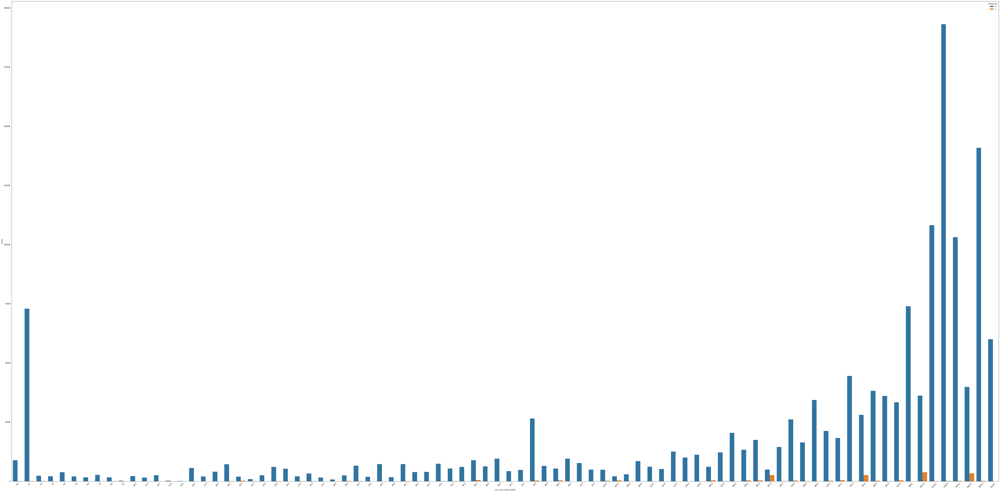

In [17]:
plt.figure(figsize=(100,50))
sns.countplot(x='mcc_over_load_number',hue='fraud_ind',data=train_data)
plt.xticks(rotation=45)

# 全球商店

In [38]:
train_data['global_mchno'] = train_data['mchno'].apply(lambda x : str(x)) + train_data['stocn'].apply(lambda x : str(x)) + train_data['scity'].apply(lambda x : str(x)) 

# 同一家商店有幾張卡交易

In [43]:
smctn = train_data.groupby(by=['mchno'])['cano'].unique().rename('same_mchno_cano_trade_number').reset_index()
smctn['same_mchno_cano_trade_number'] = smctn['same_mchno_cano_trade_number'].apply(lambda x : len(x))
train_data = train_data.merge(smctn,on=['mchno'],how='left')

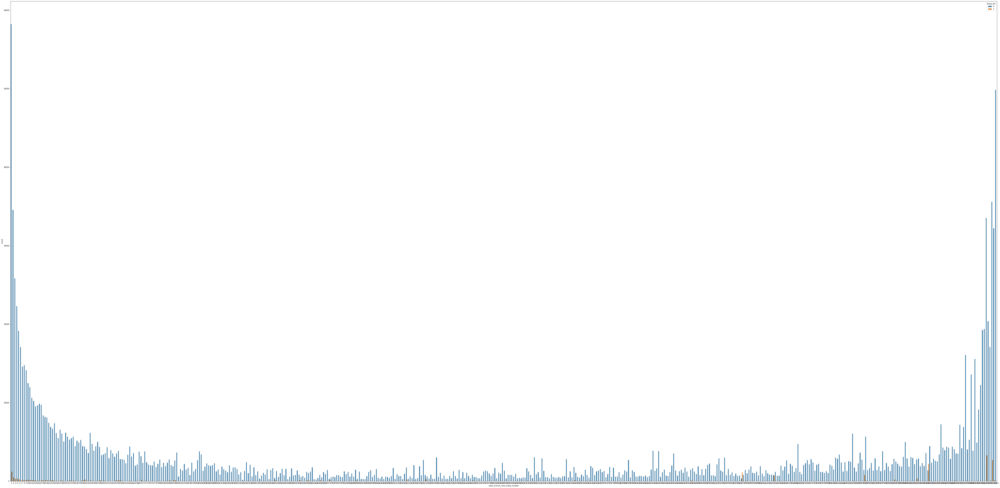

In [44]:
plt.figure(figsize=(100,50))
sns.countplot(x='same_mchno_cano_trade_number',hue='fraud_ind',data=train_data)

# 同一家商店不同狀態碼交易比例

# 同一個國家是否都是同一種幣別(使用中)

In [174]:
same_stocn_csmcu_number = train_data.groupby('stocn')['csmcu'].apply(lambda x : len(x.unique())).rename('same_stocn_csmcu_number').reset_index()

In [175]:
train_data = train_data.merge(same_stocn_csmcu_number,on='stocn',how='left')

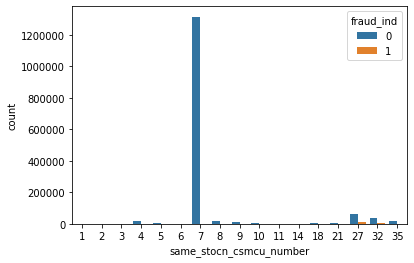

In [176]:
sns.countplot(x='same_stocn_csmcu_number',hue='fraud_ind',data=train_data)

# 星期幾

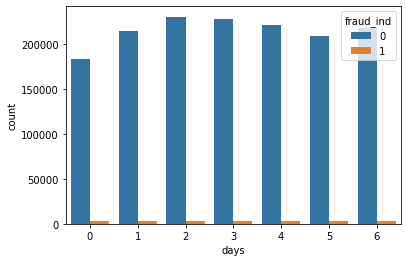

In [213]:
train_data['days'] = train_data['locdt'] % 7
sns.countplot(x='days',hue='fraud_ind',data=train_data)

# 和前一筆資料是否有差異

In [ ]:
sorted_train_data = train_data.sort_values(by=['cano','locdt','loctm'])

first_train_data = train_data.sort_values(by=['locdt','loctm']).groupby(by='cano').first().reset_index()
first_train_data['is_first'] = 1

sorted_train_data['shift_locdt'] = sorted_train_data['locdt'].shift(1).fillna(0)

sorted_train_data['shift_loctm'] = sorted_train_data['loctm'].shift(1).fillna(0)

sorted_train_data['difference_locdt'] = sorted_train_data['locdt'] - sorted_train_data['shift_locdt']
sorted_train_data['difference_loctm'] = sorted_train_data['loctm'] - sorted_train_data['shift_loctm']
sorted_train_data['same_cano_total_difference_second'] = 86400 * sorted_train_data['difference_locdt'] + sorted_train_data['difference_loctm']

sorted_train_data['shift_contp'] = sorted_train_data['contp'].shift(1).fillna(0)
sorted_train_data['difference_contp'] = sorted_train_data['contp'] - sorted_train_data['shift_contp']
sorted_train_data.loc[sorted_train_data['difference_contp']!=0,'is_difference_contp'] = 1
sorted_train_data['is_difference_contp'] = sorted_train_data['is_difference_contp'].fillna(0)

sorted_train_data['shift_csmcu'] = sorted_train_data['csmcu'].shift(1).fillna(0)
sorted_train_data['difference_csmcu'] = sorted_train_data['csmcu'] - sorted_train_data['shift_csmcu']
sorted_train_data.loc[sorted_train_data['difference_csmcu']!=0,'is_difference_csmcu'] = 1
sorted_train_data['is_difference_csmcu'] = sorted_train_data['is_difference_csmcu'].fillna(0)

sorted_train_data['shift_ecfg'] = sorted_train_data['ecfg'].shift(1).fillna(0)
sorted_train_data['difference_ecfg'] = sorted_train_data['ecfg'] - sorted_train_data['shift_ecfg']
sorted_train_data.loc[sorted_train_data['difference_ecfg']!=0,'is_difference_ecfg'] = 1
sorted_train_data['is_difference_ecfg'] = sorted_train_data['is_difference_ecfg'].fillna(0)

sorted_train_data['shift_etymd'] = sorted_train_data['etymd'].shift(1).fillna(0)
sorted_train_data['difference_etymd'] = sorted_train_data['etymd'] - sorted_train_data['shift_etymd']
sorted_train_data.loc[sorted_train_data['difference_etymd']!=0,'is_difference_etymd'] = 1
sorted_train_data['is_difference_etymd'] = sorted_train_data['is_difference_etymd'].fillna(0)

sorted_train_data['shift_flbmk'] = sorted_train_data['flbmk'].shift(1).fillna(0)
sorted_train_data['difference_flbmk'] = sorted_train_data['flbmk'] - sorted_train_data['shift_flbmk']
sorted_train_data.loc[sorted_train_data['difference_flbmk']!=0,'is_difference_flbmk'] = 1
sorted_train_data['is_difference_flbmk'] = sorted_train_data['is_difference_flbmk'].fillna(0)

sorted_train_data['shift_flg_3dsmk'] = sorted_train_data['flg_3dsmk'].shift(1).fillna(0)
sorted_train_data['difference_flg_3dsmk'] = sorted_train_data['flg_3dsmk'] - sorted_train_data['shift_flg_3dsmk']
sorted_train_data.loc[sorted_train_data['difference_flg_3dsmk']!=0,'is_difference_flg_3dsmk'] = 1
sorted_train_data['is_difference_flg_3dsmk'] = sorted_train_data['is_difference_flg_3dsmk'].fillna(0)

sorted_train_data['shift_hcefg'] = sorted_train_data['hcefg'].shift(1).fillna(0)
sorted_train_data['difference_hcefg'] = sorted_train_data['hcefg'] - sorted_train_data['shift_hcefg']
sorted_train_data.loc[sorted_train_data['difference_hcefg']!=0,'is_difference_hcefg'] = 1
sorted_train_data['is_difference_hcefg'] = sorted_train_data['is_difference_hcefg'].fillna(0)

sorted_train_data['shift_insfg'] = sorted_train_data['insfg'].shift(1).fillna(0)
sorted_train_data['difference_insfg'] = sorted_train_data['insfg'] - sorted_train_data['shift_insfg']
sorted_train_data.loc[sorted_train_data['difference_insfg']!=0,'is_difference_insfg'] = 1
sorted_train_data['is_difference_insfg'] = sorted_train_data['is_difference_insfg'].fillna(0)

sorted_train_data['shift_iterm'] = sorted_train_data['iterm'].shift(1).fillna(0)
sorted_train_data['difference_iterm'] = sorted_train_data['iterm'] - sorted_train_data['shift_iterm']
sorted_train_data.loc[sorted_train_data['difference_iterm']!=0,'is_difference_iterm'] = 1
sorted_train_data['is_difference_iterm'] = sorted_train_data['is_difference_iterm'].fillna(0)

sorted_train_data['shift_mcc'] = sorted_train_data['mcc'].shift(1).fillna(0)
sorted_train_data['difference_mcc'] = sorted_train_data['mcc'] - sorted_train_data['shift_mcc']
sorted_train_data.loc[sorted_train_data['difference_mcc']!=0,'is_difference_mcc'] = 1
sorted_train_data['is_difference_mcc'] = sorted_train_data['is_difference_mcc'].fillna(0)

sorted_train_data['shift_mchno'] = sorted_train_data['mchno'].shift(1).fillna(0)
sorted_train_data['difference_mchno'] = sorted_train_data['mchno'] - sorted_train_data['shift_mchno']
sorted_train_data.loc[sorted_train_data['difference_mchno']!=0,'is_difference_mchno'] = 1
sorted_train_data['is_difference_mchno'] = sorted_train_data['is_difference_mchno'].fillna(0)

sorted_train_data['shift_ovrlt'] = sorted_train_data['ovrlt'].shift(1).fillna(0)
sorted_train_data['difference_ovrlt'] = sorted_train_data['ovrlt'] - sorted_train_data['shift_ovrlt']
sorted_train_data.loc[sorted_train_data['difference_ovrlt']!=0,'is_difference_ovrlt'] = 1
sorted_train_data['is_difference_ovrlt'] = sorted_train_data['is_difference_ovrlt'].fillna(0)

sorted_train_data['shift_scity'] = sorted_train_data['scity'].shift(1).fillna(0)
sorted_train_data['difference_scity'] = sorted_train_data['scity'] - sorted_train_data['shift_scity']
sorted_train_data.loc[sorted_train_data['difference_scity']!=0,'is_difference_scity'] = 1
sorted_train_data['is_difference_scity'] = sorted_train_data['is_difference_scity'].fillna(0)

sorted_train_data['shift_stocn'] = sorted_train_data['stocn'].shift(1).fillna(0)
sorted_train_data['difference_stocn'] = sorted_train_data['stocn'] - sorted_train_data['shift_stocn']
sorted_train_data.loc[sorted_train_data['difference_stocn']!=0,'is_difference_stocn'] = 1
sorted_train_data['is_difference_stocn'] = sorted_train_data['is_difference_stocn'].fillna(0)

sorted_train_data['shift_stscd'] = sorted_train_data['stscd'].shift(1).fillna(0)
sorted_train_data['difference_stscd'] = sorted_train_data['stscd'] - sorted_train_data['shift_stscd']
sorted_train_data.loc[sorted_train_data['difference_stscd']!=0,'is_difference_stscd'] = 1
sorted_train_data['is_difference_stscd'] = sorted_train_data['is_difference_stscd'].fillna(0)


sorted_train_data = sorted_train_data.merge(first_train_data[['txkey','is_first']],on='txkey',how='left')
sorted_train_data['is_first'] = sorted_train_data['is_first'].fillna(0)

sorted_train_data.loc[sorted_train_data['is_first']==1,'same_cano_total_difference_second'] = -1
sorted_train_data.loc[sorted_train_data['is_first']==1,'is_difference_contp'] = 0
sorted_train_data.loc[sorted_train_data['is_first']==1,'is_difference_csmcu'] = 0
sorted_train_data.loc[sorted_train_data['is_first']==1,'is_difference_ecfg'] = 0
sorted_train_data.loc[sorted_train_data['is_first']==1,'is_difference_etymd'] = 0
sorted_train_data.loc[sorted_train_data['is_first']==1,'is_difference_flbmk'] = 0
sorted_train_data.loc[sorted_train_data['is_first']==1,'is_difference_flg_3dsmk'] = 0
sorted_train_data.loc[sorted_train_data['is_first']==1,'is_difference_hcefg'] = 0
sorted_train_data.loc[sorted_train_data['is_first']==1,'is_difference_insfg'] = 0
sorted_train_data.loc[sorted_train_data['is_first']==1,'is_difference_iterm'] = 0
sorted_train_data.loc[sorted_train_data['is_first']==1,'is_difference_mcc'] = 0
sorted_train_data.loc[sorted_train_data['is_first']==1,'is_difference_mchno'] = 0
sorted_train_data.loc[sorted_train_data['is_first']==1,'is_difference_ovrlt'] = 0
sorted_train_data.loc[sorted_train_data['is_first']==1,'is_difference_scity'] = 0
sorted_train_data.loc[sorted_train_data['is_first']==1,'is_difference_stocn'] = 0
sorted_train_data.loc[sorted_train_data['is_first']==1,'is_difference_stscd'] = 0

train_data = train_data.merge(sorted_train_data[['txkey','same_cano_total_difference_second']],on='txkey',how='left')

# 逆向看資料

In [125]:
predict_train_data = pd.read_csv('predict_train_data.csv')

In [126]:
f0_p1 = predict_train_data.loc[(predict_train_data['fraud_ind']==0)&(predict_train_data['predict_fraud']==1)]
f1_p0 = predict_train_data.loc[(predict_train_data['fraud_ind']==1)&(predict_train_data['predict_fraud']==0)]
f0_p0 = predict_train_data.loc[(predict_train_data['fraud_ind']==0)&(predict_train_data['predict_fraud']==0)]
f1_p1 = predict_train_data.loc[(predict_train_data['fraud_ind']==1)&(predict_train_data['predict_fraud']==1)]

In [127]:
f1_p0.head(10)

,acqic,bacno,cano,conam,contp,csmcu,ecfg,etymd,flbmk,flg_3dsmk,fraud_ind,hcefg,insfg,iterm,locdt,loctm,mcc,mchno,ovrlt,scity,stocn,stscd,txkey,hour,store_over_load_number,transaction_number,same_bacno_credict_card_number,frequent_csmcu_0,frequent_csmcu_1,frequent_csmcu_2,frequent_csmcu_3,frequent_stocn_0,frequent_stocn_1,frequent_stocn_2,frequent_stocn_3,frequent_stocn_4,is_difference_csmcu_stocn,same_stocn_csmcu_number,same_cano_same_locdt_transaction_number,transaction_frequency,same_bacno_cano_trade_number,same_bacno_cano_trade_number_ratio,same_bacno_mcc_separate_trade_number,same_bacno_mcc_trade_ratio,mcc_mean_price,is_high_mcc_mean_price,total_difference_second,same_cano_same_locdt_csmcu_number,same_cano_difference_day_transaction_number,same_cano_same_locdt_same_mcc_mean_conam,same_cano_same_stocn_mcc_transaction_number,same_cano_same_locdt_same_mcc_different_stscd_transaction_number,same_cano_stocn_transaction_number,mcc_median_price,is_high_mcc_median_price,same_cano_same_day_sequential_transaction_number,is_sequential_trade,month,same_bacno_same_month_transaction_number,same_cano_same_locdt_sum_conam,global_mchno,same_cano_same_locdt_same_mcc_same_mchno_different_stscd_transaction_number,same_cano_total_difference_second,is_difference_contp,is_difference_csmcu,is_difference_ecfg,is_difference_etymd,is_difference_flbmk,is_difference_flg_3dsmk,is_difference_hcefg,is_difference_insfg,is_difference_iterm,is_difference_mcc,is_difference_mchno,is_difference_ovrlt,is_difference_scity,is_difference_stocn,is_difference_stscd,same_cano_same_locdt_same_mcc_median_conam,same_bacno_same_day_use_card_number,same_cano_same_hour_transaction_number,same_cano_same_locdt_same_hour_transaction_number,same_cano_same_mcc_different_conam_transaction_number,same_cano_same_locdt_same_mcc_csmcu_number,same_cano_mcc_separate_trade_number,same_cano_transaction_number,same_cano_mcc_trade_ratio,same_cano_same_mcc_max_conam,same_cano_same_mcc_min_conam,same_cano_same_month_transaction_number,mcc_over_load_number,same_cano_same_locdt_same_stocn_mcc_transaction_number,predict_fraud
70,3288,88538,81033,1.38,5,62,1,8,0,0,1.0,5,0,0,7,17697,337,20984,0,621,93,2,651056,4,70.0,5,1,62,NaN,NaN,NaN,102,NaN,NaN,NaN,NaN,1,19,2,1.000000,5,1.000000,2,0.400000,508.733848,0.0,1.0,1,5,0.69000,2,2,2,479.77,0.0,1,0.0,1.0,5,1.38,16048,2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.69,1,2,2,1,1,2,5,0.400000,1.38,0.00,5,106.0,2,0
1254,6881,125183,48320,513.80,5,0,0,0,0,0,1.0,5,0,0,67,17903,457,59360,0,0,102,0,554270,4,113.0,10,3,0,NaN,NaN,NaN,102,NaN,NaN,NaN,NaN,0,9,1,-1.000000,3,0.300000,3,1.000000,520.906246,0.0,-1.0,1,3,513.80000,3,1,3,513.80,0.0,1,0.0,3.0,10,513.80,60662,1,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,513.80,1,2,1,3,1,3,3,1.000000,513.80,513.80,3,1673.0,1,0
1888,6215,43976,129128,551.51,5,62,1,2,0,0,1.0,5,0,0,44,46727,289,54828,0,3460,46,2,1879721,12,1136.0,60,2,62,NaN,NaN,NaN,46,NaN,NaN,NaN,NaN,0,30,8,5356.571429,40,0.666667,23,0.575000,418.144373,1.0,193.0,1,40,551.51000,23,6,23,362.61,1.0,6,1.0,2.0,24,5341.74,55494,6,193.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,551.51,1,3,2,8,1,23,40,0.575000,823.40,216.12,21,1182.0,6,0
2090,0,40293,48347,0.00,5,0,0,1,0,0,1.0,1,0,0,19,46616,340,103106,0,0,104,0,1956048,12,0.0,30,3,0,61.0,NaN,NaN,102,104.0,NaN,NaN,NaN,0,28,4,2560.333333,4,0.133333,4,1.000000,11.458523,0.0,7.0,2,4,0.00000,2,4,2,0.00,0.0,4,1.0,1.0,15,0.00,3658,2,7.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.00,2,2,2,4,2,4,4,1.000000,0.00,0.00,4,1.0,2,0
2465,6215,60064,101026,0.00,5,62,0,2,0,0,1.0,5,0,0,58,25705,289,54828,0,3460,46,0,1894311,7,1136.0,35,2,62,NaN,NaN,NaN,102,NaN,NaN,NaN,NaN,1,30,2,52787.000000,24,0.685714,7,0.291667,418.144373,0.0,1097569.0,1,24,0.00000,7,1,7,362.61,0.0,1,0.0,2.0,10,465.62,55494,1,1097569.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.00,1,1,1,4,1,7,24,0.291667,380.94,0.00,10,1182.0,1,0
6519,5858,162891,78401,812.26,5,62,

In [133]:
f0_p0.loc[f0_p0['cano']==111552].sort_values(by=['locdt','loctm'])

,acqic,bacno,cano,conam,contp,csmcu,ecfg,etymd,flbmk,flg_3dsmk,fraud_ind,hcefg,insfg,iterm,locdt,loctm,mcc,mchno,ovrlt,scity,stocn,stscd,txkey,hour,store_over_load_number,transaction_number,same_bacno_credict_card_number,frequent_csmcu_0,frequent_csmcu_1,frequent_csmcu_2,frequent_csmcu_3,frequent_stocn_0,frequent_stocn_1,frequent_stocn_2,frequent_stocn_3,frequent_stocn_4,is_difference_csmcu_stocn,same_stocn_csmcu_number,same_cano_same_locdt_transaction_number,transaction_frequency,same_bacno_cano_trade_number,same_bacno_cano_trade_number_ratio,same_bacno_mcc_separate_trade_number,same_bacno_mcc_trade_ratio,mcc_mean_price,is_high_mcc_mean_price,total_difference_second,same_cano_same_locdt_csmcu_number,same_cano_difference_day_transaction_number,same_cano_same_locdt_same_mcc_mean_conam,same_cano_same_stocn_mcc_transaction_number,same_cano_same_locdt_same_mcc_different_stscd_transaction_number,same_cano_stocn_transaction_number,mcc_median_price,is_high_mcc_median_price,same_cano_same_day_sequential_transaction_number,is_sequential_trade,month,same_bacno_same_month_transaction_number,same_cano_same_locdt_sum_conam,global_mchno,same_cano_same_locdt_same_mcc_same_mchno_different_stscd_transaction_number,same_cano_total_difference_second,is_difference_contp,is_difference_csmcu,is_difference_ecfg,is_difference_etymd,is_difference_flbmk,is_difference_flg_3dsmk,is_difference_hcefg,is_difference_insfg,is_difference_iterm,is_difference_mcc,is_difference_mchno,is_difference_ovrlt,is_difference_scity,is_difference_stocn,is_difference_stscd,same_cano_same_locdt_same_mcc_median_conam,same_bacno_same_day_use_card_number,same_cano_same_hour_transaction_number,same_cano_same_locdt_same_hour_transaction_number,same_cano_same_mcc_different_conam_transaction_number,same_cano_same_locdt_same_mcc_csmcu_number,same_cano_mcc_separate_trade_number,same_cano_transaction_number,same_cano_mcc_trade_ratio,same_cano_same_mcc_max_conam,same_cano_same_mcc_min_conam,same_cano_same_month_transaction_number,mcc_over_load_number,same_cano_same_locdt_same_stocn_mcc_transaction_number,predict_fraud
236541,0,131088,111552,0.00,5,0,0,1,0,0,0.0,2,0,0,2,82367,340,103106,0,0,104,0,1955445,22,0.0,52,2,62,NaN,NaN,NaN,38,NaN,NaN,NaN,NaN,1,28,18,1306.294118,44,0.846154,7,0.159091,11.458523,0.0,1.0,3,44,0.000000,5,7,5,0.00,0.0,10,1.0,1.0,36,873.50,3658,5,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.00,1,13,13,7,2,7,44,0.159091,0.00,0.00,36,1.0,5,0
1516160,0,131088,111552,0.00,5,0,0,1,0,0,0.0,2,0,0,2,82377,340,103106,0,0,104,0,1955446,22,0.0,52,2,62,NaN,NaN,NaN,38,NaN,NaN,NaN,NaN,1,28,18,1306.294118,44,0.846154,7,0.159091,11.458523,0.0,9.0,3,44,0.000000,5,7,5,0.00,0.0,10,1.0,1.0,36,873.50,3658,5,9.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.00,1,13,13,7,2,7,44,0.159091,0.00,0.00,36,1.0,5,0
233258,0,131088,111552,0.00,5,0,0,1,0,0,0.0,2,0,0,2,82698,340,103106,0,0,104,0,1955452,22,0.0,52,2,62,NaN,NaN,NaN,38,NaN,NaN,NaN,NaN,1,28,18,1306.294118,44,0.846154,7,0.159091,11.458523,0.0,0.0,3,44,0.000000,5,7,5,0.00,0.0,10,1.0,1.0,36,873.50,3658,5,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.00,1,13,13,7,2,7,44,0.159091,0.00,0.00,36,1.0,5,0
419265,0,131088,111552,0.00,5,0,0,1,0,0,0.0,2,0,0,2,82703,340,103106,0,0,104,0,1955453,22,0.0,52,2,62,NaN,NaN,NaN,38,NaN,NaN,NaN,NaN,1,28,18,1306.294118,44,0.846154,7,0.159091,11.458523,0.0,3.0,3,44,0.000000,5,7,5,0.00,0.0,10,1.0,1.0,36,873.50,3658,5,3.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.00,1,13,13,7,2,7,44,0.159091,0.00,0.00,36,1.0,5,0
982963,0,131088,111552,0.00,5,0,0,1,0,0,0.0,2,0,0,2,82714,340,103106,0,0,104,0,1955454,22,0.0,52,2,62,NaN,NaN,NaN,38,NaN,NaN,NaN,NaN,1,28,18,1306.294118,44,0.846154,7,0.159091,11.458523,0.0,11.0,3,44,0.000000,5,7,5,0.00,0.0,10,1.0,1.0,36,873.50,3658,5,11.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,1,13,13,7,2,7,44,0.159091,0.00,0.00,36,1.0,5,0
1218117,6677,131088,111552,149.14,5,62,1,2,0,1,0.0,5,0,0,2,83898,2

In [129]:
f0_p1.loc[f0_p1['cano']==111552].sort_values(by=['locdt','loctm'])

,acqic,bacno,cano,conam,contp,csmcu,ecfg,etymd,flbmk,flg_3dsmk,fraud_ind,hcefg,insfg,iterm,locdt,loctm,mcc,mchno,ovrlt,scity,stocn,stscd,txkey,hour,store_over_load_number,transaction_number,same_bacno_credict_card_number,frequent_csmcu_0,frequent_csmcu_1,frequent_csmcu_2,frequent_csmcu_3,frequent_stocn_0,frequent_stocn_1,frequent_stocn_2,frequent_stocn_3,frequent_stocn_4,is_difference_csmcu_stocn,same_stocn_csmcu_number,same_cano_same_locdt_transaction_number,transaction_frequency,same_bacno_cano_trade_number,same_bacno_cano_trade_number_ratio,same_bacno_mcc_separate_trade_number,same_bacno_mcc_trade_ratio,mcc_mean_price,is_high_mcc_mean_price,total_difference_second,same_cano_same_locdt_csmcu_number,same_cano_difference_day_transaction_number,same_cano_same_locdt_same_mcc_mean_conam,same_cano_same_stocn_mcc_transaction_number,same_cano_same_locdt_same_mcc_different_stscd_transaction_number,same_cano_stocn_transaction_number,mcc_median_price,is_high_mcc_median_price,same_cano_same_day_sequential_transaction_number,is_sequential_trade,month,same_bacno_same_month_transaction_number,same_cano_same_locdt_sum_conam,global_mchno,same_cano_same_locdt_same_mcc_same_mchno_different_stscd_transaction_number,same_cano_total_difference_second,is_difference_contp,is_difference_csmcu,is_difference_ecfg,is_difference_etymd,is_difference_flbmk,is_difference_flg_3dsmk,is_difference_hcefg,is_difference_insfg,is_difference_iterm,is_difference_mcc,is_difference_mchno,is_difference_ovrlt,is_difference_scity,is_difference_stocn,is_difference_stscd,same_cano_same_locdt_same_mcc_median_conam,same_bacno_same_day_use_card_number,same_cano_same_hour_transaction_number,same_cano_same_locdt_same_hour_transaction_number,same_cano_same_mcc_different_conam_transaction_number,same_cano_same_locdt_same_mcc_csmcu_number,same_cano_mcc_separate_trade_number,same_cano_transaction_number,same_cano_mcc_trade_ratio,same_cano_same_mcc_max_conam,same_cano_same_mcc_min_conam,same_cano_same_month_transaction_number,mcc_over_load_number,same_cano_same_locdt_same_stocn_mcc_transaction_number,predict_fraud
170610,5974,131088,111552,0.0,5,61,0,1,0,0,0.0,5,0,0,2,82366,340,57804,0,0,102,0,1835207,22,0.0,52,2,62,NaN,NaN,NaN,38,NaN,NaN,NaN,NaN,1,9,18,1306.294118,44,0.846154,7,0.159091,11.458523,0.0,20675.0,3,44,0.0,2,7,11,0.0,0.0,10,1.0,1.0,36,873.5,58935,2,20675.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1,13,13,7,2,7,44,0.159091,0.0,0.0,36,1.0,2,1
143818,5974,131088,111552,0.0,5,61,0,1,0,0,0.0,5,0,0,2,82698,340,57804,0,0,102,0,1835214,22,0.0,52,2,62,NaN,NaN,NaN,38,NaN,NaN,NaN,NaN,1,9,18,1306.294118,44,0.846154,7,0.159091,11.458523,0.0,129.0,3,44,0.0,2,7,11,0.0,0.0,10,1.0,1.0,36,873.5,58935,2,129.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,1,13,13,7,2,7,44,0.159091,0.0,0.0,36,1.0,2,1


In [134]:
f1_p0.loc[f1_p0['cano']==111552].sort_values(by=['locdt','loctm'])

,acqic,bacno,cano,conam,contp,csmcu,ecfg,etymd,flbmk,flg_3dsmk,fraud_ind,hcefg,insfg,iterm,locdt,loctm,mcc,mchno,ovrlt,scity,stocn,stscd,txkey,hour,store_over_load_number,transaction_number,same_bacno_credict_card_number,frequent_csmcu_0,frequent_csmcu_1,frequent_csmcu_2,frequent_csmcu_3,frequent_stocn_0,frequent_stocn_1,frequent_stocn_2,frequent_stocn_3,frequent_stocn_4,is_difference_csmcu_stocn,same_stocn_csmcu_number,same_cano_same_locdt_transaction_number,transaction_frequency,same_bacno_cano_trade_number,same_bacno_cano_trade_number_ratio,same_bacno_mcc_separate_trade_number,same_bacno_mcc_trade_ratio,mcc_mean_price,is_high_mcc_mean_price,total_difference_second,same_cano_same_locdt_csmcu_number,same_cano_difference_day_transaction_number,same_cano_same_locdt_same_mcc_mean_conam,same_cano_same_stocn_mcc_transaction_number,same_cano_same_locdt_same_mcc_different_stscd_transaction_number,same_cano_stocn_transaction_number,mcc_median_price,is_high_mcc_median_price,same_cano_same_day_sequential_transaction_number,is_sequential_trade,month,same_bacno_same_month_transaction_number,same_cano_same_locdt_sum_conam,global_mchno,same_cano_same_locdt_same_mcc_same_mchno_different_stscd_transaction_number,same_cano_total_difference_second,is_difference_contp,is_difference_csmcu,is_difference_ecfg,is_difference_etymd,is_difference_flbmk,is_difference_flg_3dsmk,is_difference_hcefg,is_difference_insfg,is_difference_iterm,is_difference_mcc,is_difference_mchno,is_difference_ovrlt,is_difference_scity,is_difference_stocn,is_difference_stscd,same_cano_same_locdt_same_mcc_median_conam,same_bacno_same_day_use_card_number,same_cano_same_hour_transaction_number,same_cano_same_locdt_same_hour_transaction_number,same_cano_same_mcc_different_conam_transaction_number,same_cano_same_locdt_same_mcc_csmcu_number,same_cano_mcc_separate_trade_number,same_cano_transaction_number,same_cano_mcc_trade_ratio,same_cano_same_mcc_max_conam,same_cano_same_mcc_min_conam,same_cano_same_month_transaction_number,mcc_over_load_number,same_cano_same_locdt_same_stocn_mcc_transaction_number,predict_fraud
496716,6215,131088,111552,103.48,5,62,1,2,0,0,1.0,5,0,0,2,82568,380,54238,0,6580,38,2,1835215,22,1719.0,52,2,62,NaN,NaN,NaN,38,NaN,NaN,NaN,NaN,0,33,18,1306.294118,44,0.846154,28,0.636364,375.650717,0.0,191.0,3,44,72.436000,28,6,28,288.05,0.0,7,1.0,1.0,36,873.50,54827,6,191.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,103.48,1,13,13,21,1,28,44,0.636364,1016.34,0.0,36,1874.0,10,0
1432273,6215,131088,111552,103.48,5,62,1,2,0,0,1.0,5,0,0,2,82569,380,54238,0,6580,38,2,1835216,22,1719.0,52,2,62,NaN,NaN,NaN,38,NaN,NaN,NaN,NaN,0,33,18,1306.294118,44,0.846154,28,0.636364,375.650717,0.0,1.0,3,44,72.436000,28,6,28,288.05,0.0,7,1.0,1.0,36,873.50,54827,6,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,103.48,1,13,13,21,1,28,44,0.636364,1016.34,0.0,36,1874.0,10,0
464738,6215,131088,111552,103.48,5,62,1,2,0,0,1.0,5,0,0,2,82781,380,54238,0,6580,38,2,1835218,22,1719.0,52,2,62,NaN,NaN,NaN,38,NaN,NaN,NaN,NaN,0,33,18,1306.294118,44,0.846154,28,0.636364,375.650717,0.0,67.0,3,44,72.436000,28,6,28,288.05,0.0,7,1.0,1.0,36,873.50,54827,6,67.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,103.48,1,13,13,21,1,28,44,0.636364,1016.34,0.0,36,1874.0,10,0
464741,6215,131088,111552,103.48,5,62,1,2,0,0,1.0,5,0,0,2,82781,380,54238,0,6580,38,2,1835217,22,1719.0,52,2,62,NaN,NaN,NaN,38,NaN,NaN,NaN,NaN,0,33,18,1306.294118,44,0.846154,28,0.636364,375.650717,0.0,0.0,3,44,72.436000,28,6,28,288.05,0.0,7,1.0,1.0,36,873.50,54827,6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,103.48,1,13,13,21,1,28,44,0.636364,1016.34,0.0,36,1874.0,10,0
1001778,6215,131088,111552,103.48,5,62,1,2,0,0,1.0,5,0,0,2,82847,380,54238,0,6580,38,2,1835141,23,1719.0,52,2,62,NaN,NaN,NaN,38,NaN,NaN,NaN,NaN,0,33,18,1306.294118,44,0.846154,28,0.636364,375.650717,0.0,7.0,3,44,72.436000,28,6,28,288.05,0.0,7,1.0,1.0,36,873.50,54827,6,7.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,

In [135]:
f1_p1.loc[f1_p1['cano']==111552].sort_values(by=['locdt','loctm'])

,acqic,bacno,cano,conam,contp,csmcu,ecfg,etymd,flbmk,flg_3dsmk,fraud_ind,hcefg,insfg,iterm,locdt,loctm,mcc,mchno,ovrlt,scity,stocn,stscd,txkey,hour,store_over_load_number,transaction_number,same_bacno_credict_card_number,frequent_csmcu_0,frequent_csmcu_1,frequent_csmcu_2,frequent_csmcu_3,frequent_stocn_0,frequent_stocn_1,frequent_stocn_2,frequent_stocn_3,frequent_stocn_4,is_difference_csmcu_stocn,same_stocn_csmcu_number,same_cano_same_locdt_transaction_number,transaction_frequency,same_bacno_cano_trade_number,same_bacno_cano_trade_number_ratio,same_bacno_mcc_separate_trade_number,same_bacno_mcc_trade_ratio,mcc_mean_price,is_high_mcc_mean_price,total_difference_second,same_cano_same_locdt_csmcu_number,same_cano_difference_day_transaction_number,same_cano_same_locdt_same_mcc_mean_conam,same_cano_same_stocn_mcc_transaction_number,same_cano_same_locdt_same_mcc_different_stscd_transaction_number,same_cano_stocn_transaction_number,mcc_median_price,is_high_mcc_median_price,same_cano_same_day_sequential_transaction_number,is_sequential_trade,month,same_bacno_same_month_transaction_number,same_cano_same_locdt_sum_conam,global_mchno,same_cano_same_locdt_same_mcc_same_mchno_different_stscd_transaction_number,same_cano_total_difference_second,is_difference_contp,is_difference_csmcu,is_difference_ecfg,is_difference_etymd,is_difference_flbmk,is_difference_flg_3dsmk,is_difference_hcefg,is_difference_insfg,is_difference_iterm,is_difference_mcc,is_difference_mchno,is_difference_ovrlt,is_difference_scity,is_difference_stocn,is_difference_stscd,same_cano_same_locdt_same_mcc_median_conam,same_bacno_same_day_use_card_number,same_cano_same_hour_transaction_number,same_cano_same_locdt_same_hour_transaction_number,same_cano_same_mcc_different_conam_transaction_number,same_cano_same_locdt_same_mcc_csmcu_number,same_cano_mcc_separate_trade_number,same_cano_transaction_number,same_cano_mcc_trade_ratio,same_cano_same_mcc_max_conam,same_cano_same_mcc_min_conam,same_cano_same_month_transaction_number,mcc_over_load_number,same_cano_same_locdt_same_stocn_mcc_transaction_number,predict_fraud
1202807,6215,131088,111552,103.48,5,62,1,2,0,0,1.0,5,0,0,2,61691,380,54238,0,6580,38,0,1834841,17,1719.0,52,2,62,NaN,NaN,NaN,38,NaN,NaN,NaN,NaN,0,33,18,1306.294118,44,0.846154,28,0.636364,375.650717,0.0,-1.0,3,44,72.436,28,4,28,288.05,0.0,7,1.0,1.0,36,873.5,54827,4,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,103.48,1,1,1,21,1,28,44,0.636364,1016.34,0.0,36,1874.0,10,1
506140,6215,131088,111552,0.00,5,62,0,2,0,0,1.0,5,0,0,2,82368,380,54238,0,6580,38,0,1835208,22,1719.0,52,2,62,NaN,NaN,NaN,38,NaN,NaN,NaN,NaN,0,33,18,1306.294118,44,0.846154,28,0.636364,375.650717,0.0,1.0,3,44,72.436,28,4,28,288.05,0.0,10,1.0,1.0,36,873.5,54827,4,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,103.48,1,13,13,6,1,28,44,0.636364,1016.34,0.0,36,1874.0,10,1
502025,6215,131088,111552,0.00,5,62,0,2,0,0,1.0,5,0,0,2,82700,380,54238,0,6580,38,0,1835219,22,1719.0,52,2,62,NaN,NaN,NaN,38,NaN,NaN,NaN,NaN,0,33,18,1306.294118,44,0.846154,28,0.636364,375.650717,0.0,2.0,3,44,72.436,28,4,28,288.05,0.0,10,1.0,1.0,36,873.5,54827,4,2.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,103.48,1,13,13,6,1,28,44,0.636364,1016.34,0.0,36,1874.0,10,1
204026,6215,131088,111552,0.00,5,62,0,2,0,0,1.0,5,0,0,2,82840,380,54238,0,6580,38,0,1835140,23,1719.0,52,2,62,NaN,NaN,NaN,38,NaN,NaN,NaN,NaN,0,33,18,1306.294118,44,0.846154,28,0.636364,375.650717,0.0,59.0,3,44,72.436,28,4,28,288.05,0.0,10,1.0,1.0,36,873.5,54827,4,59.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,103.48,1,4,4,6,1,28,44,0.636364,1016.34,0.0,36,1874.0,10,1


In [137]:
train_data.loc[train_data['cano']==111552].sort_values(by=['conam'])

,acqic,bacno,cano,conam,contp,csmcu,ecfg,etymd,flbmk,flg_3dsmk,fraud_ind,hcefg,insfg,iterm,locdt,loctm,mcc,mchno,ovrlt,scity,stocn,stscd,txkey,same_cano_same_locdt_same_mcc_different_mchno_number,month,same_cano_same_month_transaction_number,mcc_over_load_number,same_acqic_same_mchno_different_stscd_transaction_number,same_acqic_same_mchno_transaction_number,same_acqic_same_mchno_different_stscd_ratio,same_bacno_same_mcc_different_mchno_transaction_number,total_difference_second,difference_locdt,same_cano_same_mcc_mchno_number
1516160,0,131088,111552,0.00,5,0,N,1,N,N,0,2,N,0,2,225257.0,340,103106,N,0,104,0,1955446,2,1.0,36,1.0,2837,2837,1.000000,7,9.0,0.0,2
502025,6215,131088,111552,0.00,5,62,N,2,N,N,1,5,N,0,2,225820.0,380,54238,N,6580,38,0,1835219,1,1.0,36,1462.0,13264,14220,0.932771,32,2.0,0.0,1
939970,6215,131088,111552,0.00,5,62,N,2,N,N,1,5,N,0,33,65951.0,380,54238,N,6580,38,0,1867400,1,2.0,8,1462.0,13264,14220,0.932771,32,97.0,0.0,1
982963,0,131088,111552,0.00,5,0,N,1,N,N,0,2,N,0,2,225834.0,340,103106,N,0,104,0,1955454,2,1.0,36,1.0,2837,2837,1.000000,7,11.0,0.0,2
419265,0,131088,111552,0.00,5,0,N,1,N,N,0,2,N,0,2,225823.0,340,103106,N,0,104,0,1955453,2,1.0,36,1.0,2837,2837,1.000000,7,3.0,0.0,2
506140,6215,131088,111552,0.00,5,62,N,2,N,N,1,5,N,0,2,225248.0,380,54238,N,6580,38,0,1835208,1,1.0,36,1462.0,13264,14220,0.932771,32,1.0,0.0,1
233258,0,131088,111552,0.00,5,0,N,1,N,N,0,2,N,0,2,225818.0,340,103106,N,0,104,0,1955452,2,1.0,36,1.0,2837,2837,1.000000,7,0.0,0.0,2
236541,0,131088,111552,0.00,5,0,N,1,N,N,0,2,N,0,2,225247.0,340,103106,N,0,104,0,1955445,2,1.0,36,1.0,2837,2837,1.000000,7,1.0,0.0,2
204026,6215,131088,111552,0.00,5,62,N,2,N,N,1,5,N,0,2,230040.0,380,54238,N,6580,38,0,1835140,1,1.0,36,1462.0,13264,14220,0.932771,32,4099.0,0.0,1
1223510,6215,131088,111552,0.00,5,62,N,2,N,N,0,5,N,0,3,60519.0,380,54238,N,6580,38,0,1835419,1,1.0,36,1462.0,13264,14220,0.932771,32,49568.0,0.0,1


In [138]:
scsmdemc = train_data.groupby(by=['cano','mcc','etymd'])['conam'].median().rename('same_cano_same_mcc_different_etymd_median_conam').reset_index()
train_data = train_data.merge(scsmdemc,on=['cano','mcc','etymd'],how='left')

# 找出跟詐騙案一模一樣的資料

In [56]:
sn = train_data.groupby(by=['cano','conam','locdt','contp','csmcu','ecfg','etymd','flbmk','flg_3dsmk','hcefg','insfg','mcc','mchno'])['txkey'].count().rename('similarity_number').reset_index()

train_data = train_data.merge(sn,on=['cano','conam','locdt','contp','csmcu','ecfg','etymd','flbmk','flg_3dsmk','hcefg','insfg','mcc','mchno'],how='left')
duplicate = train_data.loc[train_data['similarity_number']>1].sort_values(by='cano')
sf = duplicate.groupby(by=['cano','locdt','conam'])['fraud_ind'].sum().rename('simlarity_fraud').reset_index()
duplicate = duplicate.merge(sf,on=['cano','locdt','conam'],how='left')
duplicate_index = duplicate.loc[(duplicate['simlarity_fraud']>1)&(duplicate['fraud_ind']==0)].index

# 使用卡號的交叉驗證

In [124]:
kf = KFold(n_splits=10,random_state=42)
fold_list = []
for fold in np.array_split(train_data['cano'].unique(),10):
    fold_list.append(fold)
for fold_train_index, fold_test_index in kf.split(fold_list):
    train_index = []
    test_index = []
    for i in fold_train_index:
        for index in fold_list[i]:
            train_index.append(index)
    for index in fold_list[fold_test_index[0]]:
        test_index.append(index)
    print(len(train_data.loc[train_data['cano'].isin(test_index)]))

345492
288872
226459
184641
147584
114414
86206
61393
42837
23889


# 使用卡號且每個fold交易數相同

In [127]:
train_cano = train_data['cano'].unique()
train_cano_number = {}
for cano in train_cano:
    train_cano_number['cano'] = len(train_data.loc[train_data['cano']==cano])

KeyboardInterrupt: 

                                            Plots for cano                                            


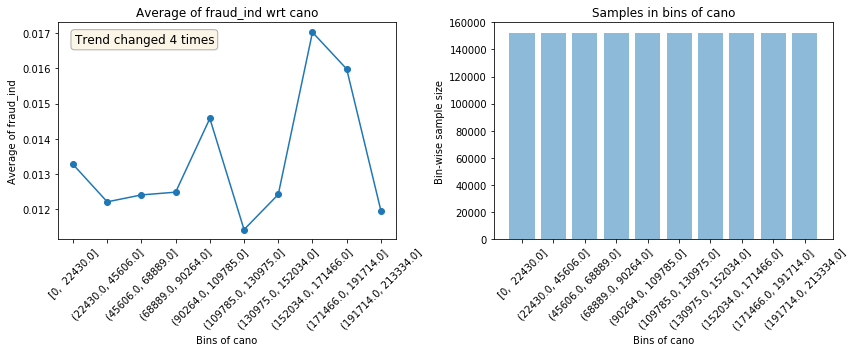

--------------------------------------------------------------------------------------------------------------




In [6]:
from featexp import get_univariate_plots

# Plots drawn for all features if nothing is passed in feature_list parameter.
get_univariate_plots(data=train_data, target_col='fraud_ind', 
                     features_list=['cano'], bins=10)

# 同一天該張卡活耀度

In [ ]:
# 同一天交易次數
sltn = total_data.groupby(by=['locdt'])['txkey'].count().rename('same_locdt_transaction_number').reset_index()
total_data = total_data.merge(sltn,on=['locdt'],how='left')
# 同一天該張卡活耀度
total_data['same_cano_same_locdt_hot_ratio'] = total_data['same_cano_same_locdt_transaction_number'] / total_data['same_locdt_transaction_number']

# 同一天該商品活耀度

In [1]:
# 同一天該商品活耀度
slsmtn = total_data.groupby(by=['locdt','mcc'])['txkey'].count().rename('same_locdt_same_mcc_transaction_number').reset_index()
total_data = total_data.merge(slsmtn,on=['locdt','mcc'],how='left')

total_data['same_mcc_same_locdt_hot_ratio'] = total_data['same_locdt_same_mcc_transaction_number'] / total_data['same_locdt_transaction_number']

NameError: name 'total_data' is not defined

# 同一天該商店活耀度

In [ ]:
# 同一天該商店活耀度
slsmtn = total_data.groupby(by=['locdt','mchno'])['txkey'].count().rename('same_locdt_same_mchno_transaction_number').reset_index()
total_data = total_data.merge(slsmtn,on=['locdt','mchno'],how='left')

total_data['same_mchno_same_locdt_hot_ratio'] = total_data['same_locdt_same_mchno_transaction_number'] / total_data['same_locdt_transaction_number']

In [5]:
non_fraud = total_data.loc[total_data['fraud_ind']==0]
fraud = total_data.loc[total_data['fraud_ind']==1]

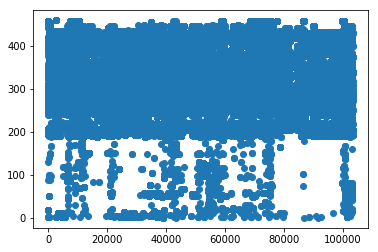

In [12]:
plt.scatter(non_fraud['mchno'],non_fraud['mcc'])

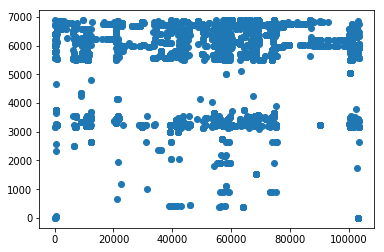

In [14]:
plt.scatter(fraud['mchno'],fraud['acqic'])